In [1]:
%matplotlib inline

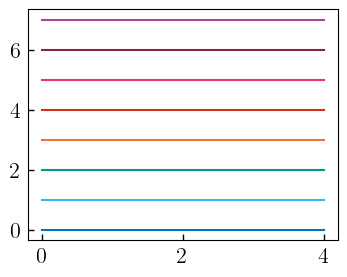

In [2]:
import numpy as np
from matplotlib import pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.patches import Patch
from matplotlib.lines import Line2D

from jax import numpy as jnp
from jax import jit as jjit
from jax import vmap
from jax import grad
from jax import random as jran
import os
import h5py
import time

mred = u"#d62728"
morange = u"#ff7f0e"
mgreen = u"#2ca02c"
mblue = u"#1f77b4"
mpurple = u"#9467bd"
fact = 1.0
plt.rcParams["figure.figsize"] = (4*fact, 3*fact)
plt.rc('font', family="serif")
plt.rc('font', size=18)
plt.rc('text', usetex=True)
plt.rc('text.latex', preamble=r'\usepackage{amsmath}') #necessary to use \dfrac
colors = ["#0077BB", "#33BBEE", "#009988", "#EE7733", "#CC3311", "#EE3377", '#882255', '#AA4499']
for i, x in enumerate(colors):
    plt.plot(np.ones(5)*i, color=x)

# Define some basic quantities

In [3]:
from diffstar.constants import TODAY
from diffstar.stars import fstar_tools
import astropy.units as u
from astropy.cosmology import Planck13, z_at_value

# Define our cosmci time array to make some predictions
#t_table = np.linspace(0.1, TODAY, 100)
# t_table = np.logspace(-1, np.log10(TODAY), 100)

t_table = (TODAY - Planck13.lookback_time(np.arange(0,2.1,0.5)).value)[::-1]
t_table = np.concatenate((np.linspace(1.0, 3, 5), t_table))
t_table = np.clip(t_table, None, TODAY)

t_table = np.linspace(1.0, TODAY, 20)
z_table = np.array([z_at_value(Planck13.age, x * u.Gyr, zmin=-1) for x in t_table])

t_sel_hists = np.argmin(np.subtract.outer(z_table, np.arange(0,2.1,0.5))**2, axis=0)[::-1]

print(t_table)
print(z_table)
lgt = np.log10(t_table)
# Define some mass bins for predictions
# logm0_binmids = np.linspace(11.5, 13.5, 5)
logm0_binmids = np.linspace(11.0, 14.0, 7)
# logm0_binmids = np.linspace(11.5, 12.5, 5)

# logm0_binmids = np.linspace(11.5, 13.0, 4)
logm0_binmids = np.linspace(11.5, 14.5, 4)
logm0_bin_widths = np.ones_like(logm0_binmids) * 0.1


# Define some useful quantities and masks for later
fstar_tdelay = 1.0
index_select, index_high = fstar_tools(t_table, fstar_tdelay=fstar_tdelay)


sm_loss_weight = jnp.where(t_table>2.0, 1.0, 1e10)
fstar_loss_MS_weight = jnp.where(t_table[index_select]>2.0, 1.0, 1e10)
fstar_loss_Q_weight = jnp.where(t_table[index_select]>5.0, 1.0, 1e10)

sm_loss_sel = np.arange(len(t_table))[t_table>1.0]
fstar_loss_MS_sel = np.arange(len(t_table[index_select]))[t_table[index_select]>2.0]
fstar_loss_Q_sel = np.arange(len(t_table[index_select]))[t_table[index_select]>5.0]


[ 1.          1.67368421  2.34736842  3.02105263  3.69473684  4.36842105
  5.04210526  5.71578947  6.38947368  7.06315789  7.73684211  8.41052632
  9.08421053  9.75789474 10.43157895 11.10526316 11.77894737 12.45263158
 13.12631579 13.8       ]
[ 5.67661227e+00  3.73151670e+00  2.76868538e+00  2.17615500e+00
  1.76718661e+00  1.46395279e+00  1.22776720e+00  1.03705322e+00
  8.78753233e-01  7.44467446e-01  6.28529755e-01  5.26970117e-01
  4.36919083e-01  3.56248271e-01  2.83343941e-01  2.16959313e-01
  1.56115215e-01  1.00031527e-01  4.80787238e-02 -2.57036385e-04]


/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


# Generate some individual MAH histories with DiffmahPop

from diffmah.monte_carlo_halo_population import mc_halo_population
from diffstarpop.utils import get_t50_p50

Nhalos = 100
logmpeak_diffmahpop = []
mah_params_diffmahpop = []

log_mahs = np.zeros((len(logm0_binmids), Nhalos, len(t_table)))
for i, binmid in enumerate(logm0_binmids):
    _res = mc_halo_population(t_table, TODAY, binmid * np.ones(Nhalos))
    _mahparams = np.array([
        np.ones(Nhalos)*np.log10(TODAY),
        binmid * np.ones(Nhalos),
        _res.lgtc,
        np.ones(Nhalos)*3.5,
        _res.early_index,
        _res.late_index,
    ]).T
    
    logmpeak_diffmahpop.append(binmid * np.ones(Nhalos))
    mah_params_diffmahpop.append(_mahparams)
    
    log_mahs[i] = _res.log_mah
    

    
logmpeak_diffmahpop = np.concatenate(logmpeak_diffmahpop)
mah_params_diffmahpop = np.concatenate(mah_params_diffmahpop)
log_mahs_diffmahpop = np.concatenate(log_mahs)

halo_data_MC = mah_params_diffmahpop[:, np.array([1,2,4,5])].copy() # We only need logm, logtauc, early, late

t50, p50 = get_t50_p50(t_table, 10**log_mahs_diffmahpop, 0.5, log_mahs_diffmahpop[:,-1], window_length = 9)
#p50 = p50.reshape((len(logm0_binmids), N))

halo_data_MC_diffmahpop = halo_data_MC.copy()
p50_diffmahpop = p50.copy()

In [4]:
from diffstar.utils import _get_dt_array
from diffstar.fit_smah_helpers import get_header

from diffstar.stars import (
    _get_bounded_sfr_params, 
    _get_unbounded_sfr_params,
    _get_unbounded_sfr_params_vmap,
    _get_bounded_sfr_params_vmap,
)
from diffstar.quenching import _get_bounded_q_params, _get_unbounded_q_params, _get_bounded_q_params_vmap, _get_unbounded_q_params_vmap

from diffmah.individual_halo_assembly import _calc_halo_history
from diffstarpop.utils import get_t50_p50

_calc_halo_history_vmap = jjit(vmap(_calc_halo_history, in_axes=(None, *[0]*6)))

def get_mah_params(runname, data_path):

    fitting_data = dict()

    fn = os.path.join(data_path, runname)
    with h5py.File(fn, "r") as hdf:
        for key in hdf.keys():
            if key == "halo_id":
                fitting_data[key] = hdf[key][...]
            else:
                fitting_data["fit_" + key] = hdf[key][...]

    mah_params = np.array(
        [
            np.log10(fitting_data["fit_t0"]),
            fitting_data["fit_logmp_fit"],
            fitting_data["fit_mah_logtc"],
            fitting_data["fit_mah_k"],
            fitting_data["fit_early_index"],
            fitting_data["fit_late_index"],
        ]
    ).T
    return mah_params

def get_sfh_params(run_name, path):
    sfr_fitdata = dict()

    fn = os.path.join(path, run_name)
    with h5py.File(fn, "r") as hdf:
        for key in hdf.keys():
            sfr_fitdata[key] = hdf[key][...]

    colnames = get_header()[1:].strip().split()
    sfr_colnames = colnames[1:6]
    q_colnames = colnames[6:10]

    u_fit_params = np.array([sfr_fitdata[key] for key in sfr_colnames + q_colnames]).T
    u_sfr_fit_params = np.array([sfr_fitdata[key] for key in sfr_colnames]).T
    u_q_fit_params = np.array([sfr_fitdata[key] for key in q_colnames]).T

    sfr_fit_params = _get_bounded_sfr_params_vmap(*u_sfr_fit_params.T)
    q_fit_params = _get_bounded_q_params_vmap(*u_q_fit_params.T)
    
    sfr_fit_params = np.array([np.array(x) for x in sfr_fit_params]).T
    q_fit_params = np.array([np.array(x) for x in q_fit_params]).T

    fit_params = np.concatenate((sfr_fit_params, q_fit_params), axis=1)
    
    return u_fit_params, fit_params

data_path = "/Users/alarcon/Documents/diffmah_data/"
mah_params_arr = get_mah_params("run1_tng_diffmah", data_path=data_path)

u_fit_params_arr, fit_params_arr = get_sfh_params("run1_tng_diffstar_default.h5", data_path)


In [5]:
def get_p50_tng(mah_params):
    tarr = np.linspace(0.1, TODAY, 100)

    dt = _get_dt_array(tarr)
    lgt = np.log10(tarr)
    log_mah = np.array(_calc_halo_history_vmap(lgt, *mah_params.T)[1])
    print(log_mah.shape)
    p50_arr = get_t50_p50(tarr, 10**log_mah, 0.5, log_mah[:,-1], window_length = 101)[1]
    return p50_arr

p50_arr = get_p50_tng(mah_params_arr)

(288405, 100)


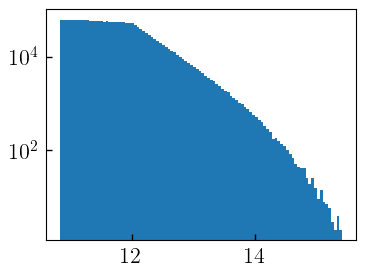

In [6]:
path = "/Users/alarcon/Documents/diffmah_data/SMDPL/"

mah_params_arr_SMDPL = np.load(path+"mah_params_arr_576_small.npy")
u_fit_params_arr_SMDPL = np.load(path+"u_fit_params_arr_576_small.npy")
fit_params_arr_SMDPL = np.load(path+"fit_params_arr_576_small.npy")
p50_arr_SMDPL = np.load(path+"p50_arr_576_small.npy")

logmpeak_SMDPL = mah_params_arr_SMDPL[:,1]

plt.hist(logmpeak_SMDPL, 100)
plt.yscale('log')
plt.show()

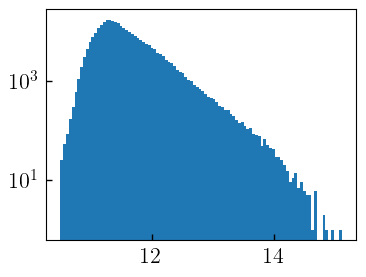

In [7]:

logmpeak = mah_params_arr[:,1]

plt.hist(logmpeak, 100)
plt.yscale('log')
plt.show()

In [49]:
tng_t = np.load("/Users/alarcon/Documents/diffmah_data/tng_cosmic_time.npy")
tng_halos = np.load("/Users/alarcon/Documents/diffmah_data/tng_diffmah.npy")

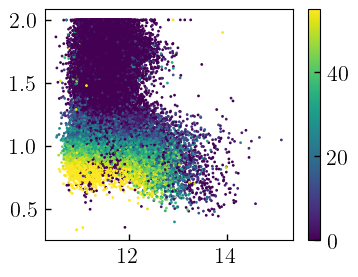

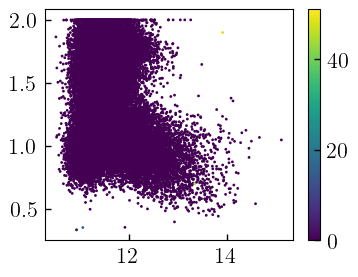

In [59]:

_choose = np.random.choice(len(logmpeak), int(5e4), replace=False)
plt.scatter(logmpeak[_choose], fit_params_arr[:,5][_choose], s=1, c=np.sum(tng_halos["sfh"][:,tng_t > 5.0]==0, axis=1)[_choose] )
plt.colorbar()
plt.show()

plt.scatter(logmpeak[_choose], fit_params_arr[:,5][_choose], s=1, c=np.sum(tng_halos["mpeakh"][:,tng_t > 5.0]==0, axis=1)[_choose] )
plt.colorbar()
plt.show()

NameError: name 'tng_t' is not defined

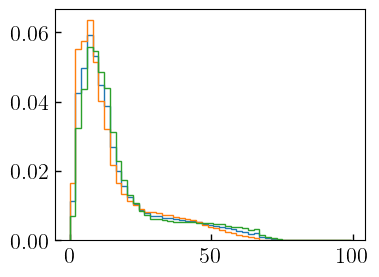

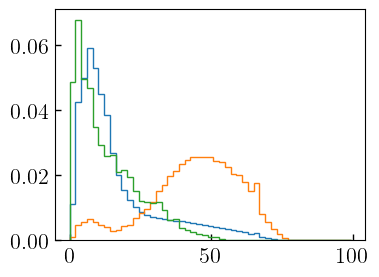

In [55]:
_bins = np.linspace(0,99.5,50)
plt.hist(np.sum(tng_halos["sfh"]==0, axis=1), _bins, histtype='step', density=1)
plt.hist(np.sum(tng_halos["sfh"]==0, axis=1)[logmpeak>11.5], _bins, histtype='step', density=1)
plt.hist(np.sum(tng_halos["sfh"]==0, axis=1)[logmpeak<11.5], _bins, histtype='step', density=1)
plt.show()
plt.hist(np.sum(tng_halos["sfh"]==0, axis=1), _bins, histtype='step', density=1)
plt.hist(np.sum(tng_halos["sfh"]==0, axis=1)[(logmpeak<11.5)&(fit_params_arr[:,5]<1.1)], _bins, histtype='step', density=1)
plt.hist(np.sum(tng_halos["sfh"]==0, axis=1)[(logmpeak>13.0)&(fit_params_arr[:,5]<1.1)], _bins, histtype='step', density=1)
plt.show()


In [8]:
from diffsky.diffndhist import tw_ndhist, tw_ndhist_weighted

bins_mstar = jnp.linspace(7, 12, 25)
bins_ssfr = jnp.linspace(-13, -8.5, 25)
delta_bins_mstar = float(jnp.diff(bins_mstar)[0])
delta_bins_ssfr = float(jnp.diff(bins_ssfr)[0])

bins_LO = []
bins_HI = []
for i in range(len(bins_mstar)-1):
    for j in range(len(bins_ssfr)-1):
        bins_LO.append([bins_mstar[i], bins_ssfr[j]])
        bins_HI.append([bins_mstar[i+1], bins_ssfr[j+1]])
bins_LO = np.array(bins_LO)
bins_HI = np.array(bins_HI)
bins_LO.shape, bins_HI.shape


((576, 2), (576, 2))

In [9]:
from diffstarpop.monte_carlo_diff_halo_population import (
    sm_sfr_history_diffstar_scan_XsfhXmah_vmap,
    sm_sfr_history_diffstar_scan_MS_XsfhXmah_vmap,
    _jax_get_dt_array,
    calc_hist_mstar_ssfr,
)
def calculate_SMDPL_sumstats(
    t_table,
    logm0_binmids,
    logm0_bin_widths,
    mah_params, 
    fit_params, 
    p50,
    bins_LO, 
    bins_HI
):
    logmpeak = mah_params[:, 1]

    lgt = np.log10(t_table)

    fstar_tdelay = 1.0
    index_select, index_high = fstar_tools(t_table, fstar_tdelay=fstar_tdelay)
    dt = _jax_get_dt_array(t_table)

    stats = []
    for i in range(len(logm0_binmids)):

        print("Calculating m0=[%.2f, %.2f]"%(logm0_binmids[i] - logm0_bin_widths[i], logm0_binmids[i] + logm0_bin_widths[i]))
        sel = (logmpeak > logm0_binmids[i] - logm0_bin_widths[i]) & (logmpeak < logm0_binmids[i] + logm0_bin_widths[i])
        print("Nhalos:", sel.sum())
        _res = sm_sfr_history_diffstar_scan_XsfhXmah_vmap(
            t_table,
            lgt,
            dt,
            mah_params[sel][:, [1,2,4,5]],
            fit_params[sel][:,[0,1,2,4]].copy(),
            fit_params[sel][:,[5,6,7,8]].copy(),
            index_select,
            index_high,
            fstar_tdelay,
        )
        
        (
            mstar_histories,
            sfr_histories,
            fstar_histories,
        ) = _res
        
        ssfr = sfr_histories / mstar_histories
        weights_quench_bin = jnp.where(ssfr > 1e-11, 1.0, 0.0)
        
        n_histories = len(mstar_histories)
        ndsig = np.ones((n_histories, 2))
        ndsig[:,0] *= delta_bins_mstar
        ndsig[:,1] *= delta_bins_ssfr

        _stats = calculate_sumstats_bin(
            mstar_histories, 
            sfr_histories, 
            p50[sel], 
            weights_quench_bin,
            ndsig, bins_LO, bins_HI
        )
        stats.append(_stats)

    print("Reshaping results")
        
    new_stats = []
    nres = len(_stats)
    for j in range(nres):
        _new_stats = []
        for i in range(len(logm0_binmids)):
            _new_stats.append(stats[i][j])
        new_stats.append(np.array(_new_stats))


    # np.save("/Users/alarcon/Documents/diffmah_data/SMDPL_sfh_sumstats.npy", new_stats)
    return new_stats



def calculate_sumstats_bin(
    mstar_histories, sfr_histories, p50, weights_MS, ndsig, bins_LO, bins_HI
):

    weights_Q = 1.0 - weights_MS

    # Clip weights. When all weights in a time
    # step are 0, Nans will occur in gradients.
    eps = 1e-10
    weights_Q = jnp.clip(weights_Q, eps, None)
    weights_MS = jnp.clip(weights_MS, eps, None)

    weights_early = jnp.where(p50 < 0.5, 1.0, 0.0)
    weights_late = 1.0 - weights_early
    weights_early = jnp.clip(weights_early, eps, None)
    weights_late = jnp.clip(weights_late, eps, None)

    ssfr = sfr_histories / mstar_histories
    
    mstar_histories = jnp.where(mstar_histories > 0.0, jnp.log10(mstar_histories), 0.0)
    sfr_histories = jnp.where(sfr_histories > 0.0, jnp.log10(sfr_histories), 0.0)
    
    ssfr = jnp.where(ssfr > 0.0, jnp.log10(ssfr), -50.0)

    mean_sm = jnp.average(mstar_histories, axis=0)
    mean_sfr_MS = jnp.average(sfr_histories, weights=weights_MS, axis=0)
    mean_sfr_Q = jnp.average(sfr_histories, weights=weights_Q, axis=0)

    mean_sm_early = jnp.average(mstar_histories, weights=weights_early, axis=0)
    mean_sm_late = jnp.average(mstar_histories, weights=weights_late, axis=0)

    variance_sm = jnp.average(
        (mstar_histories - mean_sm[None, :]) ** 2, axis=0,
    )

    variance_sfr_MS = jnp.average(
        (sfr_histories - mean_sfr_MS[None, :]) ** 2, weights=weights_MS, axis=0,
    )
    variance_sfr_Q = jnp.average(
        (sfr_histories - mean_sfr_Q[None, :]) ** 2, weights=weights_Q, axis=0,
    )
    variance_sm_early = jnp.average(
        (mstar_histories - mean_sm[None, :]) ** 2, weights=weights_early, axis=0,
    )
    variance_sm_late = jnp.average(
        (mstar_histories - mean_sm[None, :]) ** 2, weights=weights_late, axis=0,
    )

    NHALO_MS = jnp.sum(weights_MS, axis=0)
    NHALO_Q = jnp.sum(weights_Q, axis=0)
    quench_frac = NHALO_Q / (NHALO_Q + NHALO_MS)

    mean_sfr_Q = jnp.where(quench_frac == 0.0, 0.0, mean_sfr_Q)
    variance_sfr_Q = jnp.where(quench_frac == 0.0, 0.0, variance_sfr_Q)
    mean_sfr_MS = jnp.where(quench_frac == 1.0, 0.0, mean_sfr_MS)
    variance_sfr_MS = jnp.where(quench_frac == 1.0, 0.0, variance_sfr_MS)

    NHALO_MS_early = jnp.sum(weights_MS * weights_early[:, None], axis=0)
    NHALO_Q_early = jnp.sum(weights_Q * weights_early[:, None], axis=0)
    quench_frac_early = NHALO_Q_early / (NHALO_Q_early + NHALO_MS_early)

    NHALO_MS_late = jnp.sum(weights_MS * weights_late[:, None], axis=0)
    NHALO_Q_late = jnp.sum(weights_Q * weights_late[:, None], axis=0)
    quench_frac_late = NHALO_Q_late / (NHALO_Q_late + NHALO_MS_late)
    
    
    """
    counts = np.zeros((len(t_table[t_sel_hists]), len(bins_mstar)-1, len(bins_mstar)-1))
    for i, tid in enumerate(t_sel_hists):
        _counts = np.histogram2d(mstar_histories[:,tid], ssfr[:,tid], bins=[bins_mstar, bins_ssfr])[0]
        # _counts = np.clip(_counts, 1e-10, None)
        _counts /= _counts.sum()
        counts[i] = _counts
        
    counts = counts.reshape(len(t_sel_hists), (len(bins_mstar)-1)*(len(bins_mstar)-1))
    """
    weight = jnp.ones(len(sfr_histories))
    counts = calc_hist_mstar_ssfr(
        mstar_histories.T[t_sel_hists], ssfr.T[t_sel_hists], ndsig, weight, bins_LO, bins_HI
    )

    _out = (
        mean_sm,
        variance_sm,
        mean_sfr_MS,
        mean_sfr_Q,
        variance_sfr_MS,
        variance_sfr_Q,
        quench_frac,
        mean_sm_early,
        mean_sm_late,
        variance_sm_early,
        variance_sm_late,
        quench_frac_early,
        quench_frac_late,
        counts,
    )
    return _out

MC_res_target = calculate_SMDPL_sumstats(
    t_table,
    logm0_binmids,
    logm0_bin_widths,
    mah_params_arr, 
    u_fit_params_arr, 
    p50_arr,
    bins_LO, 
    bins_HI
)

# MC_res_target = np.array(MC_res_target)

Calculating m0=[11.40, 11.60]
Nhalos: 55273
Calculating m0=[12.40, 12.60]
Nhalos: 5991
Calculating m0=[13.40, 13.60]
Nhalos: 557
Calculating m0=[14.40, 14.60]
Nhalos: 27
Reshaping results


In [10]:
MC_res_target_SMDPL = calculate_SMDPL_sumstats(
    t_table,
    logm0_binmids,
    logm0_bin_widths,
    mah_params_arr_SMDPL, 
    u_fit_params_arr_SMDPL, 
    p50_arr_SMDPL,
    bins_LO, 
    bins_HI
)


Calculating m0=[11.40, 11.60]
Nhalos: 251579
Calculating m0=[12.40, 12.60]
Nhalos: 81419
Calculating m0=[13.40, 13.60]
Nhalos: 8594
Calculating m0=[14.40, 14.60]
Nhalos: 474
Reshaping results


In [11]:
normal_values = (mah_params_arr[:, 4] < 4.5)
normal_values &= (mah_params_arr[:, 2] < 2.0)

Nhalos = 3000
halo_data_MC = []
p50 = []
for i in range(len(logm0_binmids)):
    _sel = (logmpeak > logm0_binmids[i] - logm0_bin_widths[i]) & (logmpeak < logm0_binmids[i] + logm0_bin_widths[i])
    _sel &= normal_values
    print(_sel.sum())
    sel = np.random.choice(np.arange(len(p50_arr))[_sel], Nhalos, replace=True)
    halo_data_MC.append(mah_params_arr[sel])
    p50.append(p50_arr[sel])
halo_data_MC = np.concatenate(halo_data_MC, axis=0)[:, np.array([1,2,4,5])]
p50 = np.concatenate(p50, axis=0)


54190
5784
515
24


In [12]:
normal_values_SMDPL = (mah_params_arr_SMDPL[:, 4] < 4.5)
normal_values_SMDPL &= (mah_params_arr_SMDPL[:, 2] < 2.0)

Nhalos = 3000
halo_data_MC_SMDPL = []
p50_SMDPL = []
for i in range(len(logm0_binmids)):
    _sel = (logmpeak_SMDPL > logm0_binmids[i] - logm0_bin_widths[i]) & (logmpeak_SMDPL < logm0_binmids[i] + logm0_bin_widths[i])
    _sel &= normal_values_SMDPL
    print(_sel.sum())
    sel = np.random.choice(np.arange(len(p50_arr_SMDPL))[_sel], Nhalos, replace=True)
    halo_data_MC_SMDPL.append(mah_params_arr_SMDPL[sel])
    p50_SMDPL.append(p50_arr_SMDPL[sel])
halo_data_MC_SMDPL = np.concatenate(halo_data_MC_SMDPL, axis=0)[:, np.array([1,2,4,5])]
p50_SMDPL = np.concatenate(p50_SMDPL, axis=0)


248289
80336
8472
455


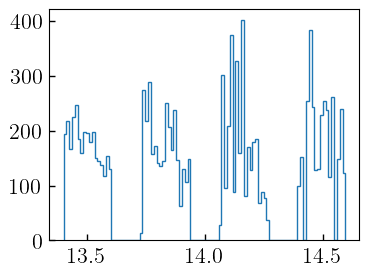

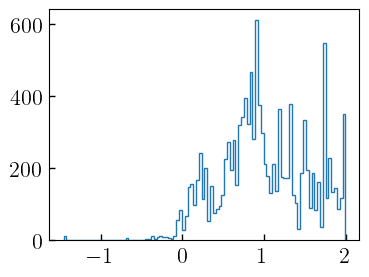

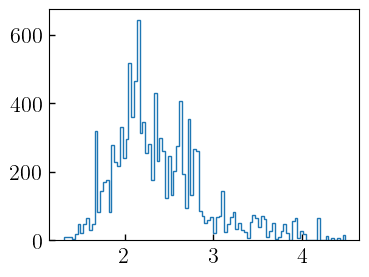

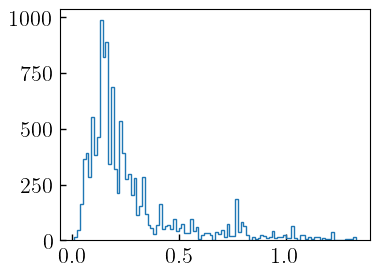

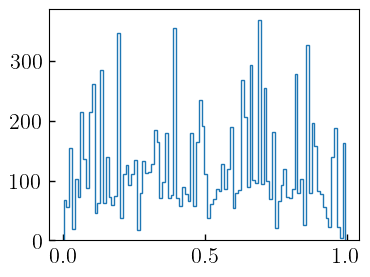

In [14]:
for i in range(4):
    # plt.hist(halo_data_MC_diffmahpop[:,i], 100, histtype='step')
    plt.hist(halo_data_MC[:,i], 100, histtype='step')
    plt.show()
    
plt.hist(p50, 100, histtype='step')
plt.show()

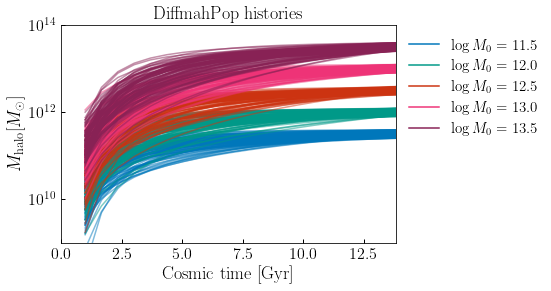

In [10]:
colors = ["#0077BB", "#33BBEE", "#009988", "#EE7733", "#CC3311", "#EE3377", '#882255', '#AA4499']
fig, ax = plt.subplots()

ax.plot(t_table, 10**log_mahs[0].T, colors[0], alpha=0.5)
ax.plot(t_table, 10**log_mahs[1].T, colors[2], alpha=0.5)
ax.plot(t_table, 10**log_mahs[2].T, colors[4], alpha=0.5)
ax.plot(t_table, 10**log_mahs[3].T, colors[5], alpha=0.5)
ax.plot(t_table, 10**log_mahs[4].T, colors[6], alpha=0.5)
ax.set_yscale('log')
ax.set_ylim(1e9, 1e14)
ax.set_xlim(0, TODAY)
ax.set_xlabel('Cosmic time [Gyr]')
ax.set_ylabel(r'$M_{\rm halo} [M_\odot]$')
ax.set_title("DiffmahPop histories")

legend_elements = [
    Line2D([0], [0], color=colors[0], label=r'$\log M_0 = %.1f$'%logm0_binmids[0]),
    Line2D([0], [0], color=colors[2], label=r'$\log M_0 = %.1f$'%logm0_binmids[1]),
    Line2D([0], [0], color=colors[4], label=r'$\log M_0 = %.1f$'%logm0_binmids[2]),
    Line2D([0], [0], color=colors[5], label=r'$\log M_0 = %.1f$'%logm0_binmids[3]),
    Line2D([0], [0], color=colors[6], label=r'$\log M_0 = %.1f$'%logm0_binmids[4]),
]
ax.legend(handles=legend_elements, loc=2, bbox_to_anchor=(1,1,))

plt.show()

### Get the default DiffstarPOP parameters for quenched and main sequence populations

In [13]:
from diffstarpop.pdf_quenched import DEFAULT_SFH_PDF_QUENCH_PARAMS
from diffstarpop.pdf_mainseq import DEFAULT_SFH_PDF_MAINSEQ_PARAMS

DEFAULT_SFH_PDF_QUENCH_PARAMS, DEFAULT_SFH_PDF_MAINSEQ_PARAMS

(OrderedDict([('frac_quench_x0', 11.86),
              ('frac_quench_k', 1.611),
              ('frac_quench_ylo', -0.872),
              ('frac_quench_yhi', 2.139),
              ('mean_ulgm_quench_ylo', 11.54),
              ('mean_ulgm_quench_yhi', 12.08),
              ('mean_ulgy_quench_ylo', 0.481),
              ('mean_ulgy_quench_yhi', -0.223),
              ('mean_ul_quench_ylo', -1.274),
              ('mean_ul_quench_yhi', 1.766),
              ('mean_utau_quench_ylo', 55.48),
              ('mean_utau_quench_yhi', -66.54),
              ('mean_uqt_quench_ylo', 1.744),
              ('mean_uqt_quench_yhi', 0.042),
              ('mean_uqs_quench_ylo', -2.979),
              ('mean_uqs_quench_yhi', 3.52),
              ('mean_udrop_quench_ylo', -0.508),
              ('mean_udrop_quench_yhi', -3.785),
              ('mean_urej_quench_ylo', 2.139),
              ('mean_urej_quench_yhi', -3.043),
              ('chol_ulgm_ulgm_quench_ylo', -1.645),
              ('chol_ulgm_ulg

### Get the default DiffstarPOP assembly bias parameters

In [14]:
from diffstarpop.pdf_model_assembly_bias_shifts import DEFAULT_R_MAINSEQ_PARAMS, DEFAULT_R_QUENCH_PARAMS

DEFAULT_R_MAINSEQ_PARAMS, DEFAULT_R_QUENCH_PARAMS

(OrderedDict([('R_ulgm_mainseq_ylo', -0.558),
              ('R_ulgm_mainseq_yhi', 0.575),
              ('R_ulgy_mainseq_ylo', -1.227),
              ('R_ulgy_mainseq_yhi', 2.171),
              ('R_ul_mainseq_ylo', 5.164),
              ('R_ul_mainseq_yhi', -3.384),
              ('R_utau_mainseq_ylo', 5.828),
              ('R_utau_mainseq_yhi', -5.587)]),
 OrderedDict([('R_Fquench', 0.994),
              ('R_ulgm_quench_ylo', -1.264),
              ('R_ulgm_quench_yhi', 0.44),
              ('R_ulgy_quench_ylo', -0.165),
              ('R_ulgy_quench_yhi', -1.083),
              ('R_ul_quench_ylo', 5.653),
              ('R_ul_quench_yhi', -4.126),
              ('R_utau_quench_ylo', 5.613),
              ('R_utau_quench_yhi', -6.922),
              ('R_uqt_quench_ylo', 0.19),
              ('R_uqt_quench_yhi', 0.191),
              ('R_uqs_quench_ylo', 2.124),
              ('R_uqs_quench_yhi', -2.699),
              ('R_udrop_quench_ylo', 1.071),
              ('R_udrop_quench_yh

# Draw individual SFH histories 


In [15]:
from diffstarpop.monte_carlo_diff_halo_population import (
    draw_sfh_Q_vmap,
    draw_sfh_MS_vmap,
    draw_sfh_MIX_vmap,
    draw_sfh_MIX,
)


In [16]:
def dict_to_array(dictionary):
    return np.array(list(dictionary.values()))

# Calculate first and second order moments of Mstar, SFH with DiffstarPop drawing individual SFH histories


### Compare the calculations between two different `diffstar` kernel implementations using `vmap` or `scan` 

In [17]:
from diffstarpop.monte_carlo_diff_halo_population import (
    sumstats_sfh_Q_vmap,
    sumstats_sfh_MS_vmap,
    sumstats_sfh_MIX_vmap,
    sumstats_sfh_MIX_p50_vmap,
    sumstats_sfh_with_hists_vmap,
)


In [18]:
from diffstarpop.monte_carlo_diff_halo_population import sumstats_sfh_with_hists
from functools import partial
from jax import lax

from diffstarpop.fit_pop_helpers import *
from functools import partial
from diffstarpop.monte_carlo_diff_halo_population import (
    _tw_cuml_lax_kern_vmap,
    compute_sumstats_MIX_p50,
    calc_hist_mstar_ssfr,
)



In [19]:
from diffstarpop.fit_pop_helpers import (
    loss_p50, loss_p50_deriv, loss_p50_deriv_np,
    loss_hists, loss_hists_deriv, loss_hists_deriv_np,
    loss_hists_vmap, loss_hists_vmap_deriv, loss_hists_vmap_deriv_np,
)
# from diffstarpop.utils import minimizer, minimize


In [20]:
from diffstarpop.fit_pop_helpers import *
from functools import partial
@partial(jjit, static_argnames=["n_histories"])
def loss_hists_vmap(params, loss_data, n_histories, ran_key):
    (
        t_table,
        logm0_binmids,
        halo_data,
        p50,
        index_select,
        index_high,
        sfr_tdelay,
        ndsig,
        bins_LO,
        bins_HI,
        t_sel_hists,
        target_data,
        # target_data_weights,
    ) = loss_data
    (
        mean_sm_target,
        variance_sm_target,
        mean_sfr_MS_target,
        mean_sfr_Q_target,
        variance_sfr_MS_target,
        variance_sfr_Q_target,
        quench_frac_target,
        mean_sm_early_target,
        mean_sm_late_target,
        variance_sm_early_target,
        variance_sm_late_target,
        quench_frac_early_target,
        quench_frac_late_target,
        counts_target,
    ) = target_data

    _npar = 0
    pdf_q_params = params[_npar : _npar + N_PDF_Q]
    _npar += N_PDF_Q
    pdf_ms_params = params[_npar : _npar + N_PDF_MS]
    _npar += N_PDF_MS
    r_q_params = params[_npar : _npar + N_R_Q]
    _npar += N_R_Q
    r_ms_params = params[_npar : _npar + N_R_MS]

    _res = sumstats_sfh_with_hists_vmap(
        t_table,
        logm0_binmids,
        halo_data,
        p50,
        n_histories,
        ran_key,
        index_select,
        index_high,
        sfr_tdelay,
        ndsig,
        bins_LO,
        bins_HI,
        t_sel_hists,
        pdf_q_params,
        pdf_ms_params,
        r_q_params,
        r_ms_params,
    )
    (
        mean_sm,
        variance_sm,
        mean_sfr_MS,
        mean_sfr_Q,
        variance_sfr_MS,
        variance_sfr_Q,
        quench_frac,
        mean_sm_early,
        mean_sm_late,
        variance_sm_early,
        variance_sm_late,
        quench_frac_early,
        quench_frac_late,
        counts,
    ) = _res

    wQ = jnp.where(quench_frac_target > 0.01, 1.0, 0.0)
    wSF = jnp.where(quench_frac_target < 0.99, 1.0, 0.0)
    
    loss = mse(mean_sm, mean_sm_target)
    loss += mse(mean_sm_early, mean_sm_early_target)
    loss += mse(mean_sm_late, mean_sm_late_target)
    """
    loss += mse_var(variance_sm, variance_sm_target)
    loss += msew(mean_sfr_MS, mean_sfr_MS_target, wSF)
    loss += msew(mean_sfr_Q, mean_sfr_Q_target, wQ)
    loss += msew_var(variance_sfr_MS, variance_sfr_MS_target, wSF)
    loss += msew_var(variance_sfr_Q, variance_sfr_Q_target, wQ)
    loss += mse(quench_frac, quench_frac_target)

    loss += mse_var(variance_sm_early, variance_sm_early_target)
    loss += mse_var(variance_sm_late, variance_sm_late_target)
    loss += mse(quench_frac_early, quench_frac_early_target)
    loss += mse(quench_frac_late, quench_frac_late_target)
    """
    loss += 1e4 * mse(counts, counts_target)
    #loss += (1.0 / 20.0) * mse_arch(counts, counts_target)

    return loss

loss_hists_vmap_deriv = jjit(
    grad(loss_hists_vmap, argnums=(0)), static_argnames=["n_histories"]
)


def loss_hists_vmap_deriv_np(params, data, n_histories, ran_key):
    return np.array(loss_hists_vmap_deriv(params, data, n_histories, ran_key)).astype(
        float
    )

In [21]:

from diffstarpop.json_utils import load_params, write_params_json, print_all_default_dicts
path_json = "/Users/alarcon/Documents/source/diffstarpop/diffstarpop/bestfit_diffstarpop_params_UM_hists_v4.json"
outputs = load_params(path_json)




In [22]:
ran_key = jran.PRNGKey(np.random.randint(2**32))
n_histories = int(1e3)

N_PDF_Q = len(DEFAULT_SFH_PDF_QUENCH_PARAMS)
N_PDF_MS = len(DEFAULT_SFH_PDF_MAINSEQ_PARAMS)
N_R_Q = len(DEFAULT_R_QUENCH_PARAMS)
N_R_MS = len(DEFAULT_R_MAINSEQ_PARAMS)

ndsig = np.ones((2*n_histories, 2))
ndsig[:,0] *= delta_bins_mstar
ndsig[:,1] *= delta_bins_ssfr



_loss_data = (
    t_table,
    logm0_binmids,
    halo_data_MC.reshape(len(logm0_binmids),Nhalos,4),
    p50.reshape(len(logm0_binmids),Nhalos),
    index_select,
    index_high,
    fstar_tdelay,
    ndsig,
    bins_LO,
    bins_HI,
    t_sel_hists,
    MC_res_target
)

"""
init_guess = np.concatenate((
    dict_to_array(DEFAULT_SFH_PDF_QUENCH_PARAMS),
    dict_to_array(DEFAULT_SFH_PDF_MAINSEQ_PARAMS),
    dict_to_array(DEFAULT_R_QUENCH_PARAMS),
    dict_to_array(DEFAULT_R_MAINSEQ_PARAMS),
))
"""
init_guess = outputs[0].copy()


"""
# loss_hists(p, _loss_data, n_histories, ran_key)
t0 = time.time()
print(loss_hists_scan(init_guess.copy(), _loss_data, n_histories, ran_key))
t1 = time.time()
print("loss scan", t1-t0)

t0 = time.time()
print(loss_hists_scan_deriv_np(init_guess.copy(), _loss_data, n_histories, ran_key))
t1 = time.time()
print("grad scan", t1-t0)

"""
t0 = time.time()
print(loss_hists_vmap(init_guess.copy(), _loss_data, n_histories, ran_key))
t1 = time.time()
print("loss vmap", t1-t0)
#"""
t0 = time.time()
print(loss_hists_vmap_deriv_np(init_guess.copy(), _loss_data, n_histories, ran_key))
t1 = time.time()
print("grad vmap", t1-t0)
#"""

0.6305952
loss vmap 4.472480058670044
[ 1.71282947e-01  1.33003490e-02 -5.54682240e-02 -3.36356834e-02
  1.12174869e-01 -2.97125071e-01 -3.43776286e-01 -4.46003258e-01
  8.78947228e-02  6.64916784e-02  2.15671770e-02  1.52105736e-02
 -5.52991748e-01 -9.55104232e-01  5.32072335e-02  8.52559358e-02
 -1.37933269e-02 -3.08289900e-02 -8.98077898e-03 -2.00227369e-02
  1.27447676e-02  1.89951044e-02  2.32750803e-01  2.75911480e-01
  1.14230692e-01  1.24610648e-01  2.48469740e-01  3.22946161e-01
  1.50610115e-02  1.63807552e-02 -4.51192781e-02 -9.74966511e-02
 -1.70713849e-02 -4.10637781e-02 -1.17882825e-02 -1.69756096e-02
 -4.26616520e-04 -2.13757111e-03  1.40193314e-03  2.33409856e-03
  3.89902480e-03  3.91068868e-03 -2.71775108e-03 -3.69147072e-03
  1.57522932e-02  2.02596746e-02 -3.89005840e-02 -6.01281971e-02
 -3.98536446e-04 -9.91937472e-04 -1.50177465e-03 -3.57407914e-03
 -1.89015176e-03 -3.39676719e-03  3.49864140e-02  5.72602898e-02
  2.11145682e-03  4.40521166e-03  1.03585480e-04 -3.

In [20]:
len(MC_res_target)

14

In [31]:
from jax.example_libraries import optimizers as jax_opt

In [22]:
n_histories = int(1e3)
n_step = int(1e4)
step_size=0.01
params_init = init_guess.copy()

ran_key = jran.PRNGKey(np.random.randint(2**32))

_loss_data = (
    t_table,
    logm0_binmids,
    halo_data_MC.reshape(len(logm0_binmids),Nhalos,4),
    p50.reshape(len(logm0_binmids),Nhalos),
    index_select,
    index_high,
    fstar_tdelay,
    MC_res_target[:-1]
)

init_guess = outputs[0].copy()

params_init = init_guess.copy()


loss_arr = np.zeros(n_step).astype("f4") + np.inf

opt_init, opt_update, get_params = jax_opt.adam(step_size)
opt_state = opt_init(params_init)

n_params = len(params_init)
params_arr = np.zeros((n_step, n_params)).astype("f4")

n_mah = 100
sampled_mahs_inds_arr = np.zeros((n_step, n_histories))
no_nan_grads_arr = np.zeros(n_step)
for istep in range(n_step):
    t0 = time.time()
    ran_key, subkey = jran.split(ran_key, 2)

    p = np.array(get_params(opt_state))

    loss = loss_p50(p, _loss_data, n_histories, ran_key)
    grads = loss_p50_deriv(p, _loss_data, n_histories, ran_key)
    
    no_nan_params = np.all(np.isfinite(p))
    no_nan_loss = np.isfinite(loss)
    no_nan_grads = np.all(np.isfinite(grads))
    if ~no_nan_params | ~no_nan_loss | ~no_nan_grads:
        # break
        if istep > 0:
            indx_best = np.nanargmin(loss_arr[:istep])
            best_fit_params = params_arr[indx_best]
            best_fit_loss = loss_arr[indx_best]
        else:
            best_fit_params = np.copy(p)
            best_fit_loss = 999.99
    else:
        params_arr[istep, :] = p
        loss_arr[istep] = loss
        opt_state = opt_update(istep, grads, opt_state)
        
    keys = jran.split(ran_key, 5)
    

    sampled_mahs_inds = jran.choice(
        keys[0], n_mah, shape=(n_histories,), replace=True
    )
    sampled_mahs_inds_arr[istep] = sampled_mahs_inds
    no_nan_grads_arr[istep] = ~no_nan_grads
    t1 = time.time()
    print(istep, loss, t1-t0, no_nan_grads)
    if ~no_nan_grads:
         break
"""
indx_best = np.nanargmin(loss_arr)
best_fit_params = params_arr[indx_best]
loss = loss_arr[indx_best]
"""


0 1.2110546 36.44117498397827 True
1 1.0817351 4.137084245681763 True
2 1.0963231 4.06754994392395 True
3 1.1090698 4.087324857711792 True
4 0.9990768 4.100244998931885 True
5 0.9945595 4.059726715087891 True
6 0.90779525 4.080099105834961 True
7 1.037004 4.072710990905762 True
8 0.854741 4.061632871627808 True
9 0.94690585 4.104881286621094 True
10 0.8552207 4.073062896728516 True
11 0.8509606 4.149048089981079 True
12 0.74239224 4.065335035324097 True
13 0.7711345 4.058242082595825 True
14 0.7850407 4.0716681480407715 True
15 0.72125924 4.052552938461304 True
16 0.85127556 4.165091037750244 True
17 0.83246785 4.363221168518066 True
18 0.64972687 4.204437017440796 True
19 0.6868592 4.093837022781372 True
20 0.64256805 4.08961296081543 True
21 0.769767 4.086706876754761 True
22 0.6940903 4.049763202667236 True
23 0.6033199 4.201409101486206 True
24 0.7367105 4.033907890319824 True
25 0.62433356 4.053740978240967 True
26 0.58699554 4.052260875701904 True
27 0.56587327 4.034179925918579 

222 0.40345454 4.3236401081085205 True
223 0.40705183 4.132223129272461 True
224 0.3815706 4.368003845214844 True
225 0.39138508 4.274717092514038 True
226 0.40140676 4.448283910751343 True
227 0.39367396 4.3635618686676025 True
228 0.39321932 4.200308084487915 True
229 0.3954558 4.394602060317993 True
230 0.41549063 4.328265905380249 True
231 0.38513622 4.352993965148926 True
232 0.3841264 4.328252077102661 True
233 0.38572592 4.352564096450806 True
234 0.38094074 4.274967193603516 True
235 0.36193433 4.243613958358765 True
236 0.37268874 4.394115924835205 True
237 0.41658628 4.309609889984131 True
238 0.37889382 4.461036920547485 True
239 0.371685 4.242053270339966 True
240 0.39452985 4.390333890914917 True
241 0.40200093 4.314557790756226 True
242 0.3733782 4.370945930480957 True
243 0.38298884 4.271478176116943 True
244 0.3760876 4.427741289138794 True
245 0.35129297 4.19881796836853 True
246 0.37308788 4.3512372970581055 True
247 0.39147675 4.332746982574463 True
248 0.38664272 4.

440 0.3305876 4.528609991073608 True
441 0.32949317 4.468506097793579 True
442 0.3278341 4.5090861320495605 True
443 0.34572732 4.510433912277222 True
444 0.36447772 4.4912848472595215 True
445 0.32886374 4.522112846374512 True
446 0.31688866 4.4956958293914795 True
447 0.33733803 4.4849348068237305 True
448 0.3139694 4.483757734298706 True
449 0.39033753 4.511703968048096 True
450 0.32184914 4.495630979537964 True
451 0.33860517 4.5062267780303955 True
452 0.31722793 4.518840074539185 True
453 0.33078006 4.5193727016448975 True
454 0.41633305 4.510836839675903 True
455 0.30577517 4.477843999862671 True
456 0.31944162 4.450366020202637 True
457 0.3564709 4.468461036682129 True
458 0.33949956 4.467479705810547 False
459 0.36128646 4.483444929122925 True
460 0.3705446 4.458808183670044 False
461 0.32445848 4.458161354064941 False
462 0.30691263 4.471921920776367 True
463 0.3529283 4.474907159805298 True
464 0.3127148 4.4849159717559814 True
465 0.35019228 4.487089157104492 True
466 0.344

657 0.32891726 4.337862253189087 False
658 0.2676934 4.297153949737549 True
659 0.2863177 4.345678091049194 True
660 0.30974668 4.294276714324951 True
661 0.31409666 4.3093037605285645 True
662 0.33840844 4.324642896652222 True
663 0.27489036 4.350663900375366 True
664 0.28917494 4.3506760597229 False
665 0.32706976 4.244133949279785 False
666 0.29519868 4.483827829360962 False
667 0.3576334 4.469435214996338 False
668 0.29329184 4.345047950744629 False
669 0.30494156 4.190129041671753 False
670 0.2662359 4.46192193031311 False
671 0.30634776 4.204787969589233 True
672 0.36769578 4.367247819900513 True
673 0.30862257 4.4597790241241455 True
674 0.31302816 4.436362981796265 False
675 0.28237972 4.401764869689941 False
676 0.2884526 4.334506034851074 False
677 0.30691448 4.3043859004974365 True
678 0.26328698 4.334683895111084 True
679 0.32879952 4.379964828491211 True
680 0.277735 4.341391086578369 False
681 0.33534408 4.248764276504517 True
682 0.27935103 4.504805326461792 True
683 0.3

871 0.26756507 4.365225315093994 False
872 0.29866403 4.346145153045654 False
873 0.30145597 4.354990720748901 False
874 0.30743018 4.125767946243286 False
875 0.26547658 4.464437007904053 False
876 0.30908322 4.4608118534088135 False
877 0.2686816 4.420297145843506 False
878 0.27325872 4.328297138214111 False
879 0.29459956 4.402151346206665 False
880 0.30928352 4.318737983703613 False
881 0.2808472 4.479081153869629 False
882 0.3147216 4.342617034912109 False
883 0.2982351 4.361079216003418 False
884 0.32945654 4.254410982131958 False
885 0.28244242 4.397417068481445 False
886 0.27990365 4.246683835983276 False
887 0.32299432 4.451662063598633 False
888 0.32371816 4.3361358642578125 False
889 0.35743603 4.32540488243103 True
890 0.27122593 4.36292028427124 False
891 0.33183458 4.342857837677002 False
892 0.37666556 4.306550025939941 True
893 0.32221696 4.45966911315918 False
894 0.30517948 4.342416048049927 False
895 0.30252427 4.1941211223602295 False
896 0.30494946 4.36068606376647

1084 0.22585267 4.225727081298828 True
1085 0.2339068 4.199656009674072 True
1086 0.22801247 4.20241117477417 True
1087 0.22094327 4.2534520626068115 True
1088 0.2237656 4.220410108566284 True
1089 0.28586924 4.247282266616821 True
1090 0.22672921 4.13807487487793 True
1091 0.22128329 4.102123975753784 True
1092 0.23656097 4.115152835845947 True
1093 0.22640704 4.096809148788452 True
1094 0.22088337 4.095953941345215 True
1095 0.26774672 4.0675859451293945 True
1096 0.22555275 4.079413890838623 True
1097 0.23793912 4.1636481285095215 True
1098 0.22505389 4.4444427490234375 True
1099 0.22415307 4.515260934829712 True
1100 0.22109833 4.4556639194488525 True
1101 0.22457883 4.460639953613281 True
1102 0.222582 4.4761950969696045 True
1103 0.2193841 4.457458019256592 True
1104 0.23206326 4.481158256530762 True
1105 0.23226875 4.4975550174713135 True
1106 0.23708679 4.494077920913696 True
1107 0.22459725 4.446990013122559 False
1108 0.24025081 4.460652828216553 True
1109 0.23066357 4.470908

1293 0.21113847 4.41058611869812 False
1294 0.20382592 4.386941909790039 False
1295 0.20625487 4.4175331592559814 True
1296 0.21211627 4.426500082015991 False
1297 0.21204512 4.2761290073394775 True
1298 0.2168728 4.331976890563965 False
1299 0.2198318 4.177708148956299 False
1300 0.21385631 4.157083988189697 False
1301 0.20587908 4.402737140655518 False
1302 0.21622452 4.352898120880127 False
1303 0.2073156 4.376189947128296 False
1304 0.20699573 4.300495147705078 True
1305 0.21203472 4.252696990966797 True
1306 0.23893584 4.300610065460205 True
1307 0.20651403 4.342042922973633 False
1308 0.20303516 4.283641815185547 False
1309 0.21126932 4.476857900619507 True
1310 0.20292085 4.341562271118164 False
1311 0.20563456 4.310616970062256 False
1312 0.20831819 4.48230504989624 True
1313 0.2307877 4.468421220779419 True
1314 0.2139935 4.427962779998779 True
1315 0.20493868 4.268445253372192 False
1316 0.20745763 4.402065277099609 False
1317 0.20249343 4.321753263473511 True
1318 0.2162542 

1501 0.2080565 4.43363881111145 False
1502 0.19410495 4.450257778167725 False
1503 0.20993443 4.436927080154419 False
1504 0.2028387 4.443085670471191 False
1505 0.1987331 4.43663215637207 False
1506 0.21647617 4.438938856124878 False
1507 0.1976386 4.458168029785156 False
1508 0.19760223 4.448303937911987 False
1509 0.2060822 4.471106767654419 False
1510 0.2019682 4.461116075515747 False
1511 0.21325131 4.458987712860107 False
1512 0.20853561 4.491369962692261 False
1513 0.20563045 4.479489088058472 False
1514 0.20983087 4.505321025848389 True
1515 0.21056874 4.475858211517334 False
1516 0.20972894 4.520823955535889 False
1517 0.20344125 4.482223033905029 False
1518 0.20461687 4.471280097961426 False
1519 0.20283121 4.464093923568726 False
1520 0.20002607 4.481780052185059 False
1521 0.21150088 4.450165033340454 False
1522 0.20325187 4.47245192527771 False
1523 0.19599077 4.499211072921753 False
1524 0.22386967 4.460120916366577 False
1525 0.19630954 4.451839923858643 False
1526 0.200

1708 0.20298478 4.480981111526489 False
1709 0.20756844 4.468714952468872 False
1710 0.20704733 4.5007617473602295 False
1711 0.19991367 4.483238935470581 False
1712 0.20209631 4.481877088546753 False
1713 0.20294201 4.496072292327881 True
1714 0.20826402 4.468317985534668 False
1715 0.2107643 4.486485004425049 True
1716 0.2067202 4.475171089172363 True
1717 0.20425634 4.504833221435547 True
1718 0.19727299 4.491666793823242 True
1719 0.20558323 4.464647054672241 False
1720 0.21545283 4.501832008361816 True
1721 0.19654779 4.473596096038818 False
1722 0.19686994 4.4874467849731445 True
1723 0.21067521 4.484011650085449 False
1724 0.2063638 4.493122100830078 False
1725 0.20365468 4.469171047210693 False
1726 0.19954085 4.503489017486572 False
1727 0.19847012 4.464611053466797 False
1728 0.22170003 4.464581251144409 False
1729 0.19300522 4.460753917694092 False
1730 0.20340128 4.502356052398682 False
1731 0.19412068 4.473233938217163 False
1732 0.19583972 4.463254928588867 False
1733 0.2

1915 0.1942763 4.457727432250977 False
1916 0.19904226 4.482524871826172 False
1917 0.20005047 4.4687440395355225 False
1918 0.19657473 4.488120794296265 False
1919 0.21689864 4.472465753555298 False
1920 0.20028453 4.470630168914795 False
1921 0.19678351 4.45622992515564 False
1922 0.20876637 4.4658660888671875 False
1923 0.19907105 4.470317840576172 False
1924 0.20172736 4.456637144088745 False
1925 0.20665954 4.467430830001831 False
1926 0.19551551 4.463962078094482 False
1927 0.19622426 4.486777067184448 False
1928 0.19729124 4.499616861343384 False
1929 0.19934303 4.46532416343689 False
1930 0.19375224 4.470453977584839 False
1931 0.18403932 4.490941047668457 False
1932 0.1911754 4.460085153579712 False
1933 0.222628 4.4887590408325195 False
1934 0.19685698 4.4482128620147705 False
1935 0.19252364 4.464088678359985 False
1936 0.20839055 4.454164981842041 False
1937 0.19940294 4.469449281692505 False
1938 0.19426176 4.485321044921875 False
1939 0.1903051 4.490271806716919 False
194

2121 0.20653634 4.483183145523071 False
2122 0.20426075 4.482367038726807 False
2123 0.20415768 4.488635778427124 True
2124 0.2020842 4.460198879241943 False
2125 0.20165046 4.479564666748047 False
2126 0.19173078 4.479384899139404 False
2127 0.1980055 4.467074155807495 False
2128 0.19109838 4.477498769760132 False
2129 0.1948885 4.475690841674805 False
2130 0.20181462 4.478096008300781 False
2131 0.19339941 4.474341154098511 False
2132 0.19099288 4.48285698890686 False
2133 0.21183914 4.459848880767822 False
2134 0.20674616 4.45943021774292 False
2135 0.20003615 4.468852996826172 False
2136 0.19639874 4.45543098449707 False
2137 0.1942181 4.4493348598480225 False
2138 0.2077163 4.4802539348602295 False
2139 0.20317024 4.464323997497559 False
2140 0.19056152 4.4904539585113525 False
2141 0.21950924 4.477180004119873 False
2142 0.20831324 4.4840919971466064 False
2143 0.1920297 4.4764862060546875 False
2144 0.19317839 4.473127126693726 False
2145 0.20455207 4.4919819831848145 False
2146

2327 0.19280057 4.483289003372192 False
2328 0.18740354 4.472481966018677 False
2329 0.19984427 4.462922811508179 False
2330 0.19505322 4.464797019958496 False
2331 0.19526167 4.4726479053497314 False
2332 0.20273204 4.4761011600494385 False
2333 0.23809472 4.482032060623169 False
2334 0.19361323 4.451048374176025 False
2335 0.19713552 4.479276895523071 False
2336 0.18835688 4.472640037536621 False
2337 0.2014584 4.475054025650024 False
2338 0.204423 4.474280834197998 False
2339 0.19568232 4.4670209884643555 False
2340 0.20090532 4.482630968093872 False
2341 0.20605609 4.475341081619263 False
2342 0.19920963 4.461472988128662 False
2343 0.1984261 4.4692652225494385 False
2344 0.19679436 4.465958118438721 False
2345 0.20039043 4.455035924911499 False
2346 0.20478179 4.481681823730469 False
2347 0.19474001 4.476608037948608 False
2348 0.21541604 4.478244066238403 False
2349 0.18991058 4.483041048049927 False
2350 0.19777788 4.45975923538208 False
2351 0.20787732 4.447258949279785 False
2

2533 0.20405425 4.458444833755493 False
2534 0.21652299 4.470088958740234 False
2535 0.19479059 4.490253925323486 False
2536 0.1932476 4.48433780670166 False
2537 0.20131223 4.460088014602661 False
2538 0.19198151 4.469071865081787 False
2539 0.19692275 4.4769511222839355 True
2540 0.19912252 4.472830057144165 False
2541 0.20660087 4.481260776519775 False
2542 0.2019502 4.485790967941284 False
2543 0.19254984 4.479828834533691 False
2544 0.20686582 4.450533151626587 False
2545 0.19526283 4.468134164810181 False
2546 0.19824678 4.465099096298218 False
2547 0.1933146 4.477319955825806 False
2548 0.18470255 4.479048252105713 False
2549 0.20015511 4.474687099456787 False
2550 0.20900428 4.4890358448028564 False
2551 0.19968611 4.472143173217773 False
2552 0.1912843 4.481101036071777 False
2553 0.19277164 4.464249134063721 False
2554 0.20878354 4.508232116699219 False
2555 0.1973857 4.494678020477295 False
2556 0.20091914 4.470963954925537 False
2557 0.19065996 4.477861166000366 False
2558 

2739 0.19718266 4.475110054016113 False
2740 0.21306531 4.48930811882019 False
2741 0.19895457 4.4538962841033936 False
2742 0.20308141 4.480275869369507 False
2743 0.20953839 4.501683950424194 False
2744 0.197125 4.4598729610443115 False
2745 0.20536974 4.467221021652222 False
2746 0.19822614 4.461663007736206 False
2747 0.19772744 4.492830276489258 False
2748 0.2118395 4.4740660190582275 False
2749 0.20667909 4.499639987945557 False
2750 0.19693948 4.483452081680298 False
2751 0.1856792 4.472982883453369 False
2752 0.19900292 4.473436117172241 False
2753 0.2009709 4.474315166473389 False
2754 0.20546168 4.4763548374176025 False
2755 0.20006742 4.487040996551514 False
2756 0.18950135 4.458617925643921 False
2757 0.19975835 4.466026306152344 False
2758 0.19529861 4.473226070404053 False
2759 0.19471692 4.4651429653167725 False
2760 0.2008282 4.4867823123931885 False
2761 0.19093686 4.471017360687256 False
2762 0.19981554 4.476119041442871 False
2763 0.18684241 4.461366176605225 False
2

2945 0.20303653 4.469196081161499 False
2946 0.19400865 4.4669578075408936 False
2947 0.20032166 4.490499019622803 False
2948 0.19452497 4.4754087924957275 False
2949 0.19308272 4.471362113952637 False
2950 0.19072106 4.48058009147644 False
2951 0.20068167 4.479046106338501 False
2952 0.21424851 4.4643919467926025 False
2953 0.19696368 4.469321966171265 False
2954 0.19373834 4.473488807678223 False
2955 0.18448362 4.443233966827393 False
2956 0.19210349 4.477753162384033 False
2957 0.19009793 4.506174087524414 False
2958 0.20054717 4.467271089553833 False
2959 0.19518946 4.482184886932373 False
2960 0.19974455 4.46634316444397 False
2961 0.20274712 4.467503070831299 False
2962 0.19072562 4.4726457595825195 False
2963 0.20763385 4.482927083969116 False
2964 0.19678205 4.467608213424683 False
2965 0.1977963 4.453381776809692 False
2966 0.18452825 4.4561779499053955 False
2967 0.19889495 4.468608140945435 False
2968 0.19835812 4.558929920196533 False
2969 0.18886778 4.488250970840454 Fals

3151 0.19719392 4.474341869354248 False
3152 0.20214629 4.483049154281616 False
3153 0.20051572 4.475033760070801 False
3154 0.20019929 4.522814989089966 False
3155 0.18988973 4.489633798599243 False
3156 0.19120194 4.472798109054565 False
3157 0.18965922 4.496098041534424 False
3158 0.18741211 4.476868152618408 False
3159 0.19516745 4.4871039390563965 False
3160 0.20646016 4.478811025619507 False
3161 0.196658 4.472829103469849 False
3162 0.19306633 4.4712913036346436 False
3163 0.19637848 4.472685813903809 False
3164 0.21465941 4.494262933731079 False
3165 0.19367711 4.4683518409729 False
3166 0.19743302 4.474792003631592 False
3167 0.20331787 4.487135171890259 False
3168 0.19711986 4.478682994842529 False
3169 0.19236816 4.4699647426605225 False
3170 0.1965338 4.446101903915405 False
3171 0.19148329 4.485191822052002 False
3172 0.19593908 4.476499795913696 False
3173 0.20488156 4.489321947097778 False
3174 0.21779042 4.47761082649231 False
3175 0.19503097 4.474427223205566 False
317

3357 0.20630582 4.543337106704712 False
3358 0.20610406 4.522849082946777 False
3359 0.20316014 4.467986822128296 False
3360 0.19455019 4.527872085571289 False
3361 0.19292605 4.495219945907593 False
3362 0.19996071 4.644779920578003 False
3363 0.18885736 4.579190969467163 False
3364 0.18672699 4.780829906463623 False
3365 0.18749048 5.002434253692627 False
3366 0.20585364 4.598923683166504 False
3367 0.20044579 4.697413921356201 False
3368 0.19064136 4.788089036941528 False
3369 0.19571732 4.693973064422607 False
3370 0.1975937 4.737006902694702 False
3371 0.20026615 4.653281211853027 False
3372 0.1970161 4.868103265762329 False
3373 0.19284959 4.593353986740112 False
3374 0.19337144 4.814578294754028 False
3375 0.19558409 4.83019495010376 False
3376 0.19927782 4.537708044052124 True
3377 0.19950508 5.109278917312622 False
3378 0.19735155 4.878198146820068 False
3379 0.20431834 5.026292085647583 False
3380 0.2104693 5.275556802749634 False
3381 0.20100336 4.679651737213135 False
3382 

KeyboardInterrupt: 

In [36]:
np.save(data_path+"SMDPL_to_TNG_v1.1_params.npy", params_arr[:3386][~no_nan_grads_arr[:3386].astype(bool)])

In [23]:
indx_best = np.nanargmin(loss_arr)
best_fit_params = params_arr[indx_best]
loss = loss_arr[indx_best]

In [24]:
n_histories = int(1e3)
# n_histories = int(1e4)
n_step = int(1e4)
step_size=0.01


N_PDF_Q = len(DEFAULT_SFH_PDF_QUENCH_PARAMS)
N_PDF_MS = len(DEFAULT_SFH_PDF_MAINSEQ_PARAMS)
N_R_Q = len(DEFAULT_R_QUENCH_PARAMS)
N_R_MS = len(DEFAULT_R_MAINSEQ_PARAMS)

ndsig = np.ones((2*n_histories, 2))
ndsig[:,0] *= delta_bins_mstar
ndsig[:,1] *= delta_bins_ssfr

_loss_data = (
    t_table,
    logm0_binmids,
    halo_data_MC.reshape(len(logm0_binmids),Nhalos,4),
    p50.reshape(len(logm0_binmids),Nhalos),
    index_select,
    index_high,
    fstar_tdelay,
    ndsig,
    bins_LO,
    bins_HI,
    t_sel_hists,
    MC_res_target
)
"""
init_guess = np.concatenate((
    dict_to_array(DEFAULT_SFH_PDF_QUENCH_PARAMS),
    dict_to_array(DEFAULT_SFH_PDF_MAINSEQ_PARAMS),
    dict_to_array(DEFAULT_R_QUENCH_PARAMS),
    dict_to_array(DEFAULT_R_MAINSEQ_PARAMS),
))
"""
init_guess = outputs[0].copy()
# params_arr_S2T = np.load(data_path+"SMDPL_to_TNG_v1_params.npy")
# loss_arr_S2T = np.load(data_path+"SMDPL_to_TNG_v1_loss.npy")
# init_guess = params_arr_S2T[np.argmin(loss_arr_S2T)].copy()
# init_guess = params_arr[np.nanargmin(loss_arr)].copy()


params_init = init_guess.copy()
ran_key = jran.PRNGKey(np.random.randint(2**32))

loss_arr = np.zeros(n_step).astype("f4") + np.inf

opt_init, opt_update, get_params = jax_opt.adam(step_size)
opt_state = opt_init(params_init)

n_params = len(params_init)
params_arr = np.zeros((n_step, n_params)).astype("f4")

n_mah = 100
sampled_mahs_inds_arr = np.zeros((n_step, n_histories))
no_nan_grads_arr = np.zeros(n_step)
for istep in range(n_step):
    t0 = time.time()
    ran_key, subkey = jran.split(ran_key, 2)

    p = np.array(get_params(opt_state))

    loss = loss_hists_vmap(p, _loss_data, n_histories, ran_key)
    grads = loss_hists_vmap_deriv(p, _loss_data, n_histories, ran_key)
    
    no_nan_params = np.all(np.isfinite(p))
    no_nan_loss = np.isfinite(loss)
    no_nan_grads = np.all(np.isfinite(grads))
    if ~no_nan_params | ~no_nan_loss | ~no_nan_grads:
        # break
        if istep > 0:
            indx_best = np.nanargmin(loss_arr[:istep])
            best_fit_params = params_arr[indx_best]
            best_fit_loss = loss_arr[indx_best]
        else:
            best_fit_params = np.copy(p)
            best_fit_loss = 999.99
    else:
        params_arr[istep, :] = p
        loss_arr[istep] = loss
        opt_state = opt_update(istep, grads, opt_state)
        
    keys = jran.split(ran_key, 5)
    

    sampled_mahs_inds = jran.choice(
        keys[0], n_mah, shape=(n_histories,), replace=True
    )
    sampled_mahs_inds_arr[istep] = sampled_mahs_inds
    no_nan_grads_arr[istep] = ~no_nan_grads
    t1 = time.time()
    print(istep, loss, t1-t0, no_nan_grads)
    if ~no_nan_grads:
        break
"""
indx_best = np.nanargmin(loss_arr)
best_fit_params = params_arr[indx_best]
loss = loss_arr[indx_best]
"""


0 0.6483947 4.28438401222229 True
1 0.56894064 3.4188899993896484 True
2 0.5269352 3.459473133087158 True
3 0.49174967 3.722264051437378 True
4 0.43400988 3.953383207321167 True
5 0.4265253 3.9608988761901855 True
6 0.4119554 3.813234806060791 True
7 0.37309548 3.487663984298706 True
8 0.37017432 3.5386240482330322 True
9 0.35697 3.4701850414276123 True
10 0.33410478 3.4508721828460693 True
11 0.3332 3.4863901138305664 True
12 0.31534284 3.4546658992767334 True
13 0.3122805 3.4290497303009033 True
14 0.29747218 3.4329628944396973 True
15 0.2961998 3.4347400665283203 True
16 0.28932637 3.4468696117401123 True
17 0.28089744 3.4947702884674072 True
18 0.27357987 3.644904136657715 True
19 0.26830277 3.493478775024414 True
20 0.2552397 3.4961369037628174 True
21 0.25305098 3.450232744216919 True
22 0.24706915 3.421678066253662 True
23 0.23390053 3.406398057937622 True
24 0.22595012 3.477827787399292 True
25 0.21727343 3.408792018890381 True
26 0.2194791 3.4173059463500977 True
27 0.20629703

216 0.06689899 3.4095096588134766 True
217 0.06625088 3.4266791343688965 True
218 0.06141333 3.3996598720550537 True
219 0.063035 3.404339075088501 True
220 0.06394301 3.4153237342834473 True
221 0.06453607 3.513936996459961 True
222 0.062452756 3.4576098918914795 True
223 0.060712423 3.4293861389160156 True
224 0.06113154 3.4733400344848633 True
225 0.058684573 3.453584909439087 True
226 0.06283302 3.4061219692230225 True
227 0.06398052 3.408914089202881 True
228 0.065393806 3.4133172035217285 True
229 0.06262418 3.426889181137085 True
230 0.06334243 3.407773971557617 True
231 0.06244365 3.455716133117676 True
232 0.06225226 3.4134809970855713 True
233 0.06521402 3.419632911682129 True
234 0.06167478 3.4428458213806152 True
235 0.06393401 3.4142909049987793 True
236 0.058432564 3.4184181690216064 True
237 0.061816987 3.413134813308716 True
238 0.05987714 3.466804027557373 True
239 0.06271921 3.412609100341797 True
240 0.0608923 3.41969895362854 True
241 0.059491023 3.4114842414855957 

426 0.045301497 3.4642210006713867 True
427 0.045739647 3.426982879638672 True
428 0.04710646 3.4557409286499023 True
429 0.046913207 3.4773082733154297 True
430 0.045633163 3.439682960510254 True
431 0.043768767 3.4211831092834473 True
432 0.046626654 3.419339179992676 True
433 0.045681465 3.42494797706604 True
434 0.0442597 3.4215261936187744 True
435 0.047185536 3.4220728874206543 True
436 0.04403061 3.422199010848999 True
437 0.045009073 3.408632755279541 True
438 0.04688735 3.3972361087799072 True
439 0.04573222 3.4346628189086914 True
440 0.04754679 3.4212517738342285 True
441 0.04485472 3.4111080169677734 True
442 0.04718394 3.4209039211273193 True
443 0.044653602 3.4205057621002197 True
444 0.04446969 3.408336877822876 True
445 0.046870958 3.3986058235168457 True
446 0.04548847 3.4134018421173096 True
447 0.046272 3.408358335494995 True
448 0.044799984 3.442784070968628 True
449 0.044243768 3.4273288249969482 True
450 0.04657447 3.481872081756592 True
451 0.044928655 3.41873097

636 0.03822272 3.4461066722869873 True
637 0.036498994 3.413334608078003 True
638 0.038071483 3.409717082977295 True
639 0.037765816 3.47613525390625 True
640 0.03645067 3.430072069168091 True
641 0.03381535 3.42085599899292 True
642 0.03662732 3.4120430946350098 True
643 0.03786176 3.4174771308898926 True
644 0.036448326 3.4158451557159424 True
645 0.03631772 3.4265007972717285 True
646 0.037467778 3.414989948272705 True
647 0.035815474 3.4114129543304443 True
648 0.035265304 3.4148662090301514 True
649 0.034547698 3.438674211502075 True
650 0.034952827 3.408673048019409 True
651 0.035921294 3.411127805709839 True
652 0.035272706 3.3973939418792725 True
653 0.035273023 3.4135148525238037 True
654 0.035982616 3.408093214035034 True
655 0.03503792 3.412891149520874 True
656 0.034725633 3.440235137939453 True
657 0.036066562 3.4434947967529297 True
658 0.03547511 3.465829849243164 True
659 0.034060262 3.4325602054595947 True
660 0.03731115 3.4105331897735596 True
661 0.03577648 3.4039599

846 0.028401317 3.41861891746521 True
847 0.025368791 3.421193838119507 True
848 0.02707574 3.3996191024780273 True
849 0.026765319 3.422541856765747 True
850 0.026567046 3.4509310722351074 True
851 0.02776413 3.421416997909546 True
852 0.028624054 3.4382412433624268 True
853 0.026192442 3.4301388263702393 True
854 0.02624344 3.4137959480285645 True
855 0.026525645 3.4290456771850586 True
856 0.026933838 3.41281795501709 True
857 0.028009329 3.40421199798584 True
858 0.027319765 3.415654182434082 True
859 0.02618415 3.4264631271362305 True
860 0.025899766 3.433608055114746 True
861 0.025819002 3.417487144470215 True
862 0.026792102 3.431094169616699 True
863 0.024523092 3.412317991256714 True
864 0.02726918 3.4133188724517822 True
865 0.027349392 3.4236700534820557 True
866 0.027504366 3.414383888244629 True
867 0.02591915 3.432858943939209 True
868 0.026507843 3.446392059326172 True
869 0.02731719 3.4074528217315674 True
870 0.02505144 3.4161949157714844 True
871 0.027068865 3.4135568

KeyboardInterrupt: 

In [25]:
@partial(jjit, static_argnames=["n_histories"])
def _fun(
    params,
    data,
    n_histories,
    ran_key
):
    (
        t_table,
        logmh,
        mah_params,
        p50,
        index_select,
        index_high,
        fstar_tdelay,
    ) = data
    _npar = 0
    pdf_q_params = params[_npar : _npar + N_PDF_Q]
    _npar += N_PDF_Q
    pdf_ms_params = params[_npar : _npar + N_PDF_MS]
    _npar += N_PDF_MS
    r_q_params = params[_npar : _npar + N_R_Q]
    _npar += N_R_Q
    r_ms_params = params[_npar : _npar + N_R_MS]
    mstar, sfr, fstar, p50_sampled, weight = draw_sfh_MIX(
            t_table,
            logmh,
            mah_params,
            p50,
            n_histories,
            ran_key,
            index_select,
            index_high,
            fstar_tdelay,
            pdf_q_params,
            pdf_ms_params,
            r_q_params,
            r_ms_params,
        )
    return (jnp.mean(jnp.log10(mstar)) - 10.0)**2

_fun_deriv = jjit(grad(_fun, argnums=(0)), static_argnames=["n_histories"])


In [26]:
bin_id = 0
_data_test = (
    t_table,
    logm0_binmids[bin_id],
    halo_data_MC.reshape(len(logm0_binmids),Nhalos,4)[bin_id],
    p50.reshape(len(logm0_binmids),Nhalos)[bin_id],
    index_select,
    index_high,
    fstar_tdelay
)

print(_fun(p, _data_test, n_histories, ran_key))
print(_fun_deriv(p, _data_test, n_histories, ran_key))

0.8686273
[ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  5.07726073e-02  6.87132496e-03 -2.44097784e-01 -1.15303621e-01
  5.51405698e-02  2.60465592e-02  3.55204418e-02  1.67786684e-02
 -1.04604773e-01 -4.94117960e-02  5.35202725e-03  2.52811844e-03
 -2.11482914e-03 -9.98974545e-04             nan             nan
             nan             nan             nan             nan
             nan             nan             nan             nan
             nan             nan             nan             nan
             nan             nan             nan             nan
             nan             nan             nan             nan
             nan             nan             nan             nan
             nan             nan             nan             nan
             nan             nan             nan             nan
             nan             nan             nan             nan
             nan             nan             nan             nan
             na

In [27]:
from diffstarpop.monte_carlo_diff_halo_population import get_smah_means_and_covs_quench, _get_slopes_quench

quench_key = keys[1]

pdf_parameters_Q = p[0:N_PDF_Q]
R_model_params_Q = p[N_PDF_Q+N_PDF_MS:N_PDF_Q+N_PDF_MS+N_R_Q]

bin_id = 0
logmh = jnp.atleast_1d(logm0_binmids[bin_id])
_res = get_smah_means_and_covs_quench(logmh, *pdf_parameters_Q)
frac_quench, means_quench, covs_quench = _res
frac_quench = frac_quench[0]
means_quench = means_quench[0]
covs_quench = covs_quench[0]
"""
_res = _get_slopes_quench(logmh, *R_model_params_Q)
R_Fquench, R_vals_quench = _res[0], _res[1:]
R_vals_quench = jnp.array(R_vals_quench)[:, 0]
shifts_quench = jnp.einsum("p,h->hp", R_vals_quench, (p50_sampled - 0.5))
shifts_Fquench = R_Fquench * (p50_sampled - 0.5)
fquench_x0 = pdf_parameters_Q[0] + shifts_Fquench
frac_quench = frac_quench_vs_lgm0(logmh, fquench_x0, *pdf_parameters_Q[1:4])
"""
sfh_params_Q = jran.multivariate_normal(
    quench_key, means_quench, covs_quench, shape=(n_histories,)
)
# sfh_params_Q = sfh_params_Q + shifts_quench

sfr_params_Q = sfh_params_Q[:, 0:4]
q_params_Q = sfh_params_Q[:, 4:8]

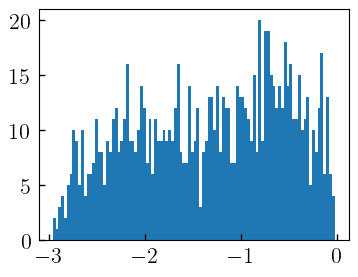

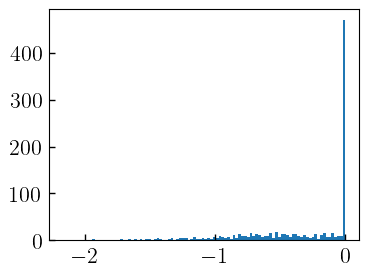

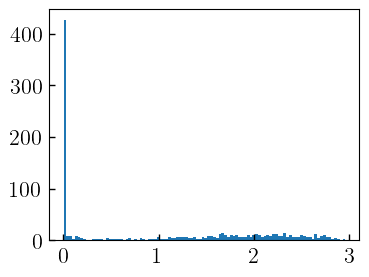

In [39]:
_bla = np.array(_get_bounded_q_params_vmap(*q_params_Q.T))
plt.hist(_bla[2],100);
plt.show()
plt.hist(_bla[3],100);
plt.show()
plt.hist(_bla[3]-_bla[2],100);
plt.show()
# plt.hist(np.log10(-_bla[3]),100);
# plt.show()

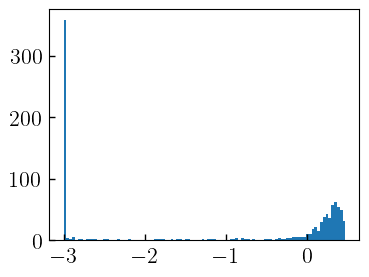

In [40]:
plt.hist(np.log10(_bla[3]-_bla[2]),100);
plt.show()

In [33]:
(_bla[3] - _bla[2]).min()

0.0009999871

In [37]:
print(grads[0:N_PDF_Q])
print(grads[N_PDF_Q:N_PDF_Q+N_PDF_MS])
print(grads[N_PDF_Q+N_PDF_MS:N_PDF_Q+N_PDF_MS+N_R_Q])
print(grads[N_PDF_Q+N_PDF_MS+N_R_Q:N_PDF_Q+N_PDF_MS+N_R_Q+N_R_MS])

[ 0.01452734 -0.00071959 -0.00291769 -0.00385762  0.03753313  0.05193968
  0.03489293 -0.00279914  0.01177281  0.0075219   0.0054017   0.0023704
 -0.13299438 -0.28287074 -0.01965817 -0.01573181  0.00873749 -0.00029953
         nan         nan         nan         nan         nan         nan
         nan         nan         nan         nan         nan         nan
         nan         nan         nan         nan         nan         nan
         nan         nan         nan         nan         nan         nan
         nan         nan         nan         nan         nan         nan
         nan         nan         nan         nan         nan         nan
         nan         nan         nan         nan         nan         nan
         nan         nan         nan         nan         nan         nan
         nan         nan         nan         nan         nan         nan
         nan         nan         nan         nan         nan         nan
         nan         nan         nan         nan    

In [60]:
from jax.config import config
config.update("jax_debug_nans", False)

In [42]:
grads = loss_hists_vmap_deriv(p, _loss_data, n_histories, ran_key)

Invalid nan value encountered in the output of a C++-jit/pmap function. Calling the de-optimized version.


FloatingPointError: invalid value (nan) encountered in jit(mul)

In [24]:
from diffstar.kernels.quenching_kernels import _sigmoid, _get_bounded_lg_rejuv, Q_PARAM_BOUNDS
@jjit
def _fun(
    u_lg_rejuv,
    lg_drop
):
    lg_rejuv = _get_bounded_lg_rejuv(u_lg_rejuv, lg_drop)
    return jnp.mean(jnp.array([lg_drop, lg_rejuv]))

_fun_deriv = jjit(grad(_fun, argnums=(0)))
_fun_vmap = jjit(vmap(_fun, in_axes=(0,0)))
_fun_deriv_vmap = jjit(vmap(_fun_deriv, in_axes=(0,0)))

In [119]:
Q_PARAM_BOUNDS["u_lg_rejuv"][:2]

(-1.5, 1.3333333333333333)

In [88]:
_res =_fun_vmap(q_params_Q[:,3], q_params_Q[:,2])
_res_deriv = _fun_deriv_vmap(q_params_Q[:,3], q_params_Q[:,2])

In [91]:
_sel = np.isnan(_res_deriv)

In [92]:
_res_deriv[_sel]

Array([nan], dtype=float32)

In [93]:
q_params_Q[_sel], _bla.T[_sel]

(Array([[  1.6064534 ,  -0.78288174,   2.173918  , -78.27806   ]], dtype=float32),
 array([[ 1.550484  , -0.8342521 , -0.02220654, -0.02120654]],
       dtype=float32))

In [25]:
_sigmoid_grad = jjit(grad(_sigmoid, argnums=(0,)))
_sigmoid_grad_vmap = jjit(vmap(_sigmoid_grad, in_axes=(0,None,None,None,None)))

In [26]:

def _sigmoid_from_lax(x, x0, k, ymin, ymax):
    height_diff = ymax - ymin
    return ymin + height_diff * lax.logistic(k * (x - x0)) 
    return 
  
_sigmoid_from_lax_grad = jjit(grad(_sigmoid_from_lax, argnums=(0,)))
_sigmoid_from_lax_grad_vmap = jjit(vmap(_sigmoid_from_lax_grad, in_axes=(0,None,None,None,None)))

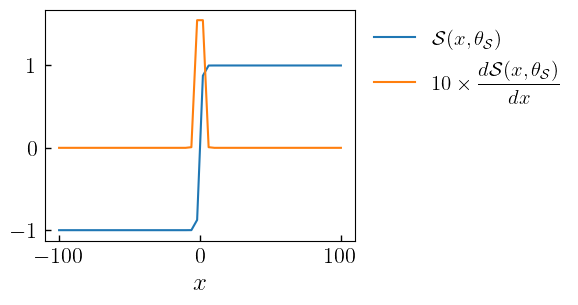

In [27]:
_t = jnp.linspace(-100, 100, 50)
_params = jnp.array([0.0, 1.33, -1.0, 1.0])
plt.plot(_t, _sigmoid_from_lax(_t, *_params), label=r'$\mathcal{S}(x, \theta_{\mathcal{S}})$')
plt.plot(_t, 10*_sigmoid_from_lax_grad_vmap(_t, *_params)[0], label=r'$10\times \dfrac{d\mathcal{S}(x, \theta_{\mathcal{S}})}{dx}$')
plt.legend(loc=2, bbox_to_anchor=(1,1))
plt.xlabel(r"$x$")
plt.show()

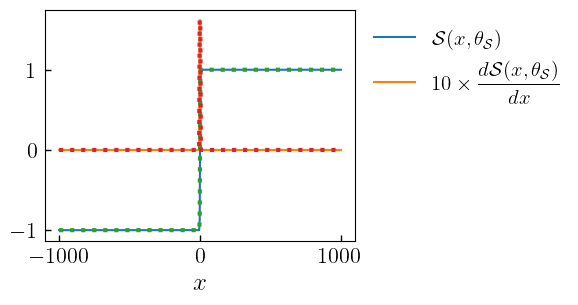

In [30]:
_t = jnp.linspace(-1000, 1000, 500)
_params = jnp.array([0.0, 1.33, -1.0, 1.0])
plt.plot(_t, _sigmoid(_t, *_params), label=r'$\mathcal{S}(x, \theta_{\mathcal{S}})$')
plt.plot(_t, 10*_sigmoid_grad_vmap(_t, *_params)[0], label=r'$10\times \dfrac{d\mathcal{S}(x, \theta_{\mathcal{S}})}{dx}$')
plt.plot(_t, _sigmoid_from_lax(_t, *_params), ls=':', lw=3)
plt.plot(_t, 10*_sigmoid_from_lax_grad_vmap(_t, *_params)[0], ls=':', lw=3)
plt.legend(loc=2, bbox_to_anchor=(1,1))
plt.xlabel(r"$x$")
plt.show()


In [96]:
np.save(data_path+"SMDPL_to_TNG_v2_params.npy", params_arr[:339])
np.save(data_path+"SMDPL_to_TNG_v2_loss.npy", loss_arr[:339])

In [38]:
indx_best2 = np.nanargmin(loss_arr)
best_fit_params2 = params_arr[indx_best]
loss2 = loss_arr[indx_best]

In [69]:
n_histories = int(1e3)
# n_histories = int(1e4)
n_step = int(1e4)
step_size=0.01


N_PDF_Q = len(DEFAULT_SFH_PDF_QUENCH_PARAMS)
N_PDF_MS = len(DEFAULT_SFH_PDF_MAINSEQ_PARAMS)
N_R_Q = len(DEFAULT_R_QUENCH_PARAMS)
N_R_MS = len(DEFAULT_R_MAINSEQ_PARAMS)

ndsig = np.ones((2*n_histories, 2))
ndsig[:,0] *= delta_bins_mstar
ndsig[:,1] *= delta_bins_ssfr

_loss_data = (
    t_table,
    logm0_binmids,
    halo_data_MC.reshape(len(logm0_binmids),Nhalos,4),
    p50.reshape(len(logm0_binmids),Nhalos),
    index_select,
    index_high,
    fstar_tdelay,
    ndsig,
    bins_LO,
    bins_HI,
    t_sel_hists,
    MC_res_target
)


loss_arr = np.zeros(n_step).astype("f4") + np.inf

n_params = len(params_init)
params_arr = np.zeros((n_step, n_params)).astype("f4")

n_mah = 100
sampled_mahs_inds_arr = np.zeros((n_step, n_histories))
no_nan_grads_arr = np.zeros(n_step)
for istep in range(n_step):
    t0 = time.time()
    ran_key, subkey = jran.split(ran_key, 2)

    p = np.array(get_params(opt_state))

    loss = loss_hists_vmap(p, _loss_data, n_histories, ran_key)
    grads = loss_hists_vmap_deriv(p, _loss_data, n_histories, ran_key)
    
    no_nan_params = np.all(np.isfinite(p))
    no_nan_loss = np.isfinite(loss)
    no_nan_grads = np.all(np.isfinite(grads))
    if ~no_nan_params | ~no_nan_loss | ~no_nan_grads:
        # break
        if istep > 0:
            indx_best = np.nanargmin(loss_arr[:istep])
            best_fit_params = params_arr[indx_best]
            best_fit_loss = loss_arr[indx_best]
        else:
            best_fit_params = np.copy(p)
            best_fit_loss = 999.99
    else:
        params_arr[istep, :] = p
        loss_arr[istep] = loss
        opt_state = opt_update(istep, grads, opt_state)
        
    keys = jran.split(ran_key, 5)
    

    sampled_mahs_inds = jran.choice(
        keys[0], n_mah, shape=(n_histories,), replace=True
    )
    sampled_mahs_inds_arr[istep] = sampled_mahs_inds
    no_nan_grads_arr[istep] = ~no_nan_grads
    t1 = time.time()
    print(istep, loss, t1-t0, no_nan_grads)
    # if ~no_nan_grads:
    #     break
"""
indx_best = np.nanargmin(loss_arr)
best_fit_params = params_arr[indx_best]
loss = loss_arr[indx_best]
"""


0 0.13187216 4.574615001678467 True
1 0.12662555 3.7908551692962646 False
2 0.12283769 3.7854740619659424 True
3 0.1257429 3.7571141719818115 True
4 0.12320426 3.853297710418701 True
5 0.12715112 3.7764949798583984 True
6 0.116962604 3.7560088634490967 True
7 0.12658167 3.7939562797546387 True
8 0.12161258 3.8681960105895996 True
9 0.12052861 3.782525062561035 True
10 0.1184315 3.8170759677886963 True
11 0.12231093 4.078509092330933 True
12 0.113002814 3.7742679119110107 True
13 0.109607674 3.7694499492645264 True
14 0.11409809 3.773804187774658 True
15 0.109241754 3.792536735534668 True
16 0.114925064 3.7851669788360596 True
17 0.113792926 3.9175772666931152 True
18 0.1127101 3.890866994857788 True
19 0.112656616 3.770423173904419 True
20 0.107540846 4.08588719367981 True
21 0.11375859 4.0275702476501465 True
22 0.1122083 4.1599440574646 True
23 0.10770955 5.123262166976929 True
24 0.108585335 7.22824501991272 True
25 0.09909082 7.698953151702881 True
26 0.107507885 4.759039878845215 

KeyboardInterrupt: 

In [63]:
# np.save(data_path+"SMDPL_to_TNG_v2_params.npy", params_arr[:126][~no_nan_grads_arr[:126].astype(bool)])

array([[11.762256  ,  2.7178693 , -0.95720416, ..., -2.686361  ,
         6.6414247 , -4.691982  ],
       [11.760553  ,  2.7162442 , -0.9554297 , ..., -2.6870615 ,
         6.6425543 , -4.6909904 ],
       [11.757793  ,  2.713043  , -0.952482  , ..., -2.6877565 ,
         6.643565  , -4.690148  ],
       ...,
       [11.632151  ,  2.6174638 , -0.8865258 , ..., -2.7569156 ,
         6.6325235 , -4.645933  ],
       [11.631834  ,  2.6171103 , -0.8867707 , ..., -2.7566547 ,
         6.636679  , -4.6415887 ],
       [11.631415  ,  2.6166997 , -0.8869524 , ..., -2.7563846 ,
         6.6408443 , -4.6372204 ]], dtype=float32)

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True, False,  True, False,
        True,  True, False, False,  True,  True,  True,  True,  True,
        True, False, False,  True,  True,  True,  True,  True,  True,
       False, False,  True,  True, False,  True,  True,  True,  True,
        True,  True, False,  True,  True,  True, False,  True,  True,
        True,  True,  True,  True, False,  True, False, False,  True,
        True,  True,  True, False, False,  True, False, False,  True])

In [45]:
indx_best = np.nanargmin(loss_arr)
best_fit_params = params_arr[indx_best]
loss = loss_arr[indx_best]

params_init = best_fit_params.copy()


In [48]:
n_histories = int(1e4)
n_step = int(1e4)
step_size = 0.01

N_PDF_Q = len(DEFAULT_SFH_PDF_QUENCH_PARAMS)
N_PDF_MS = len(DEFAULT_SFH_PDF_MAINSEQ_PARAMS)
N_R_Q = len(DEFAULT_R_QUENCH_PARAMS)
N_R_MS = len(DEFAULT_R_MAINSEQ_PARAMS)

ndsig = np.ones((2*n_histories, 2))
ndsig[:,0] *= delta_bins_mstar
ndsig[:,1] *= delta_bins_ssfr

_loss_data = (
    t_table,
    logm0_binmids,
    halo_data_MC.reshape(len(logm0_binmids),Nhalos,4),
    p50.reshape(len(logm0_binmids),Nhalos),
    index_select,
    index_high,
    fstar_tdelay,
    ndsig,
    bins_LO,
    bins_HI,
    t_sel_hists,
    MC_res_target
)

init_guess = np.concatenate((
    dict_to_array(DEFAULT_SFH_PDF_QUENCH_PARAMS),
    dict_to_array(DEFAULT_SFH_PDF_MAINSEQ_PARAMS),
    dict_to_array(DEFAULT_R_QUENCH_PARAMS),
    dict_to_array(DEFAULT_R_MAINSEQ_PARAMS),
))

# ran_key = jran.PRNGKey(np.random.randint(2**32))
# ran_key = jran.PRNGKey(0)

loss_arr = np.zeros(n_step).astype("f4") + np.inf

# opt_init, opt_update, get_params = jax_opt.adam(step_size)
# opt_state = opt_init(params_init)

n_params = len(params_init)
params_arr = np.zeros((n_step, n_params)).astype("f4")

no_nan_grads_arr = np.zeros(n_step)
for istep in range(n_step):
    t0 = time.time()
    ran_key, subkey = jran.split(ran_key, 2)

    p = np.array(get_params(opt_state))

    loss = loss_hists_vmap(p, _loss_data, n_histories, ran_key)
    grads = loss_hists_vmap_deriv(p, _loss_data, n_histories, ran_key)
    
    no_nan_params = np.all(np.isfinite(p))
    no_nan_loss = np.isfinite(loss)
    no_nan_grads = np.all(np.isfinite(grads))
    if ~no_nan_params | ~no_nan_loss | ~no_nan_grads:
        # break
        if istep > 0:
            indx_best = np.nanargmin(loss_arr[:istep])
            best_fit_params = params_arr[indx_best]
            best_fit_loss = loss_arr[indx_best]
        else:
            best_fit_params = np.copy(p)
            best_fit_loss = 999.99
    else:
        params_arr[istep, :] = p
        loss_arr[istep] = loss
        opt_state = opt_update(istep, grads, opt_state)
        
    keys = jran.split(ran_key, 5)
    
    no_nan_grads_arr[istep] = ~no_nan_grads
    t1 = time.time()
    print(istep, loss, t1-t0, no_nan_grads)
    # if ~no_nan_grads:
    #     break

"""
indx_best = np.nanargmin(loss_arr)
best_fit_params = params_arr[indx_best]
loss = loss_arr[indx_best]

"""

0 0.012527874 281.3499071598053 True
1 0.01309467 214.70076966285706 True
2 0.012759006 223.70534801483154 True
3 0.013587017 208.56979393959045 True
4 0.012796013 278.19221091270447 True
5 0.012620278 239.9941530227661 True
6 0.013256041 229.76965022087097 True
7 0.012516901 198.70203018188477 True
8 0.013000352 217.38328289985657 True
9 0.012064626 225.85739588737488 True
10 0.0124507435 229.79326105117798 True
11 0.012820805 168.50619792938232 True
12 0.012516184 167.13487792015076 True
13 0.012867805 180.0395529270172 True
14 0.012667323 173.39441585540771 True
15 0.012169141 179.63154196739197 True
16 0.012359667 192.7078320980072 True
17 0.012222148 187.9534740447998 True
18 0.0123671405 183.4627809524536 True
19 0.012368439 208.49374222755432 True
20 0.0123572685 208.14464783668518 True
21 0.012732151 223.3848111629486 True
22 0.012987329 210.93783497810364 True
23 0.012499073 213.54369688034058 True
24 0.012252714 184.67550683021545 True
25 0.012040546 170.53386187553406 True
2

KeyboardInterrupt: 

In [49]:
indx_best2 = np.nanargmin(loss_arr)
best_fit_params2 = params_arr[indx_best2]
loss2 = loss_arr[indx_best2]

In [76]:
n_histories = int(5e3)
n_step = int(1e2)
step_size = 0.01


# ran_key = jran.PRNGKey(np.random.randint(2**32))
ran_key = jran.PRNGKey(0)

loss_arr = np.zeros(n_step).astype("f4") + np.inf

# opt_init, opt_update, get_params = jax_opt.adam(step_size)
# opt_state = opt_init(params_init)

n_params = len(params_init)
params_arr = np.zeros((n_step, n_params)).astype("f4")

n_mah = 100
sampled_mahs_inds_arr = np.zeros((n_step, n_histories))
no_nan_grads_arr = np.zeros(n_step)
for istep in range(n_step):
    t0 = time.time()
    ran_key, subkey = jran.split(ran_key, 2)

    p = np.array(get_params(opt_state))

    loss = loss_p50(p, _loss_data, n_histories, ran_key)
    grads = loss_p50_deriv(p, _loss_data, n_histories, ran_key)
    
    no_nan_params = np.all(np.isfinite(p))
    no_nan_loss = np.isfinite(loss)
    no_nan_grads = np.all(np.isfinite(grads))
    if ~no_nan_params | ~no_nan_loss | ~no_nan_grads:
        # break
        if istep > 0:
            indx_best = np.nanargmin(loss_arr[:istep])
            best_fit_params = params_arr[indx_best]
            best_fit_loss = loss_arr[indx_best]
        else:
            best_fit_params = np.copy(p)
            best_fit_loss = 999.99
    else:
        params_arr[istep, :] = p
        loss_arr[istep] = loss
        opt_state = opt_update(istep, grads, opt_state)
        
    keys = jran.split(ran_key, 5)
    

    sampled_mahs_inds = jran.choice(
        keys[0], n_mah, shape=(n_histories,), replace=True
    )
    sampled_mahs_inds_arr[istep] = sampled_mahs_inds
    no_nan_grads_arr[istep] = ~no_nan_grads
    t1 = time.time()
    print(istep, loss, t1-t0, no_nan_grads)
    # if loss < 0.05:
    #     break

"""
indx_best = np.nanargmin(loss_arr)
best_fit_params = params_arr[indx_best]
loss = loss_arr[indx_best]

"""

0 0.018539041 40.92223310470581 True
1 0.020497877 33.083258867263794 True
2 0.019654617 31.372318029403687 True
3 0.02087221 31.100286960601807 True
4 0.020715687 31.94072389602661 True
5 0.01873094 34.36488199234009 True
6 0.020600937 31.74677085876465 True
7 0.019209394 39.047439098358154 True
8 0.01972091 35.02100992202759 True
9 0.019371945 37.64165496826172 True
10 0.019859517 39.738121032714844 True
11 0.018634817 34.61252784729004 True
12 0.019148203 34.43887901306152 True
13 0.019522365 36.45312690734863 True
14 0.018894458 35.39856195449829 True
15 0.018491905 41.01181221008301 True
16 0.01901765 34.48942804336548 True
17 0.018161297 33.77324390411377 True
18 0.01928672 38.750288248062134 True
19 0.02056546 33.75440192222595 True
20 0.01987597 35.536927938461304 True
21 0.018495368 34.944334745407104 True
22 0.01779069 35.81099796295166 True
23 0.018025672 37.17343211174011 True
24 0.01982776 33.27502703666687 True
25 0.019161692 44.26388216018677 True
26 0.019138673 33.98938

'\nindx_best = np.nanargmin(loss_arr)\nbest_fit_params = params_arr[indx_best]\nloss = loss_arr[indx_best]\n\n'

In [77]:
indx_best3 = np.nanargmin(loss_arr)
best_fit_params3 = params_arr[indx_best3]
loss3 = loss_arr[indx_best3]

In [90]:
ran_key = jran.PRNGKey(0)
for istep in range(54):
    t0 = time.time()
    ran_key, subkey = jran.split(ran_key, 2)
    
loss = loss_p50(params_arr[istep], _loss_data, n_histories, ran_key)
grads = loss_p50_deriv(params_arr[istep], _loss_data, n_histories, ran_key)

In [ ]:
NAN_KEYS = jran.split(ran_key, 5)

In [59]:
import numpy as np
from numpy.random import RandomState
from jax import vmap
from jax import jit as jjit
from jax import numpy as jnp
from jax import random as jran
from collections import OrderedDict
from functools import partial

from diffstar.stars import (
    calculate_sm_sfr_fstar_history_from_mah,
    DEFAULT_SFR_PARAMS as DEFAULT_SFR_PARAMS_DICT,
    _get_unbounded_sfr_params,
    _integrate_sfr,
    compute_fstar,
    fstar_tools,
)
from diffstar.quenching import (
    DEFAULT_Q_PARAMS as DEFAULT_Q_PARAMS_DICT,
    _get_unbounded_q_params,
    quenching_function,
)
from diffstar.main_sequence import get_ms_sfh_from_mah_kern
from diffstar.utils import jax_np_interp, _jax_get_dt_array


from diffmah.individual_halo_assembly import _calc_halo_history

from diffstarpop.pdf_quenched import (
    get_smah_means_and_covs_quench,
    DEFAULT_SFH_PDF_QUENCH_PARAMS,
    frac_quench_vs_lgm0,
)
from diffstarpop.pdf_mainseq import get_smah_means_and_covs_mainseq, DEFAULT_SFH_PDF_MAINSEQ_PARAMS
from diffstarpop.pdf_model_assembly_bias_shifts import (
    DEFAULT_R_QUENCH_PARAMS,
    DEFAULT_R_MAINSEQ_PARAMS,
    _get_slopes_quench,
    _get_slopes_mainseq,
    _get_shift_to_PDF_mean,
)
from diffstarpop.star_wrappers import (
    sm_sfr_history_diffstar_scan_XsfhXmah_vmap,
    sm_sfr_history_diffstar_scan_MS_XsfhXmah_vmap,
)
from diffstarpop.utils import _tw_cuml_lax_kern


from functools import partial
from diffstarpop.star_wrappers import (
    sm_sfr_history_diffstar_scan_XsfhXmah_vmap,
    sm_sfr_history_diffstar_scan_MS_XsfhXmah_vmap,
)


@partial(jjit, static_argnames=["n_histories"])
def _fun(
    t_table,
    logmh,
    mah_params,
    p50,
    n_histories,
    ran_key,
    index_select,
    index_high,
    fstar_tdelay,
    pdf_parameters_MS=DEFAULT_SFH_PDF_MAINSEQ_PARAMS,
    R_model_params_MS=DEFAULT_R_MAINSEQ_PARAMS,
):
    lgt = jnp.log10(t_table)
    dt = _jax_get_dt_array(t_table)
    logmh = jnp.atleast_1d(logmh)

    (choice_key, quench_key, mainseq_key, fquench_key, ran_key) = jran.split(ran_key, 5)
    n_mah = len(mah_params)

    sampled_mahs_inds = jran.choice(
        choice_key, n_mah, shape=(n_histories,), replace=True
    )
    mah_params_sampled = mah_params[sampled_mahs_inds]
    p50_sampled = p50[sampled_mahs_inds]

    _res = get_smah_means_and_covs_mainseq(logmh, *pdf_parameters_MS)
    means_mainseq, covs_mainseq = _res
    means_mainseq = means_mainseq[0]
    covs_mainseq = covs_mainseq[0]

    R_vals_mainseq = _get_slopes_mainseq(logmh, *R_model_params_MS)
    R_vals_mainseq = jnp.array(R_vals_mainseq)[:, 0]
    shifts_mainseq = jnp.einsum("p,h->hp", R_vals_mainseq, (p50_sampled - 0.5))

    sfr_params_MS = jran.multivariate_normal(
        mainseq_key, means_mainseq, covs_mainseq, shape=(n_histories,)
    )
    sfr_params_MS = sfr_params_MS + shifts_mainseq
    # q_params_MS = jnp.ones_like(q_params_Q) * 10.0

    mstar_MS, sfr_MS, fstar_MS = sm_sfr_history_diffstar_scan_MS_XsfhXmah_vmap(
        t_table,
        lgt,
        dt,
        mah_params_sampled,
        sfr_params_MS,
        index_select,
        index_high,
        fstar_tdelay,
    )
    mstar_MS = jnp.where(mstar_MS>0.0, jnp.log10(mstar_MS), 0.0) 
    return (jnp.mean(mstar_MS) - 10.0)**2

_fun_deriv = jjit(grad(_fun, argnums=(9, 10)), static_argnames=["n_histories"])


In [66]:
binid = 3
_res = _fun(
    _loss_data[0],
    _loss_data[1][binid],
    _loss_data[2][binid],
    _loss_data[3][binid],
    n_histories,
    ran_key,
    _loss_data[4],
    _loss_data[5],
    _loss_data[6],
    p[N_PDF_Q:N_PDF_Q+N_PDF_MS],
    p[N_PDF_Q+N_PDF_MS+N_R_Q:N_PDF_Q+N_PDF_MS+N_R_Q+N_R_MS],
)

print(_res)

_res_grads = _fun_deriv(
    _loss_data[0],
    _loss_data[1][binid],
    _loss_data[2][binid],
    _loss_data[3][binid],
    n_histories,
    ran_key,
    _loss_data[4],
    _loss_data[5],
    _loss_data[6],
    p[N_PDF_Q:N_PDF_Q+N_PDF_MS],
    p[N_PDF_Q+N_PDF_MS+N_R_Q:N_PDF_Q+N_PDF_MS+N_R_Q+N_R_MS],
)

print(_res_grads)


0.36601254
(DeviceArray([-5.0228345e-03, -5.0228345e-03,  3.1189024e-01,
              3.1189024e-01, -9.0579391e-02, -9.0579391e-02,
             -9.8150112e-03, -9.8150112e-03, -1.9840196e-01,
             -1.9840196e-01, -1.1302834e-01, -1.1302834e-01,
             -2.0473240e-02, -2.0473240e-02, -2.6698029e-01,
             -2.6698029e-01,  6.3770282e-04,  6.3770282e-04,
             -1.0377981e-02, -1.0377981e-02, -1.9005980e-04,
             -1.9005980e-04,  1.1041158e-02,  1.1041158e-02,
             -5.9196786e-03, -5.9196786e-03,  1.1106974e-02,
              1.1106974e-02], dtype=float32), DeviceArray([-0.01634221, -0.01634221, -0.00705876, -0.00705876,
             -0.00464512, -0.00464512,  0.00011704,  0.00011704],            dtype=float32))


In [32]:
indx_best = np.nanargmin(loss_arr)
best_fit_params = params_arr[indx_best]
loss = loss_arr[indx_best]

In [39]:
# t_table = np.linspace(0.1, TODAY, 100)

_best_fit_params = best_fit_params2.copy()
n_histories = int(1e4)
ran_key = jran.PRNGKey(0)
i = 21
t0 = time.time()
MC_res_best_fit = sumstats_sfh_MIX_p50_vmap(
    t_table,
    logm0_binmids,
    halo_data_MC.reshape(len(logm0_binmids),Nhalos,4),
    p50.reshape(len(logm0_binmids),Nhalos),
    n_histories,
    ran_key,
    index_select,
    index_high,
    fstar_tdelay,
    _best_fit_params[0:N_PDF_Q],
    _best_fit_params[N_PDF_Q:N_PDF_Q+N_PDF_MS],
    _best_fit_params[N_PDF_Q+N_PDF_MS:N_PDF_Q+N_PDF_MS+N_R_Q],
    _best_fit_params[N_PDF_Q+N_PDF_MS+N_R_Q:N_PDF_Q+N_PDF_MS+N_R_Q+N_R_MS],
)
t1 = time.time()
print(t1-t0)

2.2472639083862305


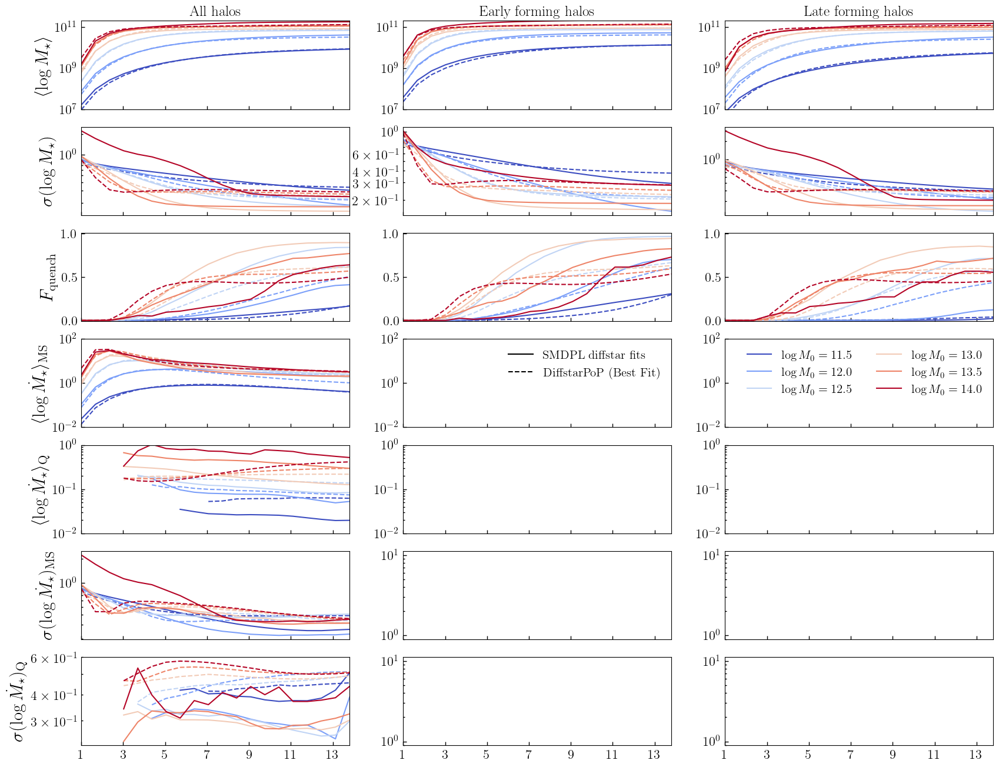

In [40]:
NM0 = len(logm0_binmids)
colors = plt.get_cmap("viridis")(np.linspace(0,1,NM0))
colors = plt.get_cmap("coolwarm")(np.linspace(0,1,NM0))

fontsize = 22
fig, ax = plt.subplots(7,3, figsize=(20,16), sharex=True, sharey=False)

lw = 1.5

for i in range(NM0):    
    
    ax[0,0].plot(t_table, 10**MC_res_target[0][i], ls="-", color=colors[i])
    ax[0,1].plot(t_table, 10**MC_res_target[7][i], ls="-", color=colors[i])
    ax[0,2].plot(t_table, 10**MC_res_target[8][i], ls="-", color=colors[i])
    
    ax[1,0].plot(t_table, np.sqrt(MC_res_target[1][i]), ls="-", color=colors[i])
    ax[1,1].plot(t_table, np.sqrt(MC_res_target[9][i]), ls="-", color=colors[i])
    ax[1,2].plot(t_table, np.sqrt(MC_res_target[10][i]), ls="-", color=colors[i])
    
    ax[2,0].plot(t_table, MC_res_target[6][i], ls="-", color=colors[i])
    ax[2,1].plot(t_table, MC_res_target[11][i], ls="-", color=colors[i])
    ax[2,2].plot(t_table, MC_res_target[12][i], ls="-", color=colors[i])

    mskQ = np.array(MC_res_target[6][i] > 0.01)
    mskSF = np.array(MC_res_target[6][i] < 0.99)
    ax[3,0].plot(t_table[mskSF], 10**MC_res_target[2][i][mskSF], ls="-", color=colors[i])
    ax[4,0].plot(t_table[mskQ], 10**MC_res_target[3][i][mskQ], ls="-", color=colors[i])

    ax[5,0].plot(t_table[mskSF], np.sqrt(MC_res_target[4][i])[mskSF], ls="-", color=colors[i])
    ax[6,0].plot(t_table[mskQ], np.sqrt(MC_res_target[5][i])[mskQ], ls="-", color=colors[i])
    
    ################################
    
    ax[0,0].plot(t_table, 10**MC_res_best_fit[0][i], ls="--", color=colors[i], lw=lw)
    ax[0,1].plot(t_table, 10**MC_res_best_fit[7][i], ls="--", color=colors[i], lw=lw)
    ax[0,2].plot(t_table, 10**MC_res_best_fit[8][i], ls="--", color=colors[i], lw=lw)
    
    ax[1,0].plot(t_table, np.sqrt(MC_res_best_fit[1][i]), ls="--", color=colors[i], lw=lw)
    ax[1,1].plot(t_table, np.sqrt(MC_res_best_fit[9][i]), ls="--", color=colors[i], lw=lw)
    ax[1,2].plot(t_table, np.sqrt(MC_res_best_fit[10][i]), ls="--", color=colors[i], lw=lw)
    
    ax[2,0].plot(t_table, MC_res_best_fit[6][i], ls="--", color=colors[i], lw=lw)
    ax[2,1].plot(t_table, MC_res_best_fit[11][i], ls="--", color=colors[i], lw=lw)
    ax[2,2].plot(t_table, MC_res_best_fit[12][i], ls="--", color=colors[i], lw=lw)

    mskQ = np.array(MC_res_best_fit[6][i] > 0.01)
    mskSF = np.array(MC_res_best_fit[6][i] < 0.99)
    ax[3,0].plot(t_table[mskSF], 10**MC_res_best_fit[2][i][mskSF], ls="--", color=colors[i], lw=lw)
    ax[4,0].plot(t_table[mskQ], 10**MC_res_best_fit[3][i][mskQ], ls="--", color=colors[i], lw=lw)

    ax[5,0].plot(t_table[mskSF], np.sqrt(MC_res_best_fit[4][i])[mskSF], ls="--", color=colors[i], lw=lw)
    ax[6,0].plot(t_table[mskQ], np.sqrt(MC_res_best_fit[5][i])[mskQ], ls="--", color=colors[i], lw=lw)

ax[0,0].set_title("All halos")
ax[0,1].set_title("Early forming halos")
ax[0,2].set_title("Late forming halos")

ax[0,0].set_ylabel(r'$\langle \log M_\star\rangle$', fontsize=fontsize)
ax[1,0].set_ylabel(r'$\sigma(\log M_\star)$', fontsize=fontsize)
ax[2,0].set_ylabel(r'$F_{\rm quench}$', fontsize=fontsize)
ax[3,0].set_ylabel(r'$\langle \log\dot{M}_\star\rangle_{\rm{MS}}$', fontsize=fontsize)
ax[4,0].set_ylabel(r'$\langle \log \dot{M}_\star\rangle_{\rm{Q}}$', fontsize=fontsize)
ax[5,0].set_ylabel(r'$\sigma( \log\dot{M}_\star)_{\rm{MS}}$', fontsize=fontsize)
ax[6,0].set_ylabel(r'$\sigma( \log\dot{M}_\star)_{\rm{Q}}$', fontsize=fontsize)

for i in range(3):
    ax[0,i].set_yscale('log')
    ax[1,i].set_yscale('log')
    ax[0,i].set_ylim(1e7, 2e11)
    ax[2,i].set_ylim(-0.01,1.01)
    ax[3,i].set_yscale('log')
    ax[4,i].set_yscale('log')
    ax[3,i].set_ylim(1e-2, 1e2)
    ax[4,i].set_ylim(1e-2, 1e0)
    ax[5,i].set_yscale('log')
    ax[6,i].set_yscale('log')
    
ax[0,0].set_xlim(1.0, TODAY)
ax[0,0].set_xticks(np.arange(1,13.1,2))

legend_elements = [
    Line2D([0], [0], color=colors[i], label=r'$\log M_0 = %.1f$'%logm0_binmids[i])
    for i in range(NM0)
]
ax[3,2].legend(handles=legend_elements, loc=1, ncol=2)

legend_elements = [
    Line2D([0], [0], color='k', ls='-', label=r"SMDPL diffstar fits"),
    Line2D([0], [0], color='k', ls='--', label=r"DiffstarPoP (Best Fit)"),
]
ax[3,1].legend(handles=legend_elements, loc=1, ncol=1)

# plt.savefig("SMDPL_diffstarpop_sumstats_bestfit.png", bbox_inches='tight', dpi=300)
# plt.savefig("SMDPL_diffstarpop_sumstats_bestfit_v2.png", bbox_inches='tight', dpi=300)

plt.show()

In [53]:
from diffstarpop.json_utils import load_params, write_params_json, print_all_default_dicts

In [58]:
path_json = "/Users/alarcon/Documents/source/diffstarpop/diffstarpop/bestfit_diffstarpop_params_UM_hists_v4.json"

In [59]:
write_params_json(path_json, best_fit_params2)

In [232]:
outputs = load_params(path_json)
print_all_default_dicts(outputs[1:])

DEFAULT_SFH_PDF_QUENCH_PARAMS = OrderedDict(
    frac_quench_x0=11.860,
    frac_quench_k=1.611,
    frac_quench_ylo=-0.872,
    frac_quench_yhi=2.139,
    mean_ulgm_quench_ylo=11.540,
    mean_ulgm_quench_yhi=12.080,
    mean_ulgy_quench_ylo=0.481,
    mean_ulgy_quench_yhi=-0.223,
    mean_ul_quench_ylo=-1.274,
    mean_ul_quench_yhi=1.766,
    mean_utau_quench_ylo=55.480,
    mean_utau_quench_yhi=-66.540,
    mean_uqt_quench_ylo=1.744,
    mean_uqt_quench_yhi=0.042,
    mean_uqs_quench_ylo=-2.979,
    mean_uqs_quench_yhi=3.520,
    mean_udrop_quench_ylo=-0.508,
    mean_udrop_quench_yhi=-3.785,
    mean_urej_quench_ylo=2.139,
    mean_urej_quench_yhi=-3.043,
    chol_ulgm_ulgm_quench_ylo=-1.645,
    chol_ulgm_ulgm_quench_yhi=0.010,
    chol_ulgy_ulgy_quench_ylo=-1.125,
    chol_ulgy_ulgy_quench_yhi=-0.530,
    chol_ul_ul_quench_ylo=-0.701,
    chol_ul_ul_quench_yhi=0.544,
    chol_utau_utau_quench_ylo=0.833,
    chol_utau_utau_quench_yhi=1.100,
    chol_uqt_uqt_quench_ylo=-1.001,
   

In [29]:
import scipy.optimize as so
from scipy.ndimage import gaussian_filter

def find_confidence_interval(x, pdf, confidence_level):
    return pdf[pdf > x].sum() - confidence_level

def density_contour(xdata, ydata, bins_x, bins_y, ax=None, smooth=False, level=0.68, weights=None, **contour_kwargs):

    nbins_x = len(bins_x) - 1
    nbins_y = len(bins_y) - 1
    H, xedges, yedges = np.histogram2d(xdata, ydata, bins=(bins_x,bins_y), density=1, weights=weights)
    x_bin_sizes = (xedges[1:] - xedges[:-1]).reshape((1,nbins_x))
    y_bin_sizes = (yedges[1:] - yedges[:-1]).reshape((nbins_y,1))

    if smooth:
        H = gaussian_filter(H, 1.0, )
    pdf = (H*(x_bin_sizes*y_bin_sizes))

    one_sigma = so.brentq(find_confidence_interval, 0., 1., args=(pdf, level))
    levels = [one_sigma]

    X, Y = 0.5*(xedges[1:]+xedges[:-1]), 0.5*(yedges[1:]+yedges[:-1])
    Z = pdf.T

    if ax == None:
        contour = plt.contour(X, Y, Z, levels=levels, origin="lower", **contour_kwargs)
    else:
        contour = ax.contour(X, Y, Z, levels=levels, origin="lower", **contour_kwargs)

    return contour

def density_contourf(xdata, ydata, bins_x, bins_y, ax=None, smooth=False, levels=0.68, weights=None, **contour_kwargs):

    nbins_x = len(bins_x) - 1
    nbins_y = len(bins_y) - 1
    H, xedges, yedges = np.histogram2d(xdata, ydata, bins=(bins_x,bins_y), density=1, weights=weights)
    x_bin_sizes = (xedges[1:] - xedges[:-1]).reshape((1,nbins_x))
    y_bin_sizes = (yedges[1:] - yedges[:-1]).reshape((nbins_y,1))

    if smooth:
        H = gaussian_filter(H, 1.0, )
    pdf = (H*(x_bin_sizes*y_bin_sizes))

    new_levels = []
    for level in np.sort(levels)[::-1]:
        _new_level = so.brentq(find_confidence_interval, 0., 1., args=(pdf, level))
        new_levels.append(_new_level)
        
    

    X, Y = 0.5*(xedges[1:]+xedges[:-1]), 0.5*(yedges[1:]+yedges[:-1])
    Z = pdf.T

    if ax == None:
        contour = plt.contourf(X, Y, Z, levels=new_levels, origin="lower", **contour_kwargs)
    else:
        contour = ax.contourf(X, Y, Z, levels=new_levels, origin="lower", **contour_kwargs)

    return contour


In [30]:
from diffmah.individual_halo_assembly import _calc_halo_history
from diffstar.utils import _get_dt_array
# from diffstarpop.utils import get_t50_p50

_calc_halo_history_vmap = jjit(vmap(_calc_halo_history, in_axes=(None, *[0]*6)))

_ids = np.argmin(np.subtract.outer(z_table, np.arange(0,2.1,0.5))**2, axis=0)[::-1]


time i 2.2303569316864014
9.93
9.92
9.7
9.68
9.38
9.38
9.1
9.13
8.64
8.72
time i 1.6415059566497803
10.51
10.61
10.4
10.44
10.19
10.19
9.96
9.95
9.52
9.55
time i 1.8381037712097168
10.88
10.83
10.82
10.79
10.69
10.67
10.52
10.52
10.16
10.17
time i 1.5400669574737549
11.04
10.91
10.99
10.9
10.92
10.85
10.83
10.78
10.58
10.57
time i 1.5151960849761963
11.09
11.05
11.04
11.02
10.99
10.99
10.94
10.94
10.79
10.8
time i 2.1125659942626953
11.11
11.25
11.05
11.2
11.01
11.09
10.98
11.01
10.89
10.86


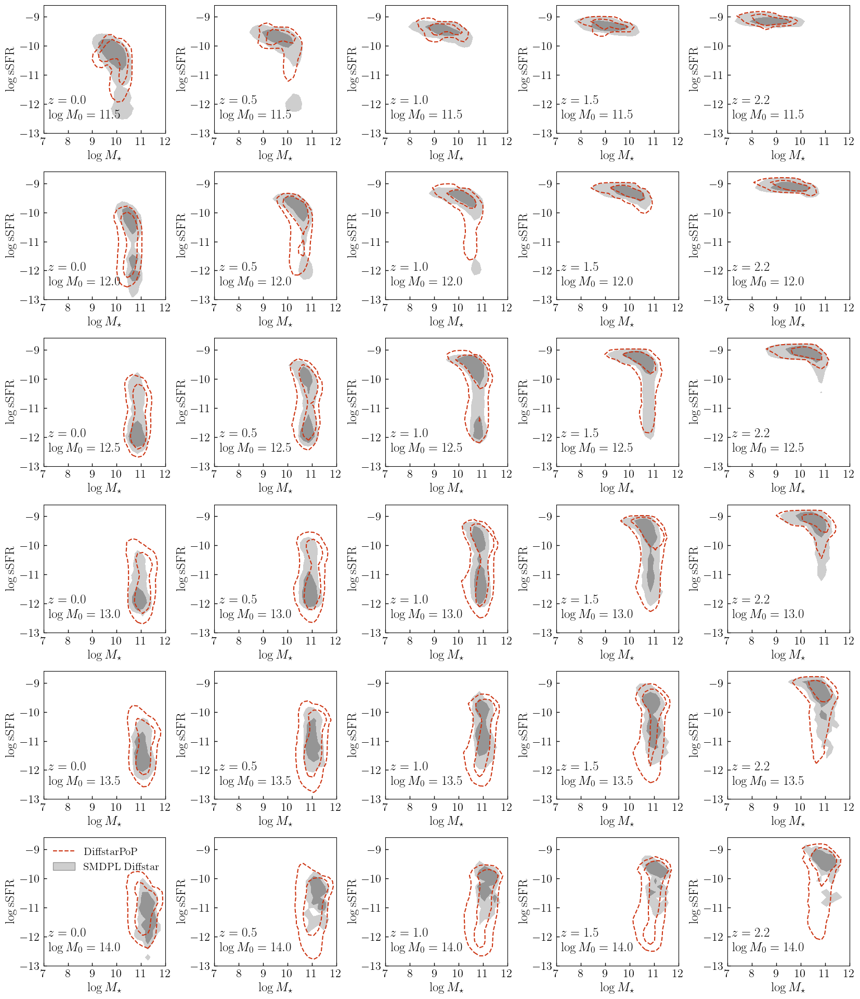

In [41]:
"""
init_guess = np.concatenate((
    dict_to_array(DEFAULT_SFH_PDF_QUENCH_PARAMS),
    dict_to_array(DEFAULT_SFH_PDF_MAINSEQ_PARAMS),
    dict_to_array(DEFAULT_R_QUENCH_PARAMS),
    dict_to_array(DEFAULT_R_MAINSEQ_PARAMS),
))
"""
init_guess = outputs[0].copy()


colors = ["#0077BB", "#33BBEE", "#009988", "#EE7733", "#CC3311", "#EE3377", '#882255', '#AA4499']
colors_test = plt.get_cmap("Greys")(np.linspace(0.3,0.7, 3))

n_histories = int(5e4)
ran_key = jran.PRNGKey(0)

nbins_x = np.linspace(7, 12, 40)
nbins_y = np.linspace(-13, -8.5, 40)
        
nbins_x = bins_mstar.copy()
nbins_y = bins_ssfr.copy()

smooth = False
_fact = 4
fig, ax = plt.subplots(6, 5, figsize=(5*_fact,6*_fact))
lgt = jnp.log10(t_table)
# for i, bin_id in enumerate([2,4,6]):
# for i, bin_id in enumerate([1, 2, 3, 4, 5, 6]):
for i, bin_id in enumerate(range(6)):
    t0 = time.time()
    histories = draw_sfh_MIX(
        t_table,
        logm0_binmids[bin_id],
        halo_data_MC.reshape(len(logm0_binmids),Nhalos,4)[bin_id],
        p50.reshape(len(logm0_binmids),Nhalos)[bin_id],
        n_histories,
        ran_key,
        index_select,
        index_high,
        fstar_tdelay,
        #init_guess[0:N_PDF_Q],
        #init_guess[N_PDF_Q:N_PDF_Q+N_PDF_MS],
        #init_guess[N_PDF_Q+N_PDF_MS:N_PDF_Q+N_PDF_MS+N_R_Q],
        #init_guess[N_PDF_Q+N_PDF_MS+N_R_Q:N_PDF_Q+N_PDF_MS+N_R_Q+N_R_MS],
        _best_fit_params[0:N_PDF_Q],
        _best_fit_params[N_PDF_Q:N_PDF_Q+N_PDF_MS],
        _best_fit_params[N_PDF_Q+N_PDF_MS:N_PDF_Q+N_PDF_MS+N_R_Q],
        _best_fit_params[N_PDF_Q+N_PDF_MS+N_R_Q:N_PDF_Q+N_PDF_MS+N_R_Q+N_R_MS],
    )

    weights = histories[4].copy()
    _params = np.zeros((Nhalos, 6))
    _params[:, 0] = np.log10(TODAY)
    _params[:, 1:3] = halo_data_MC.reshape(len(logm0_binmids),Nhalos,4)[bin_id][:, 0:2]
    _params[:, 3] = 3.5
    _params[:, 4:6] = halo_data_MC.reshape(len(logm0_binmids),Nhalos,4)[bin_id][:, 2:4]

    mah_histories = _calc_halo_history_vmap(lgt, *_params.T)

    _mask = (logmpeak > logm0_binmids[bin_id] - logm0_bin_widths[bin_id]) 
    _mask &= (logmpeak < logm0_binmids[bin_id] + logm0_bin_widths[bin_id])
    mah_histories_SMDPL = _calc_halo_history_vmap(lgt, *mah_params_arr[_mask].T)

    histories_SMDPL = sm_sfr_history_diffstar_scan_XsfhXmah_vmap(
        t_table,
        jnp.log10(t_table),
        _get_dt_array(t_table),
        mah_params_arr[_mask][:, np.array([1,2,4,5])],
        u_fit_params_arr[_mask][:,np.array([0,1,2,4])],
        u_fit_params_arr[_mask][:,5:9],
        index_select,
        index_high,
        fstar_tdelay,
    )
    t1 = time.time()
    print("time i", t1-t0)
    # for j, t_id in enumerate(t_sel_hists[::-1]):
    for j, t_id in enumerate(_ids[::-1]):

        t0 = time.time()


        xdata = np.log10(histories[0][:, t_id])
        print(np.round(np.average(xdata, weights=np.array(weights)),2))
        ydata = np.log10(histories[1][:, t_id] / histories[0][:, t_id])
        
        density_contour(xdata, ydata, nbins_x, nbins_y, ax=ax[i,j], smooth=smooth, weights=weights, level=0.68, linestyles=['--'], colors=[colors[4]])
        density_contour(xdata, ydata, nbins_x, nbins_y, ax=ax[i,j], smooth=smooth, weights=weights, level=0.95, linestyles=['--'], colors=[colors[4]])

        xdata = np.log10(histories_SMDPL[0][:, t_id])
        ydata = np.log10(histories_SMDPL[1][:, t_id] / histories_SMDPL[0][:, t_id])
        print(np.round(np.mean(xdata),2))
        # density_contour(xdata, ydata, nbins_x, nbins_y, ax=ax[i,j], smooth=smooth, level=0.68, linestyles=['--'], colors=[colors[4]])
        # density_contour(xdata, ydata, nbins_x, nbins_y, ax=ax[i,j], smooth=smooth, level=0.95, linestyles=['--'], colors=[colors[4]])
        # density_contourf(xdata, ydata, nbins_x, nbins_y, ax=ax[i,j], smooth=smooth, levels=[0.68, 0.95], linestyles=['--'], colors=[colors[4]])
        density_contourf(xdata, ydata, nbins_x, nbins_y, ax=ax[i,j], smooth=smooth, levels=[0.0, .68, 0.95], colors=colors_test)
        t1 = time.time()
        # print("time j", t1-t0)
        
        ax[i,j].text(7.2, -12.5, r"$\log M_0 = %.1f$"%logm0_binmids[bin_id], fontsize=18)
        ax[i,j].text(7.2, -12.5+0.5, r"$z = %.1f$"%abs(z_table[t_id]), fontsize=18)
        ax[i,j].set_xlabel(r'$\log M_\star$')
        ax[i,j].set_ylabel(r'$\log \rm{sSFR}$')
        ax[i,j].set_xticks(np.arange(7,12.1,1))
        ax[i,j].set_yticks(np.arange(-13,-8.9,1))
        
fig.subplots_adjust(wspace=0.4, hspace=0.3)

legend_elements = [
    Line2D([0], [0], color=colors[4], ls='--', label=r'DiffstarPoP'),
    Patch(facecolor=colors_test[0], edgecolor=colors_test[1], label=r'SMDPL Diffstar')
]
ax[5,0].legend(handles=legend_elements, loc=2)
# fig.savefig("mstar_vs_ssfr_diffstarpop_smdpl_v2.png", bbox_inches="tight", dpi=300)
plt.show()
        

In [57]:
asdf

NameError: name 'asdf' is not defined

In [60]:
path_json = "/Users/alarcon/Documents/source/diffstarpop/diffstarpop/bestfit_diffstarpop_params_UM_hists_v4.json"
outputs = load_params(path_json)


/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


time i 158.93571615219116
12.5 2.9947026044961014
9.13
9.1


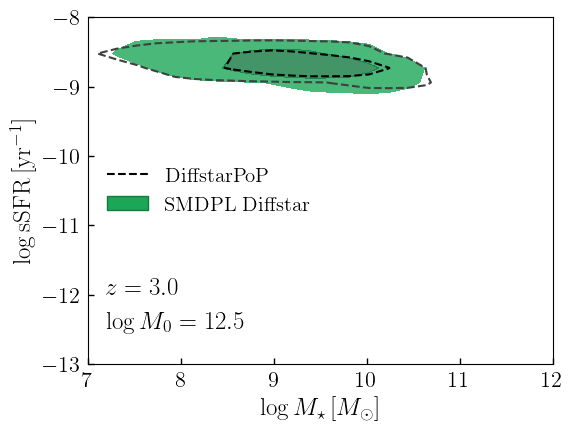

12.5 2.9629849364007934
9.15
9.13


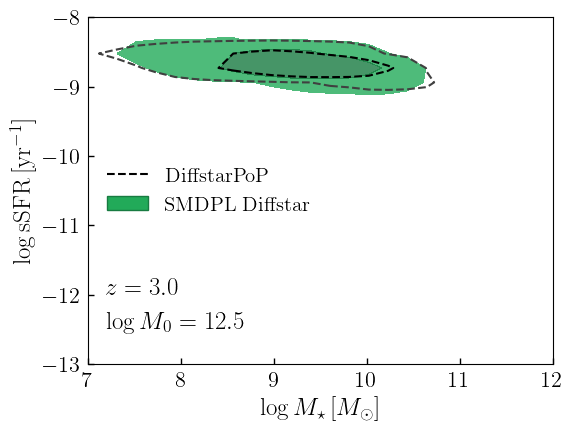

12.5 2.9318768277875353
9.18
9.15


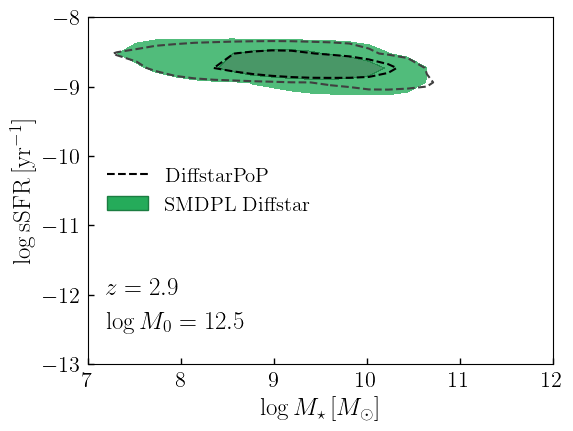

12.5 2.9165454686400625
9.19
9.17


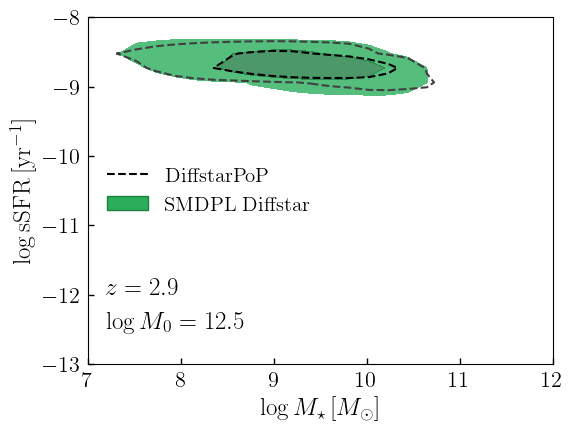

12.5 2.8714152755834985
9.23
9.2


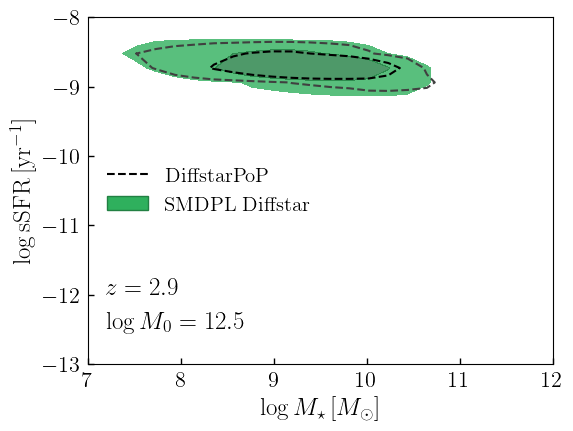

12.5 2.842026710276336
9.25
9.23


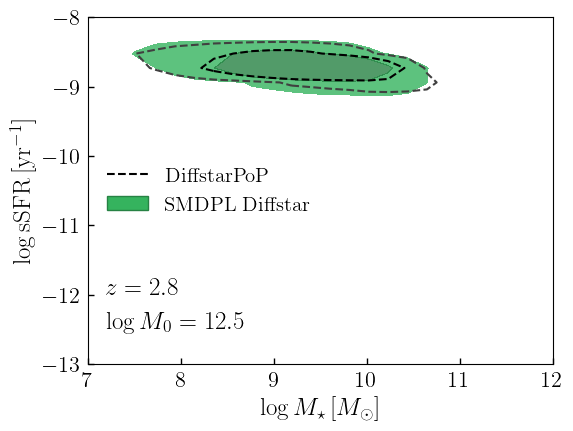

12.5 2.813177363458304
9.27
9.25


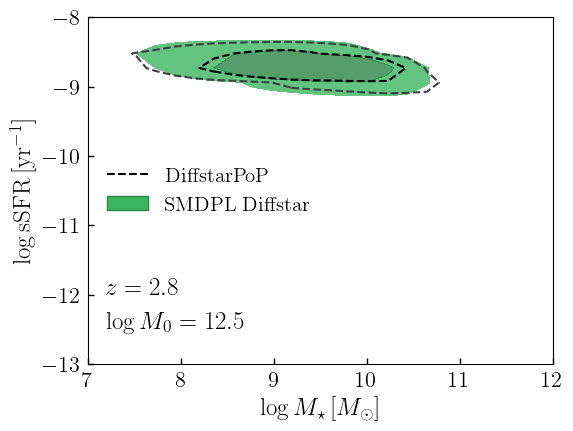

12.5 2.7848513853193726
9.29
9.27


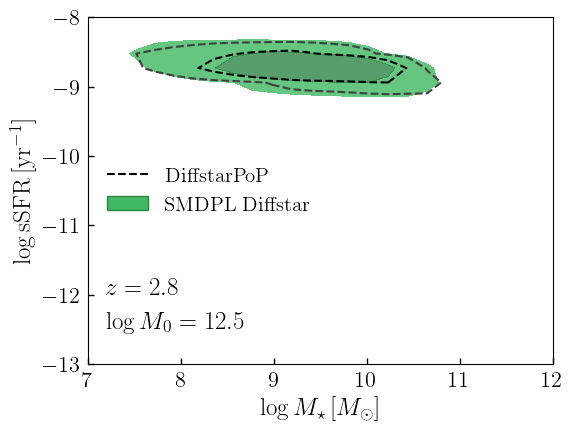

12.5 2.7570336318215474
9.32
9.3


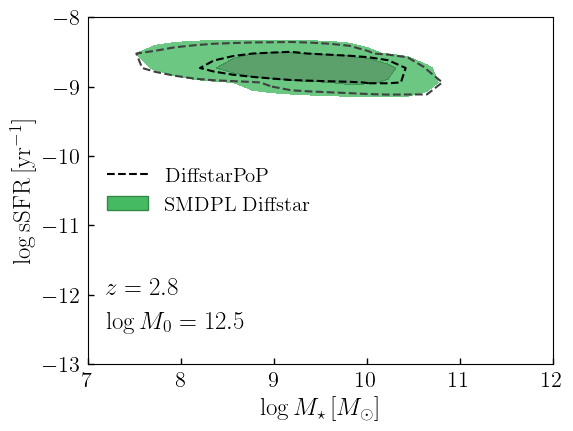

12.5 2.729709437706067
9.34
9.32


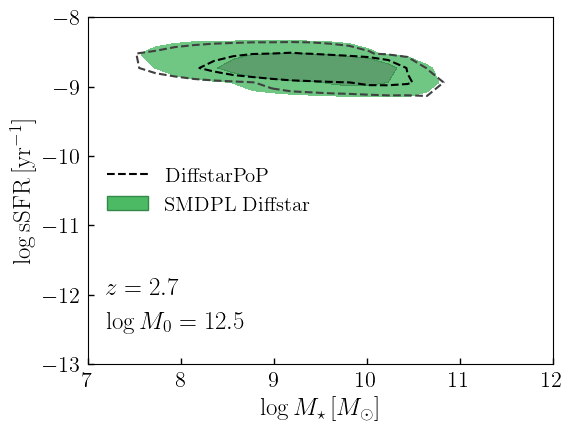

12.5 2.7028648040767567
9.36
9.34


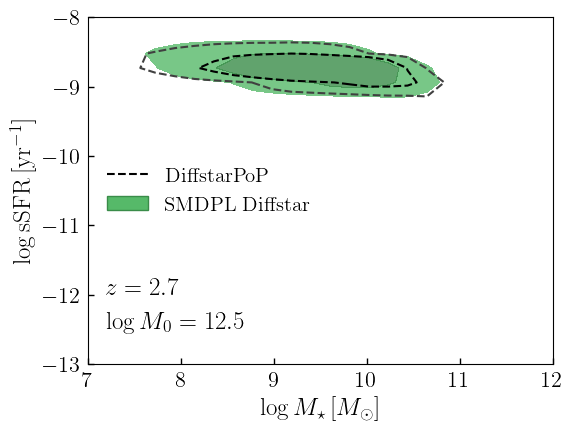

12.5 2.663467670280455
9.39
9.37


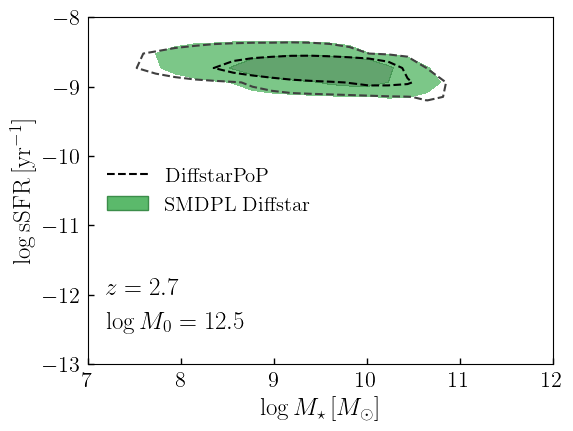

12.5 2.637764029574282
9.41
9.39


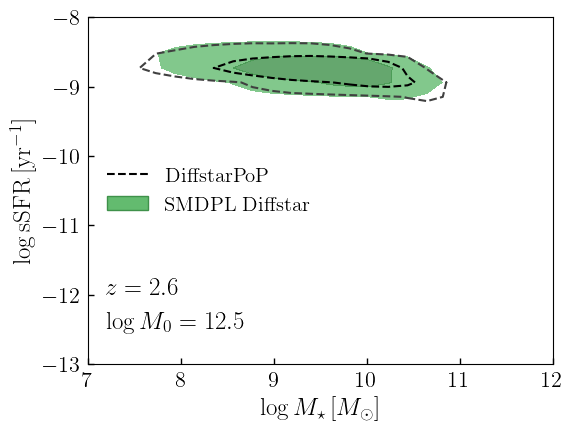

12.5 2.6000196382486203
9.44
9.42


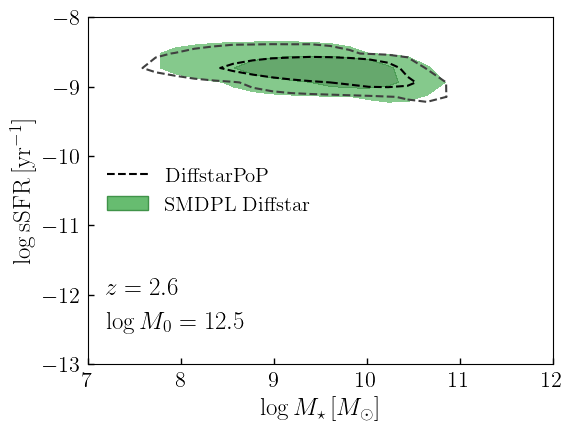

12.5 2.575380375955474
9.46
9.44


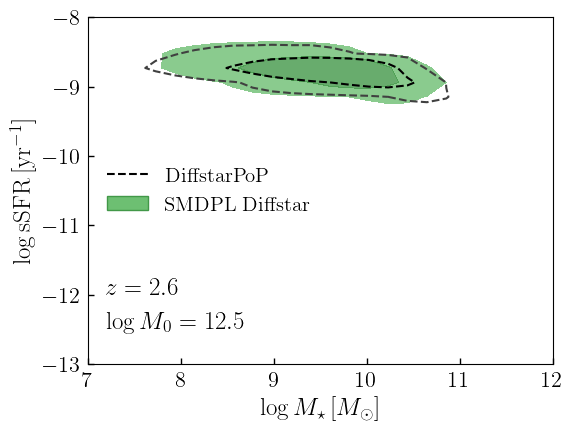

12.5 2.5511470196697696
9.48
9.46


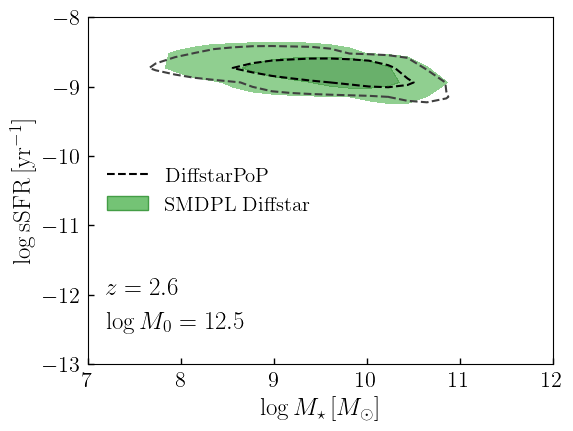

12.5 2.5155345975483137
9.51
9.49


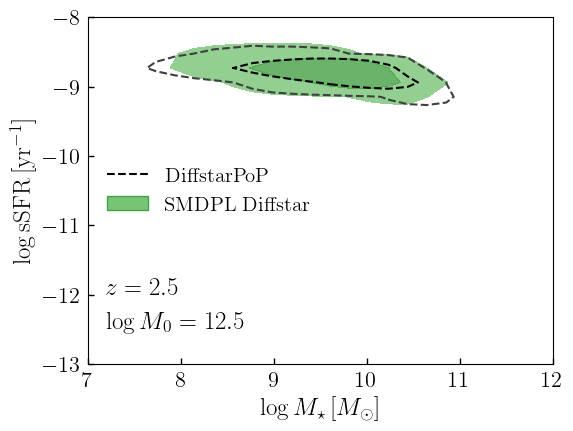

12.5 2.48077669698431
9.54
9.52


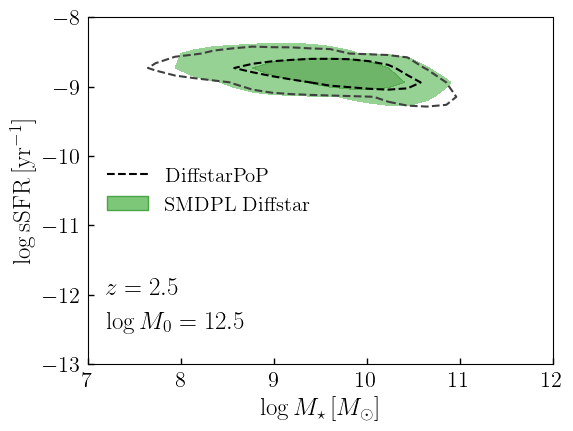

12.5 2.4580632280827746
9.56
9.54


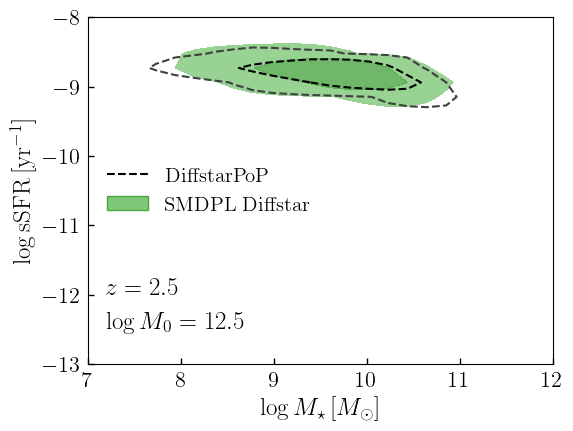

12.5 2.4246574549495032
9.58
9.57


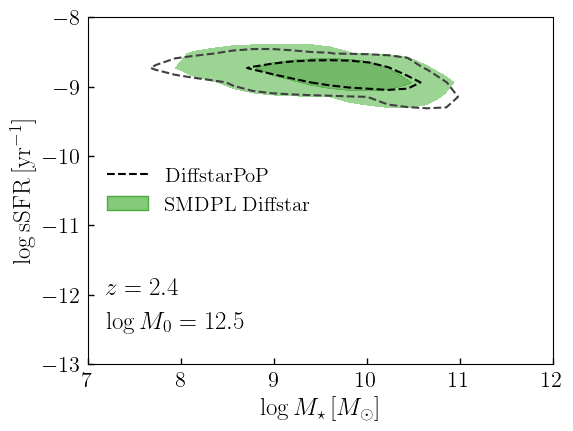

12.5 2.3920224848098486
9.61
9.59


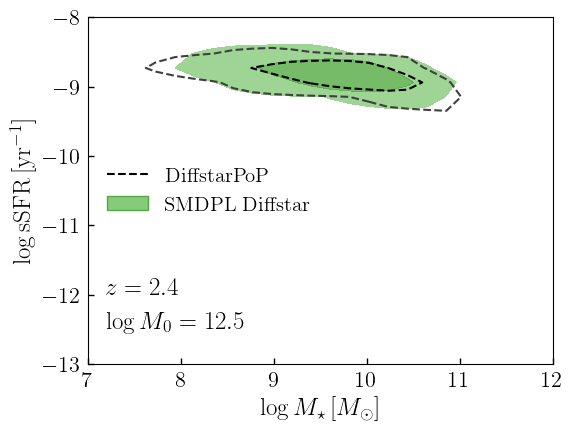

12.5 2.3601297450224576
9.63
9.62


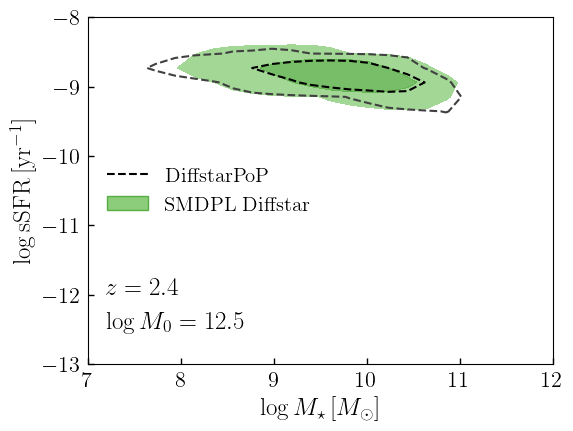

12.5 2.3289522349818914
9.66
9.65


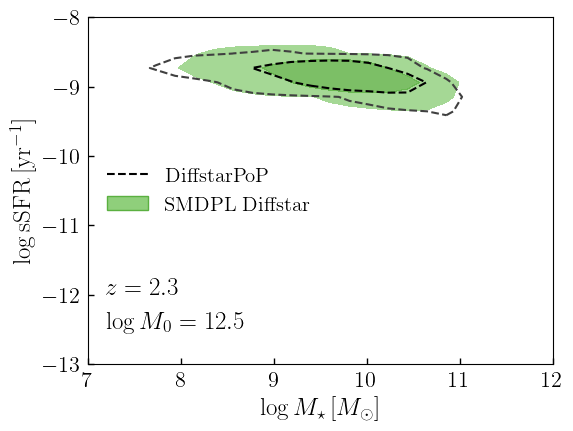

12.5 2.298464152832593
9.68
9.67


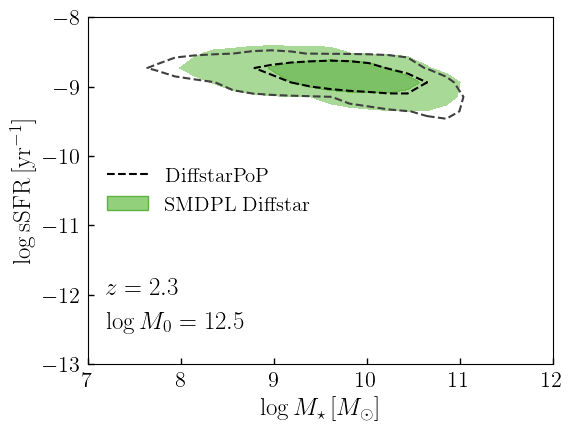

12.5 2.2686410542987208
9.71
9.69


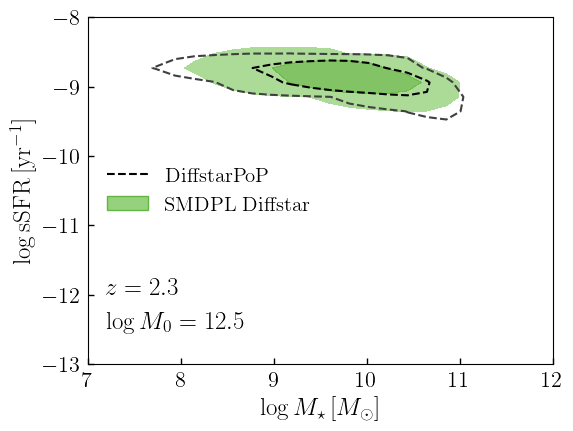

12.5 2.2394596324593614
9.73
9.72


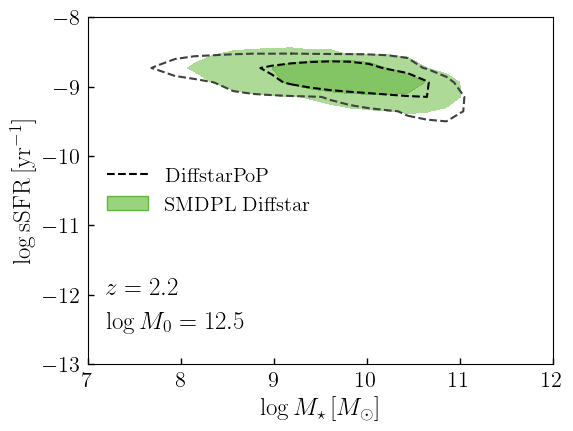

12.5 2.2108976691745337
9.75
9.74


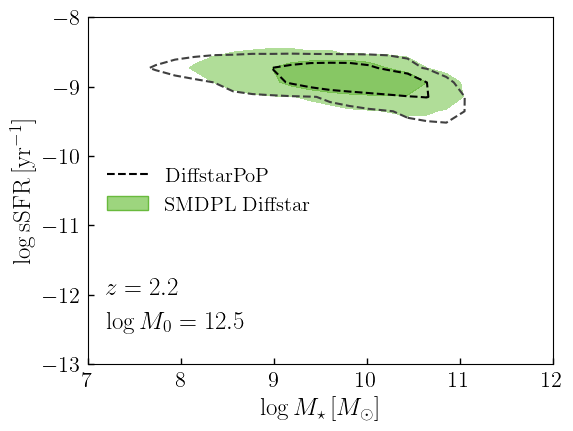

12.5 2.1829340659593766
9.77
9.77


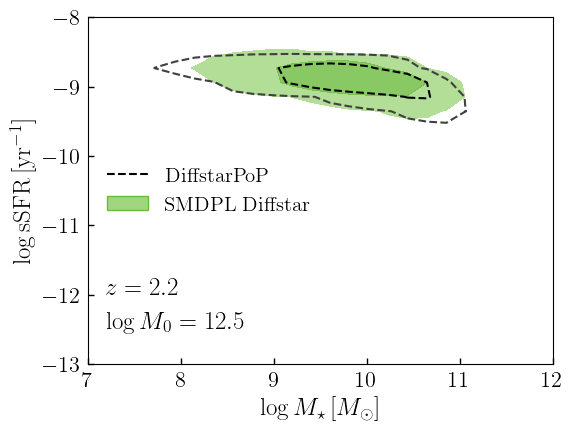

12.5 2.1555485843757594
9.8
9.79


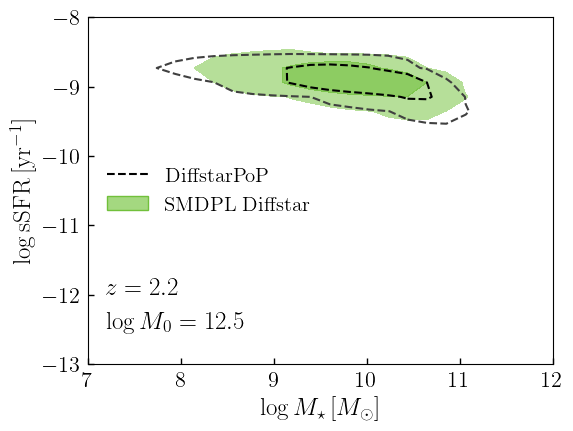

12.5 2.119900809208549
9.82
9.82


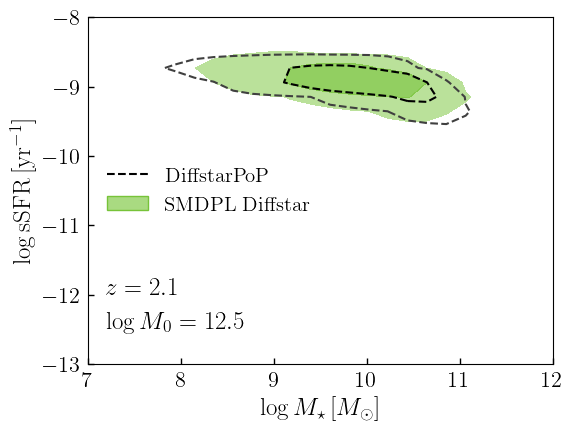

12.5 2.093790990277588
9.84
9.84


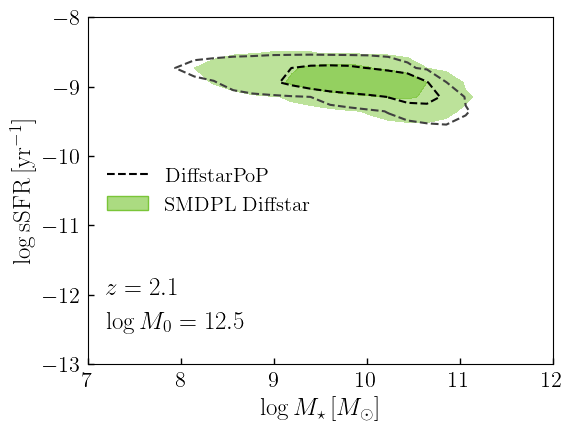

12.5 2.05977964051967
9.87
9.87


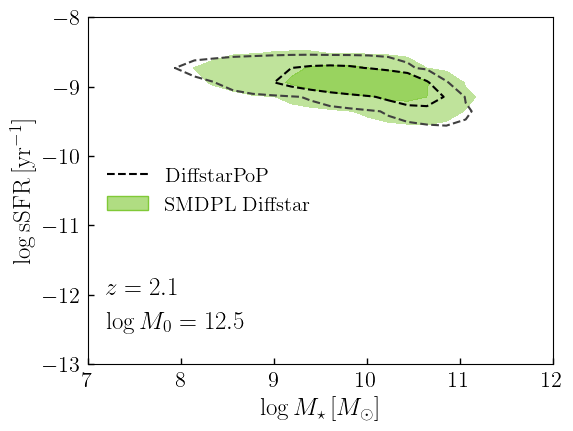

12.5 2.0266490707946287
9.9
9.89


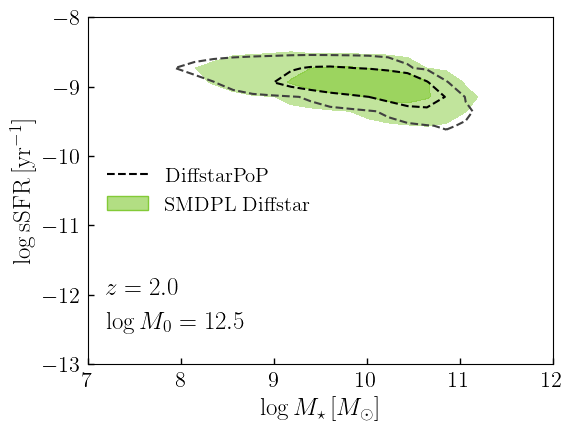

12.5 2.002356971812307
9.92
9.91


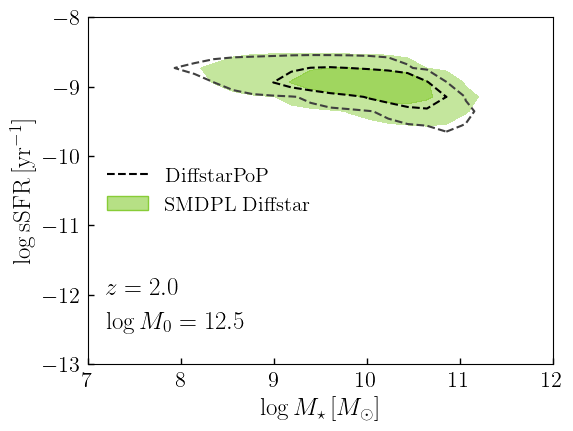

12.5 1.9706806682774862
9.94
9.94


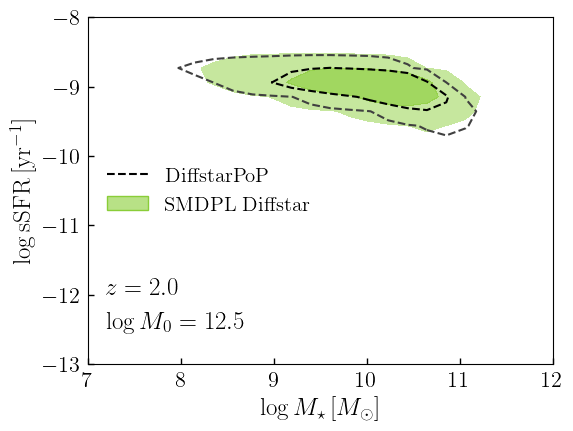

12.5 1.93978909062592
9.96
9.96


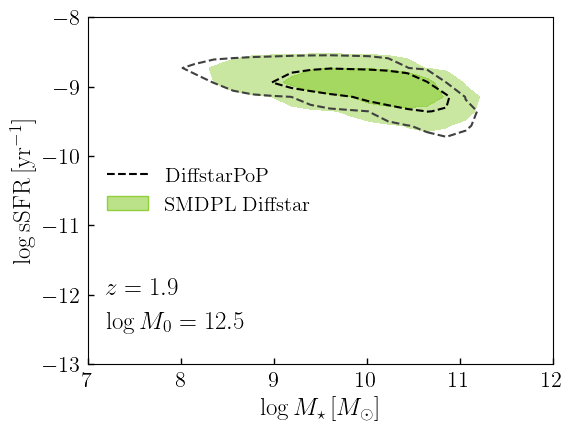

12.5 1.9096508852504683
9.99
9.99


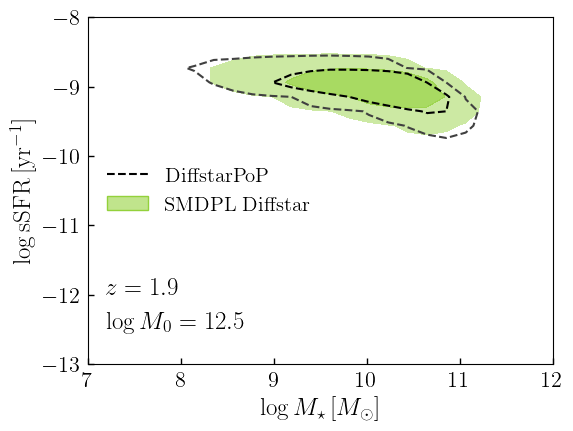

12.5 1.8802364041130433
10.01
10.01


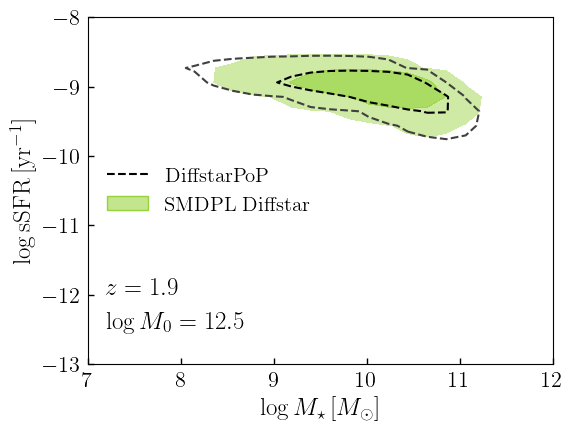

12.5 1.8515175734908202
10.03
10.03


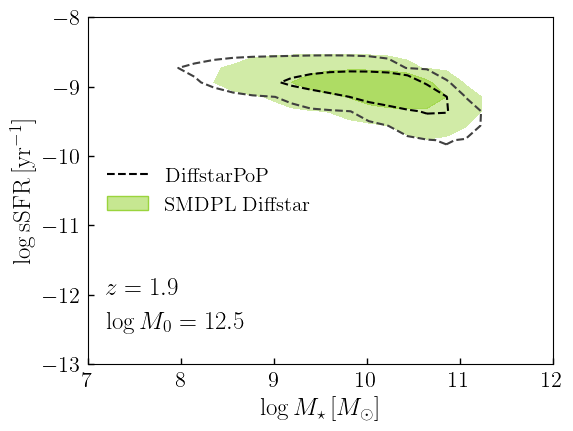

12.5 1.8165568463720843
10.06
10.06


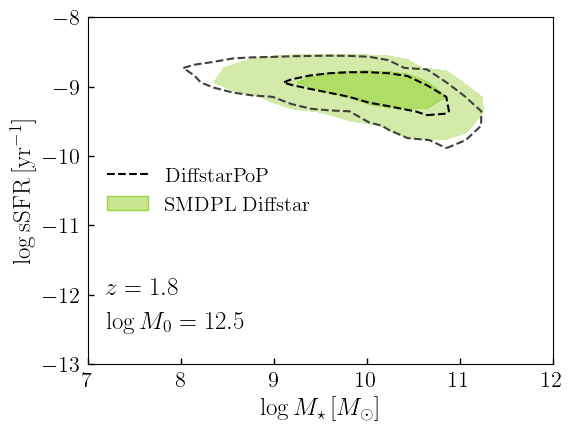

12.5 1.789307984497507
10.08
10.08


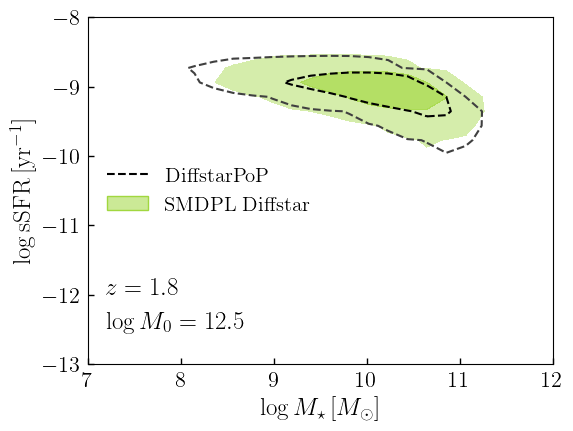

12.5 1.7561078134008234
10.1
10.11


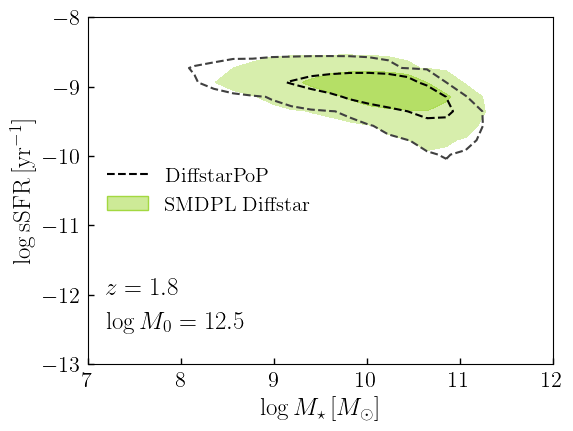

12.5 1.7302092082829221
10.12
10.13


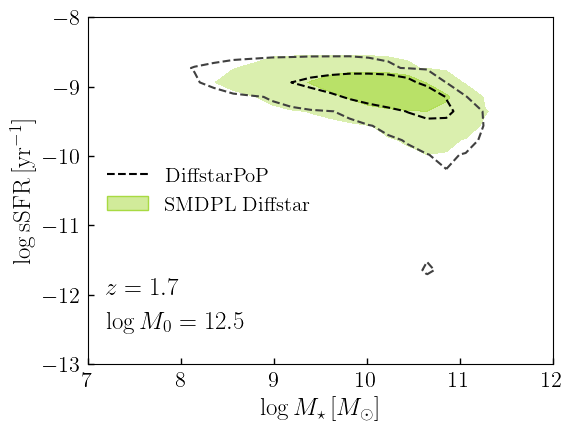

12.5 1.6986282803839976
10.14
10.15


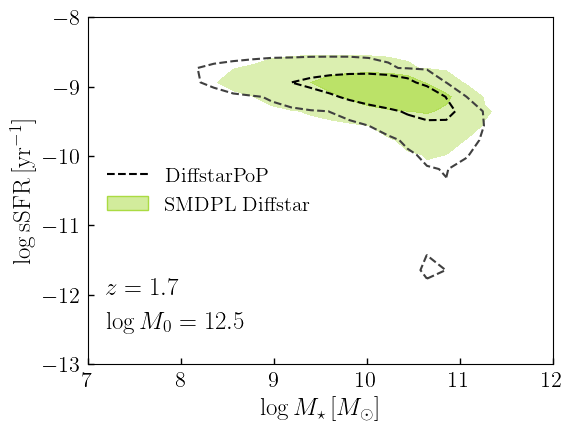

12.5 1.6678915217371184
10.17
10.18


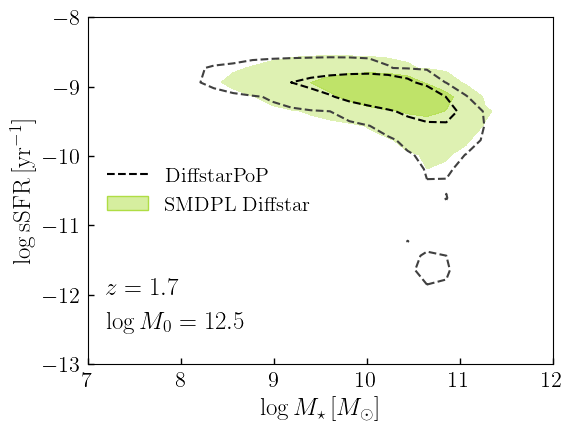

12.5 1.6379623441877367
10.19
10.2


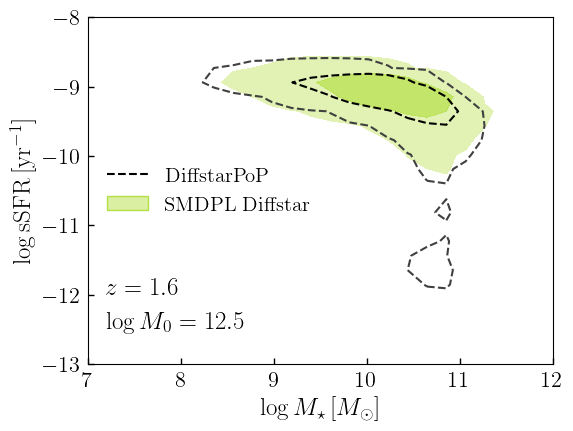

12.5 1.6088063108064117
10.21
10.22


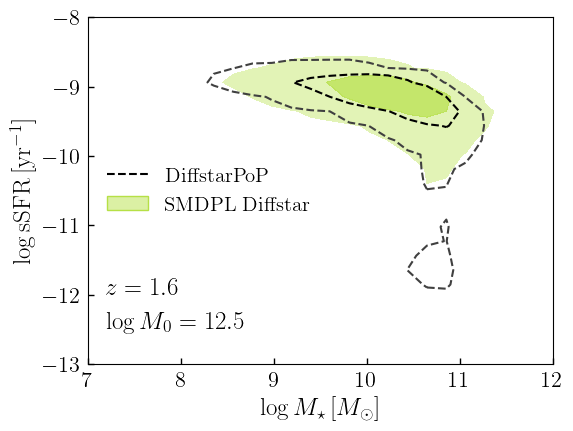

12.5 1.574794027948389
10.23
10.25


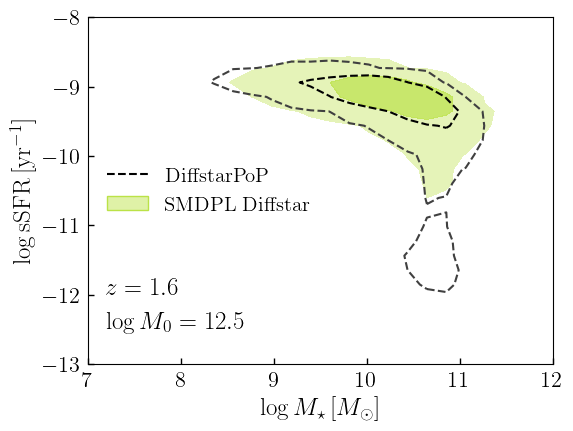

12.5 1.547227208692221
10.25
10.27


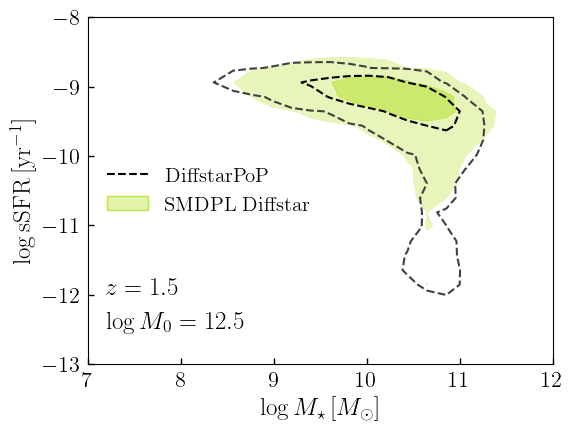

12.5 1.5150363617252194
10.27
10.29


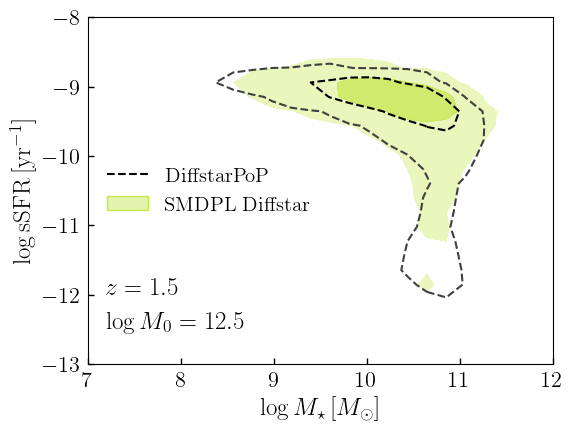

12.5 1.4837719820219124
10.29
10.31


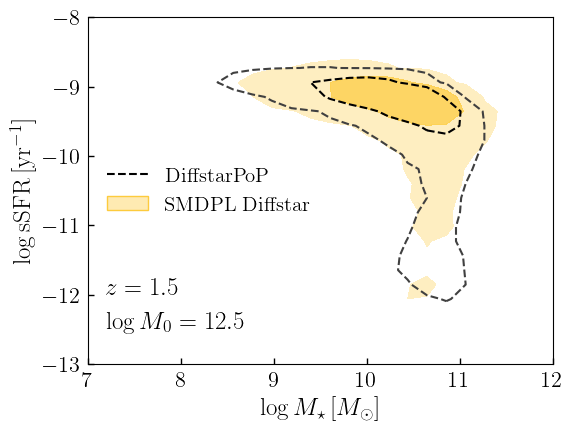

12.5 1.453390617925071
10.31
10.34


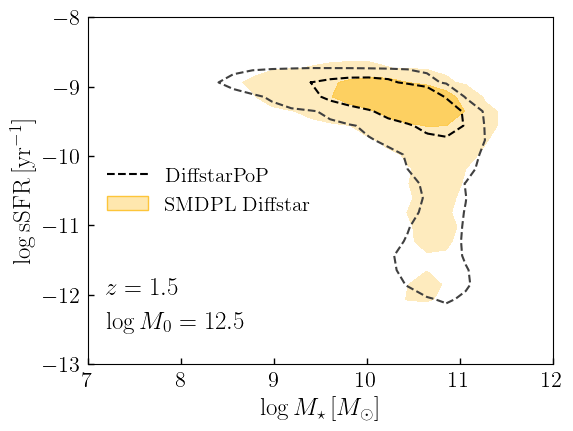

12.5 1.423851603397813
10.33
10.36


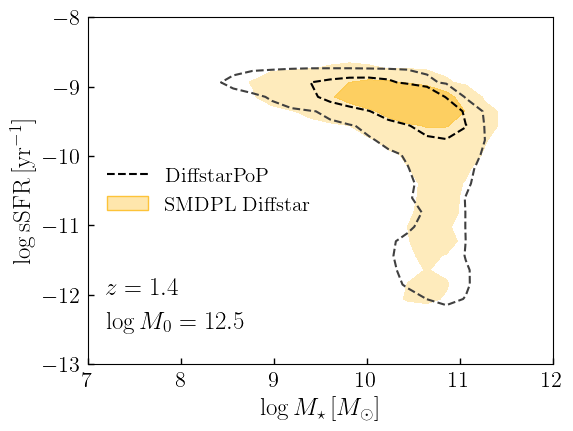

12.5 1.395116756566505
10.35
10.38


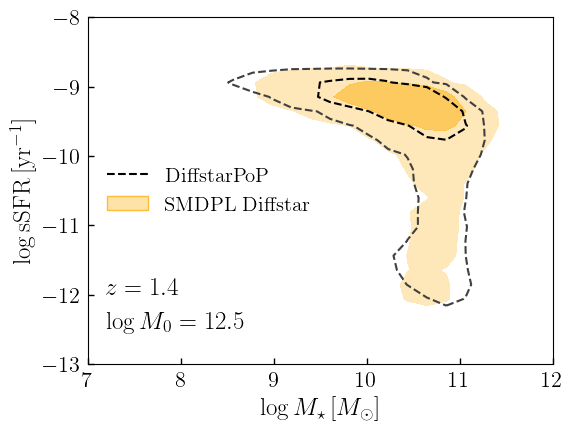

12.5 1.3625615232179442
10.37
10.4


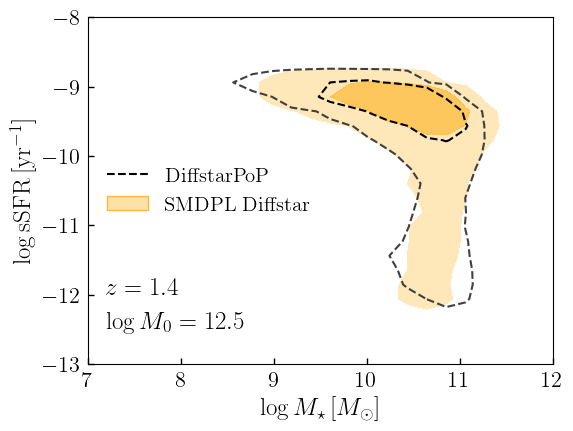

12.5 1.3354490620360584
10.39
10.42


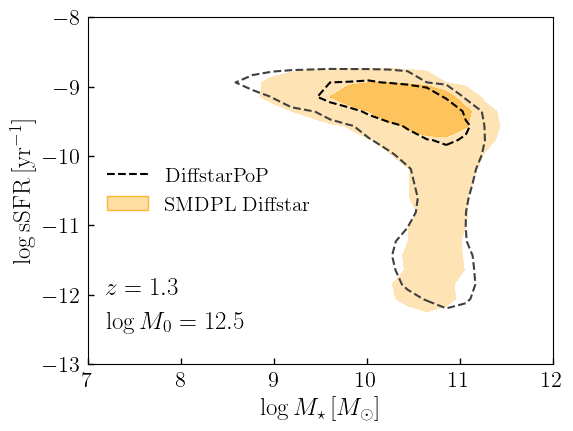

12.5 1.3046978576981727
10.41
10.44


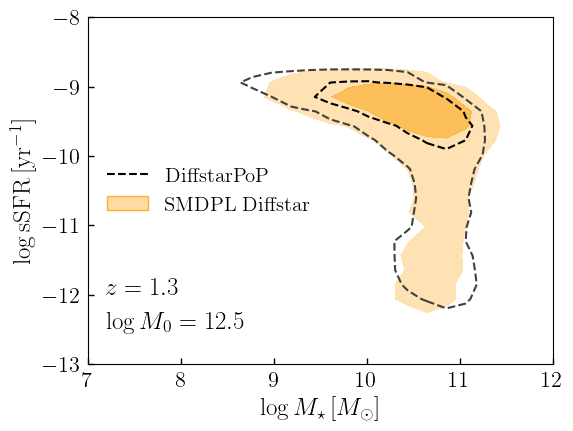

12.5 1.2706572128014941
10.43
10.46


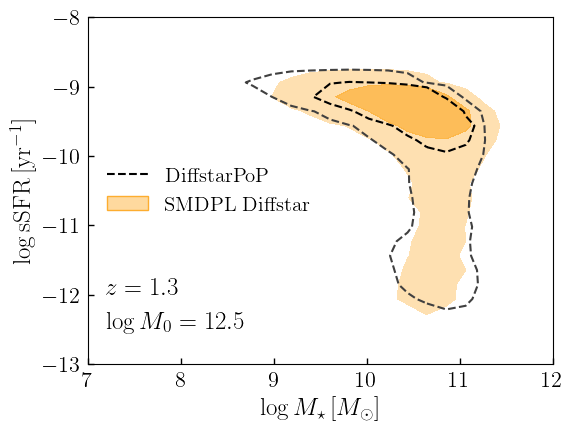

12.5 1.24178858569914
10.45
10.48


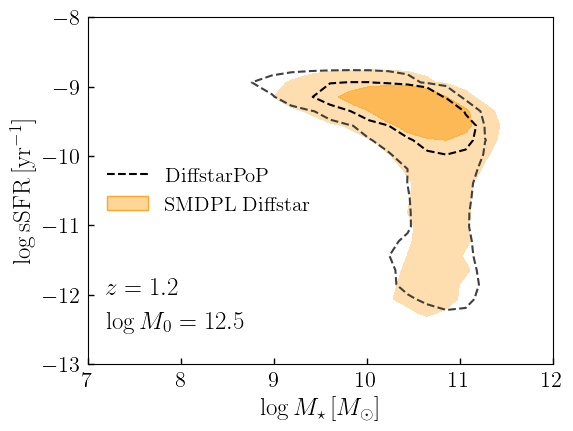

12.5 1.213733391243055
10.46
10.49


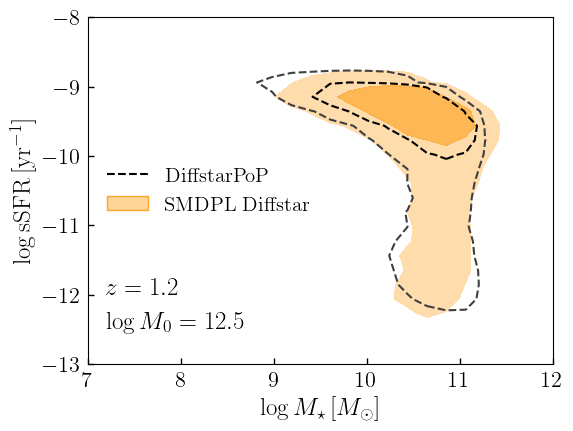

12.5 1.1826180079852109
10.48
10.51


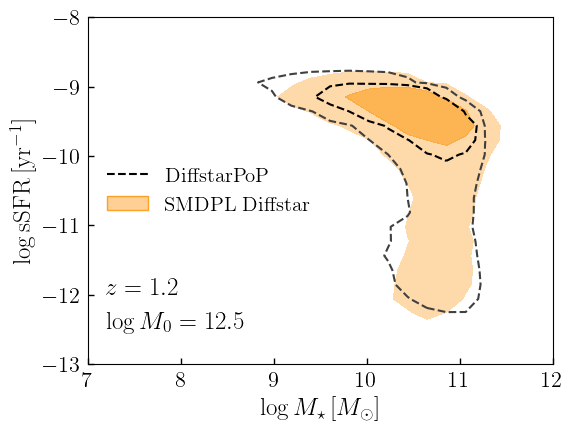

12.5 1.1524631567434145
10.5
10.53


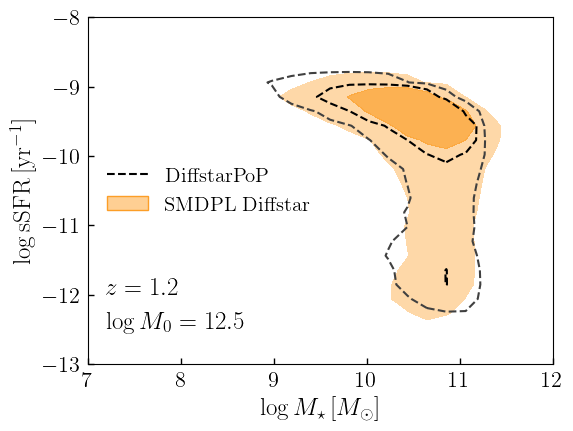

12.5 1.1196263023193873
10.51
10.55


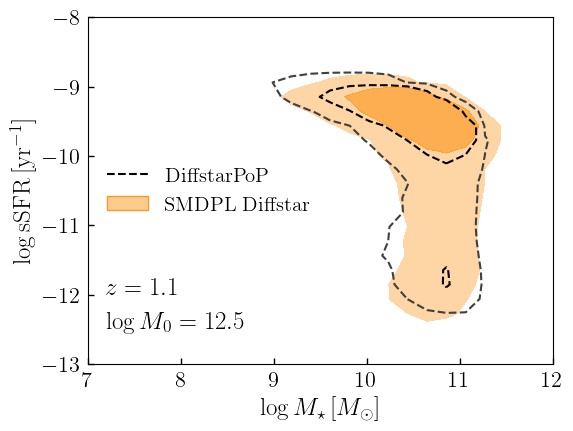

12.5 1.0913543045062977
10.53
10.56


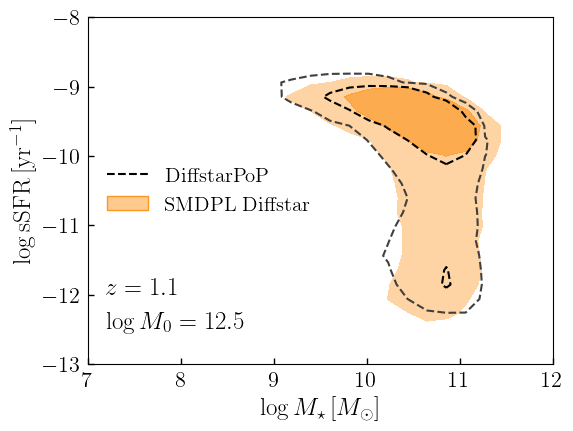

12.5 1.0605245802433465
10.54
10.58


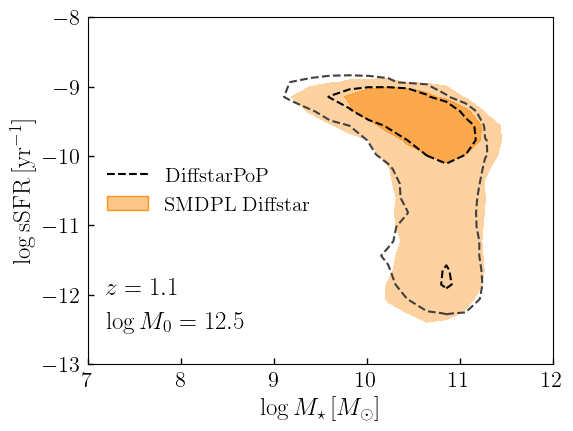

12.5 1.0306749543557128
10.56
10.59


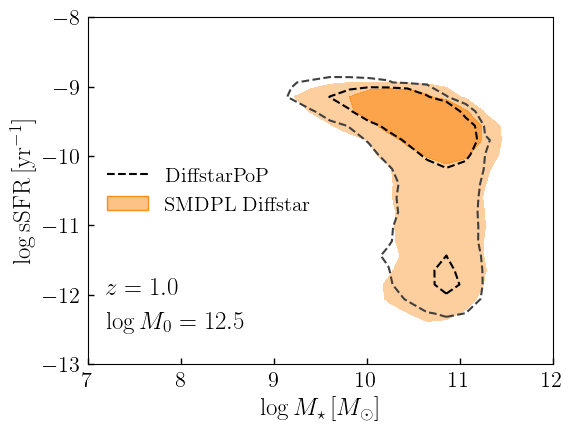

12.5 0.998595366951
10.57
10.61


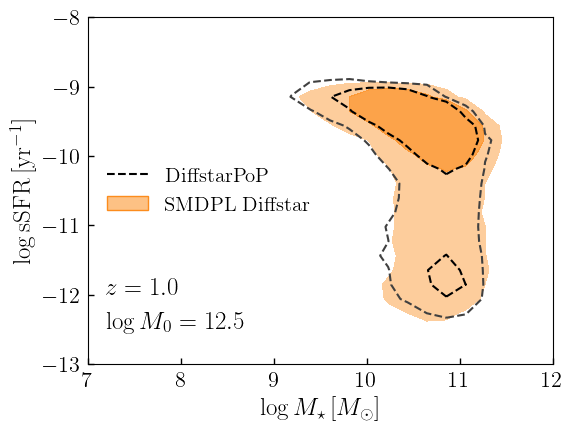

12.5 0.9706493495609776
10.59
10.62


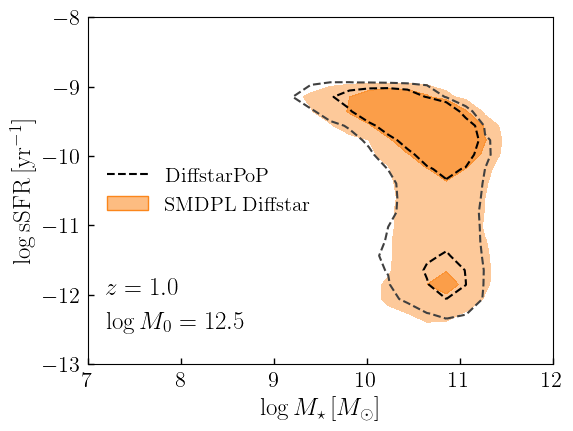

12.5 0.9405708076297298
10.6
10.64


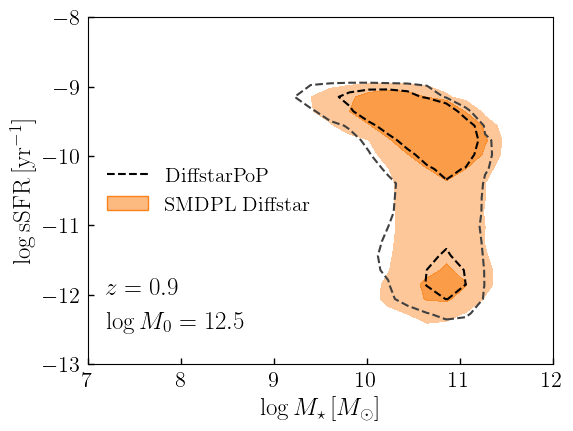

12.5 0.9086018993582455
10.61
10.65


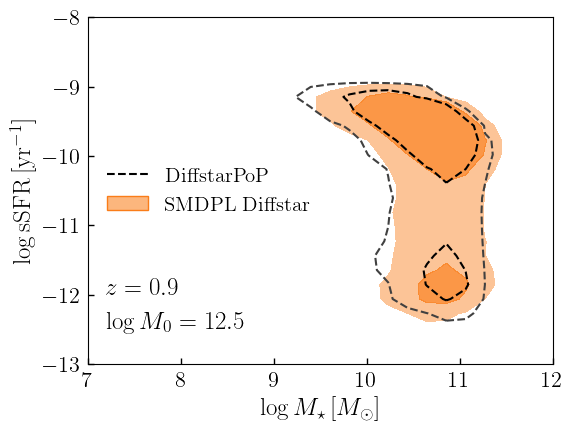

12.5 0.8777366354437223
10.63
10.66


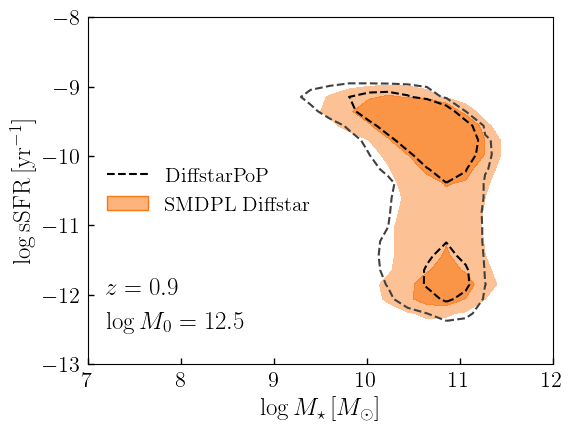

12.5 0.8479112224068129
10.64
10.67


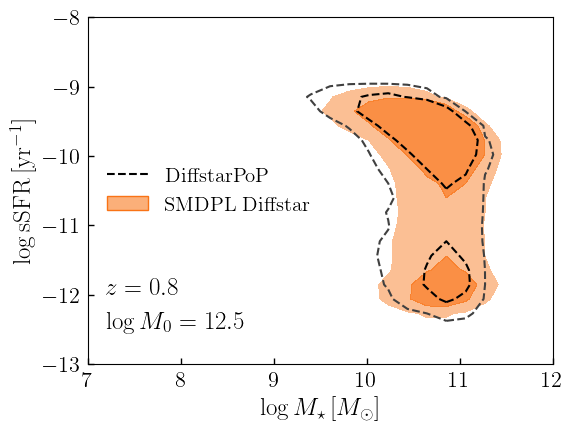

12.5 0.8190668468933079
10.65
10.69


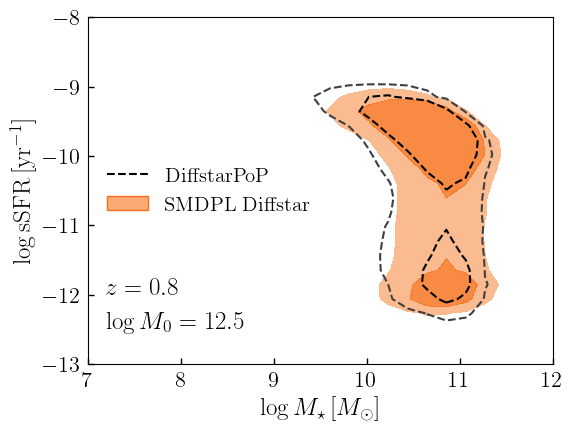

12.5 0.7886554020119209
10.66
10.7


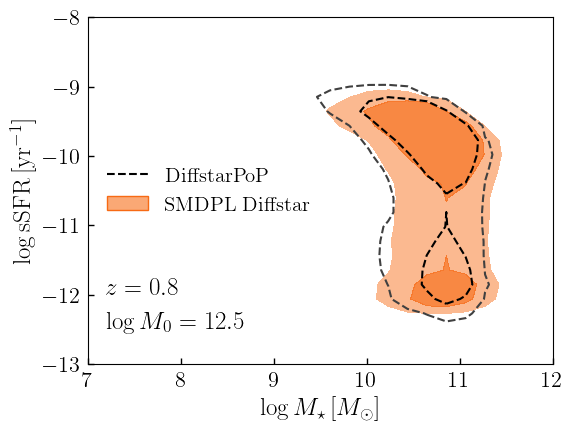

12.5 0.7568790117990879
10.67
10.71


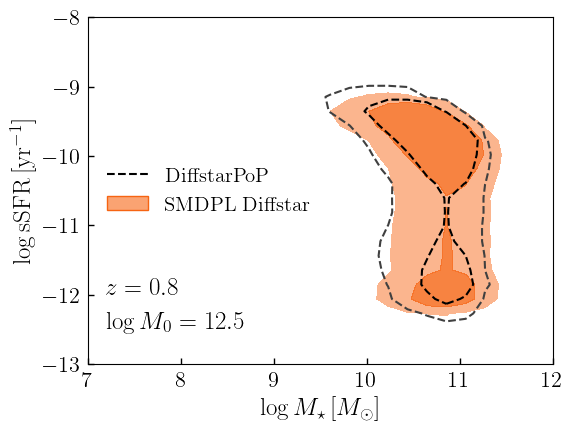

12.5 0.7262449851476577
10.69
10.72


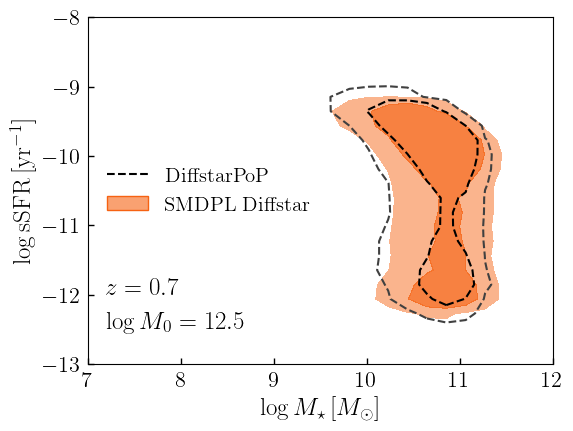

12.5 0.6966838385014489
10.7
10.73


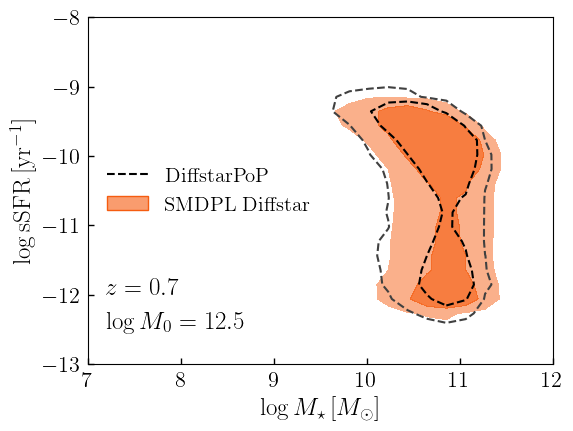

12.5 0.6659756113033419
10.71
10.73


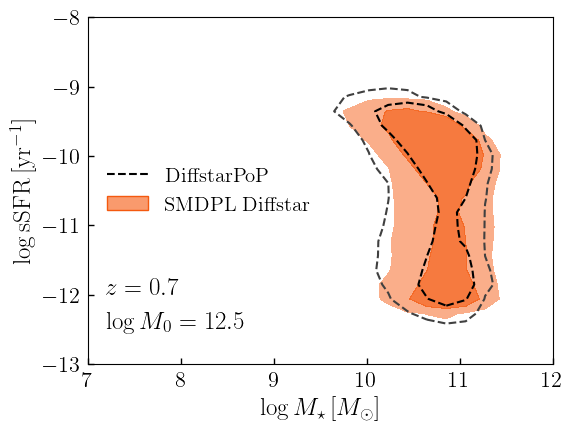

12.5 0.6363648142075694
10.72
10.74


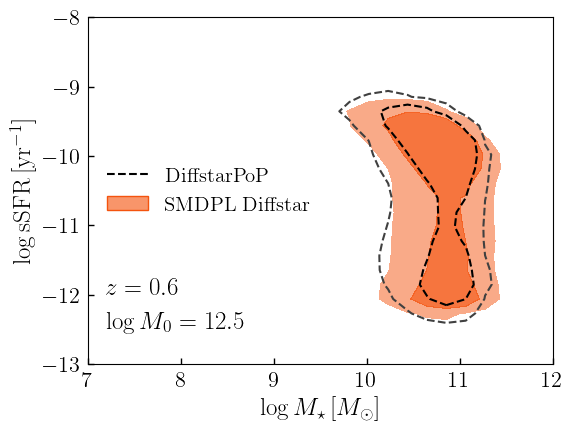

12.5 0.605780968067031
10.72
10.75


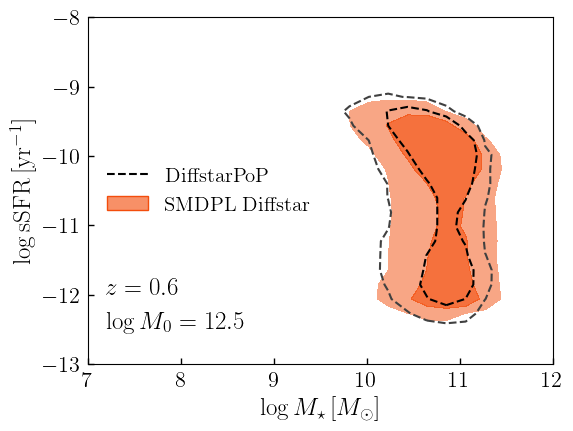

12.5 0.5763050958622952
10.73
10.76


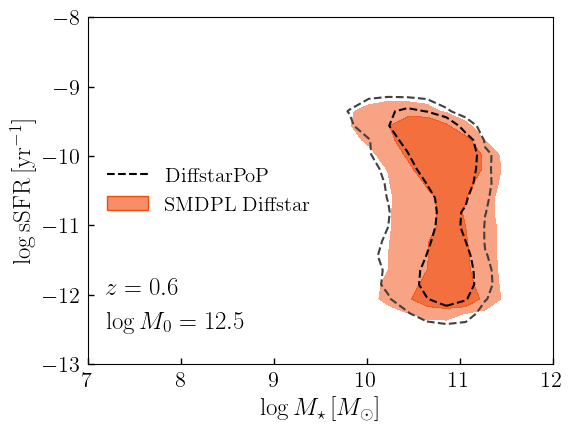

12.5 0.5460080999423912
10.74
10.77


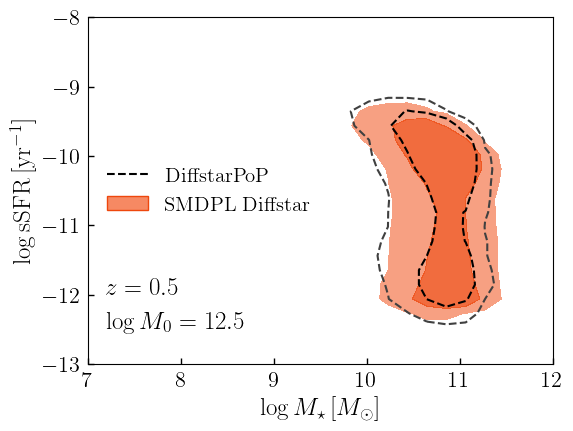

12.5 0.5150281769278837
10.75
10.77


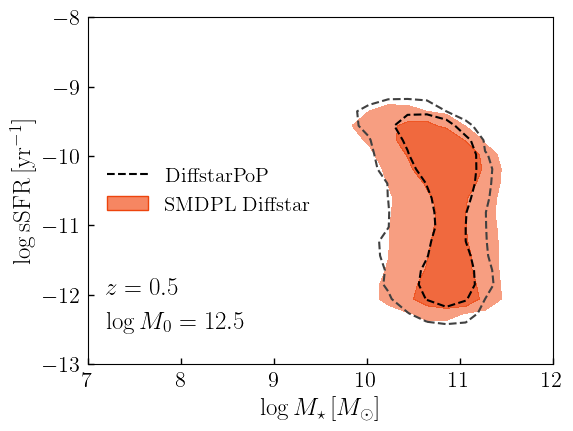

12.5 0.4852142059797738
10.76
10.78


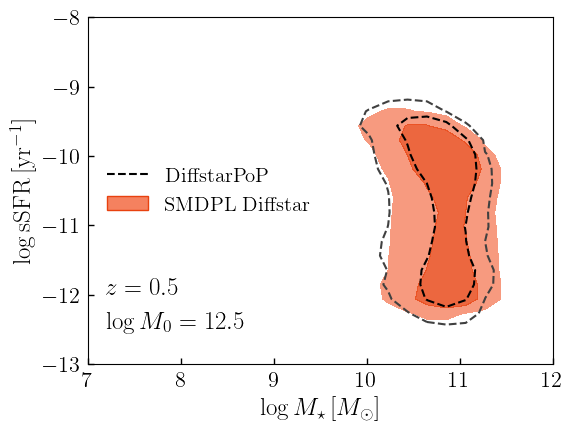

12.5 0.45483343483316874
10.76
10.79


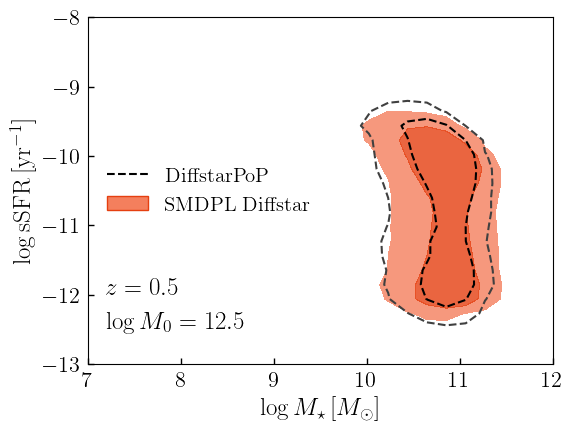

12.5 0.42400107140596144
10.77
10.79


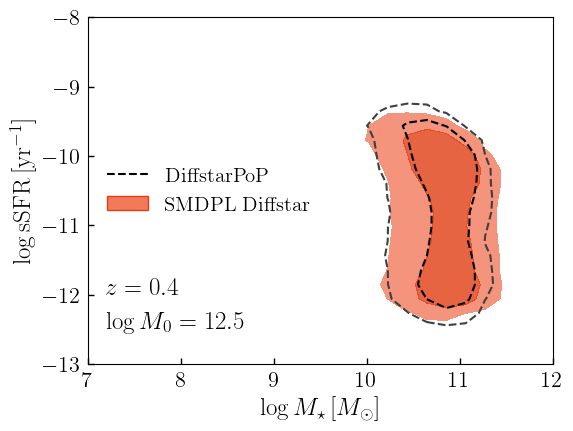

12.5 0.39435300706162857
10.78
10.8


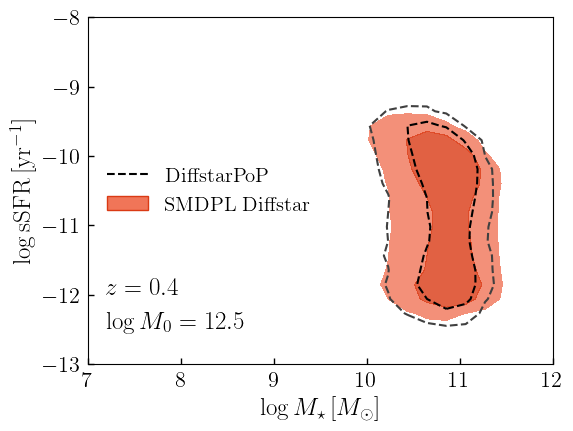

12.5 0.3643374042131193
10.78
10.8


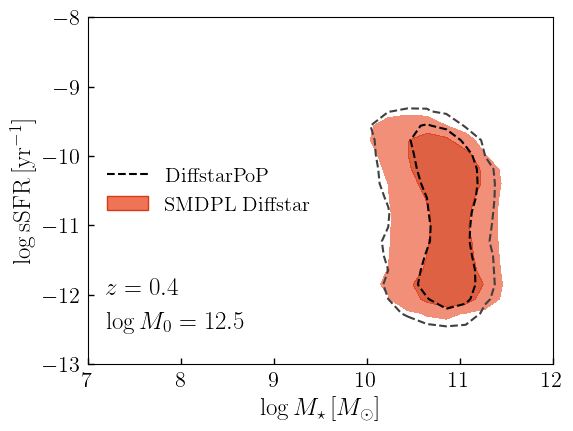

12.5 0.3326358337711671
10.79
10.81


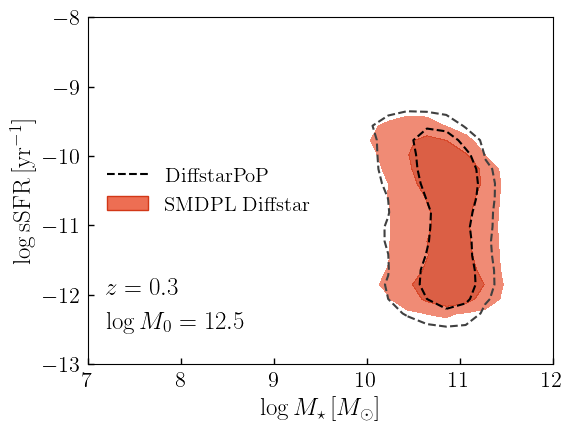

12.5 0.3035719388148142
10.8
10.81


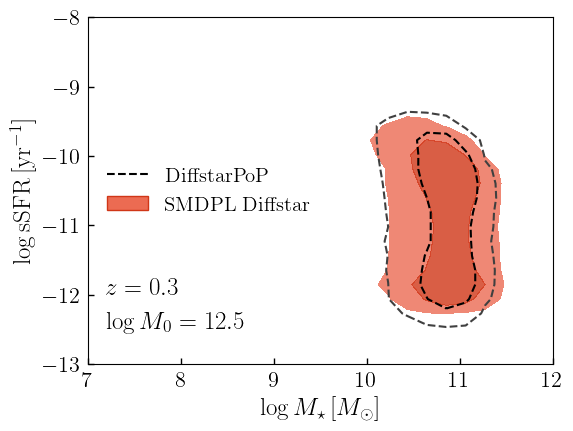

12.5 0.27298689520619124
10.8
10.82


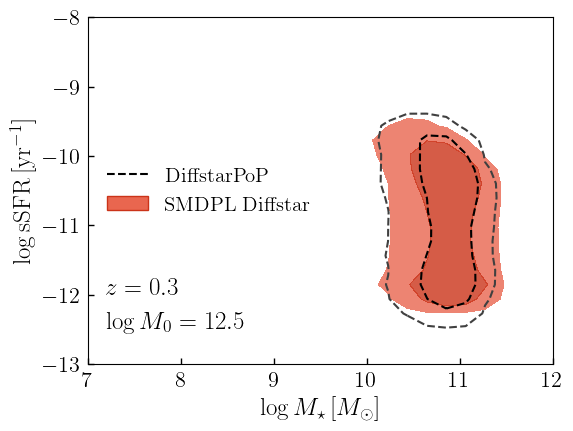

12.5 0.24236428944275734
10.81
10.82


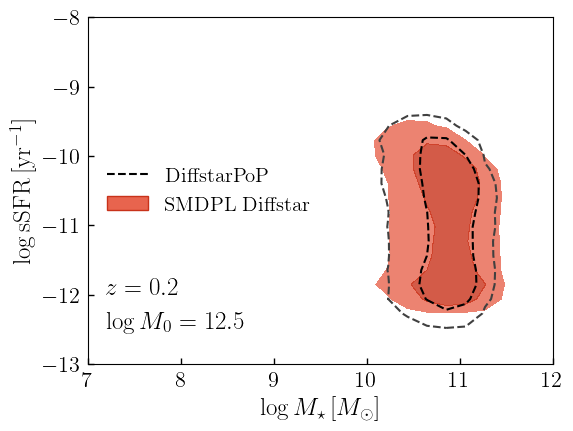

12.5 0.21176812260677474
10.81
10.83


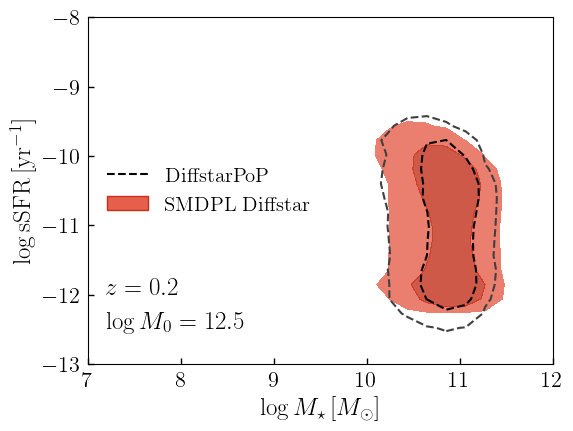

12.5 0.1812556506449588
10.82
10.83


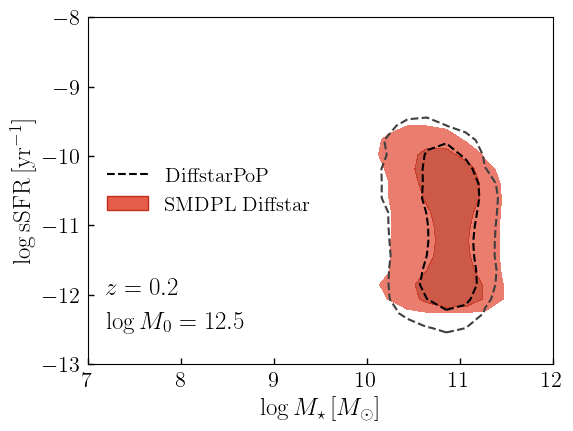

12.5 0.1519803269683838
10.82
10.84


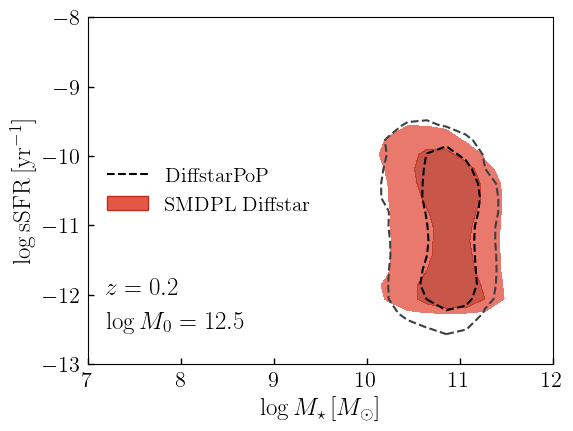

12.5 0.12173655790388731
10.83
10.84


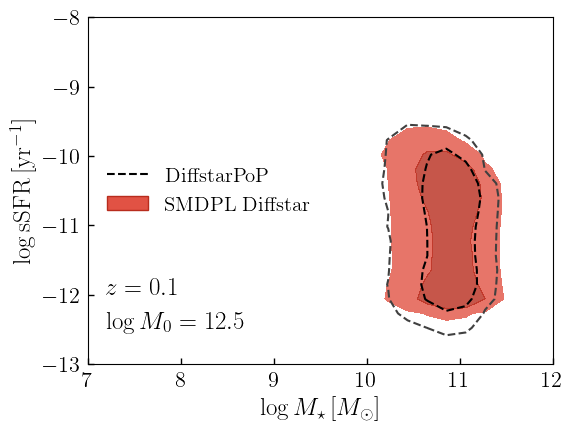

12.5 0.09070138939688771
10.83
10.85


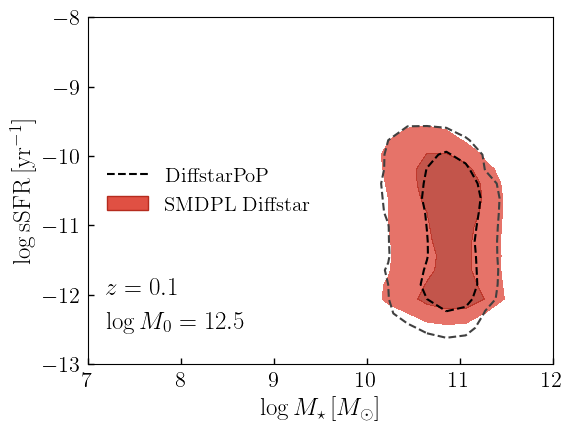

12.5 0.06097744987405092
10.84
10.85


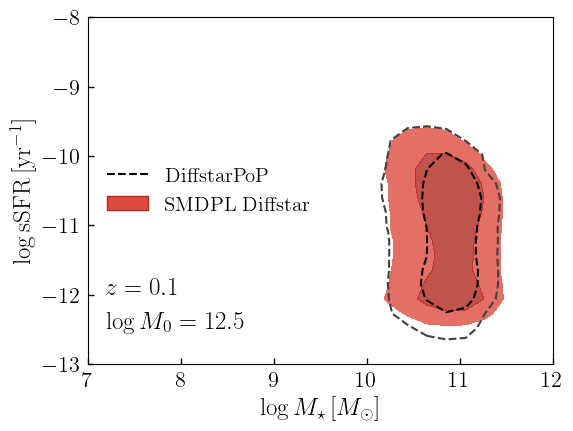

12.5 0.030609420547916037
10.84
10.86


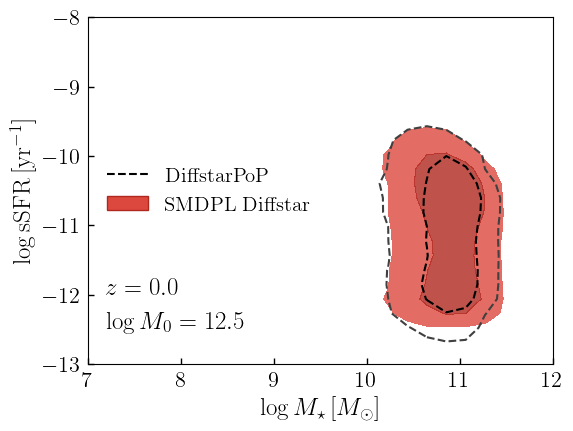

12.5 -0.00025703638540851655
10.84
10.86


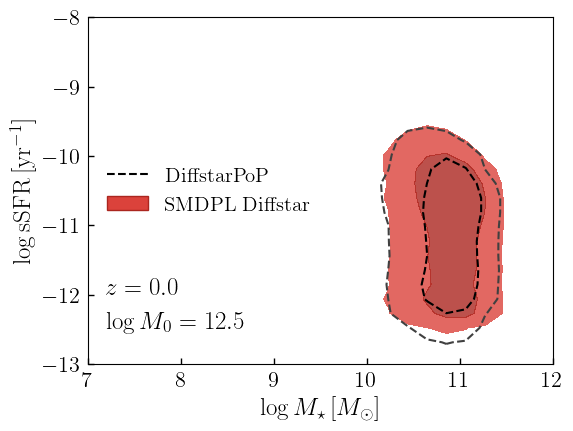

In [144]:


colors = ["#0077BB", "#33BBEE", "#009988", "#EE7733", "#CC3311", "#EE3377", '#882255', '#AA4499']
colors_test = plt.get_cmap("Greys")(np.linspace(0.3,0.7, 3))
colors_greys = plt.get_cmap("Greys")(np.array([0.8, 1.0]))
n_histories = int(5e4)
ran_key = jran.PRNGKey(0)

nbins_x = np.linspace(7, 12, 25)
nbins_y = np.linspace(-13, -8.0, 25)
        
# nbins_x = bins_mstar.copy()
# nbins_y = bins_ssfr.copy()

smooth = False
# for i, bin_id in enumerate([2,4,6]):

bin_id = 3
t_table = np.linspace(1.0, TODAY, 1000)
lgt = jnp.log10(t_table)
z_table = np.array([z_at_value(Planck13.age, x * u.Gyr, zmin=-1) for x in t_table])

t0 = time.time()
histories = draw_sfh_MIX(
    t_table,
    logm0_binmids[bin_id],
    halo_data_MC.reshape(len(logm0_binmids),Nhalos,4)[bin_id],
    p50.reshape(len(logm0_binmids),Nhalos)[bin_id],
    n_histories,
    ran_key,
    index_select,
    index_high,
    fstar_tdelay,
    #init_guess[0:N_PDF_Q],
    #init_guess[N_PDF_Q:N_PDF_Q+N_PDF_MS],
    #init_guess[N_PDF_Q+N_PDF_MS:N_PDF_Q+N_PDF_MS+N_R_Q],
    #init_guess[N_PDF_Q+N_PDF_MS+N_R_Q:N_PDF_Q+N_PDF_MS+N_R_Q+N_R_MS],
    outputs[0][0:N_PDF_Q],
    outputs[0][N_PDF_Q:N_PDF_Q+N_PDF_MS],
    outputs[0][N_PDF_Q+N_PDF_MS:N_PDF_Q+N_PDF_MS+N_R_Q],
    outputs[0][N_PDF_Q+N_PDF_MS+N_R_Q:N_PDF_Q+N_PDF_MS+N_R_Q+N_R_MS],
)

weights = histories[4].copy()
_params = np.zeros((Nhalos, 6))
_params[:, 0] = np.log10(TODAY)
_params[:, 1:3] = halo_data_MC.reshape(len(logm0_binmids),Nhalos,4)[bin_id][:, 0:2]
_params[:, 3] = 3.5
_params[:, 4:6] = halo_data_MC.reshape(len(logm0_binmids),Nhalos,4)[bin_id][:, 2:4]

mah_histories = _calc_halo_history_vmap(lgt, *_params.T)

_mask = (logmpeak > logm0_binmids[bin_id] - logm0_bin_widths[bin_id]) 
_mask &= (logmpeak < logm0_binmids[bin_id] + logm0_bin_widths[bin_id])
mah_histories_SMDPL = _calc_halo_history_vmap(lgt, *mah_params_arr[_mask].T)

histories_SMDPL = sm_sfr_history_diffstar_scan_XsfhXmah_vmap(
    t_table,
    jnp.log10(t_table),
    _get_dt_array(t_table),
    mah_params_arr[_mask][:, np.array([1,2,4,5])],
    u_fit_params_arr[_mask][:,np.array([0,1,2,4])],
    u_fit_params_arr[_mask][:,5:9],
    index_select,
    index_high,
    fstar_tdelay,
)
t1 = time.time()
print("time i", t1-t0)

_ids = np.argmin(np.subtract.outer(z_table, np.linspace(0, 3.0, 100))**2, axis=0)[::-1]

# for j, t_id in enumerate(t_sel_hists[::-1]):
for j, t_id in enumerate(_ids):

    # j = 0
    # t_id = _ids[j]
    print(logm0_binmids[bin_id], z_table[t_id])

    _fact = 1.5
    fig, ax = plt.subplots(1, 1, figsize=(4*_fact,3*_fact))

    xdata = np.log10(histories[0][:, t_id])
    print(np.round(np.average(xdata, weights=np.array(weights)),2))
    ydata = np.log10(histories[1][:, t_id] / histories[0][:, t_id])

    density_contour(xdata, ydata, nbins_x, nbins_y, ax=ax, smooth=smooth, weights=weights, level=0.68, linestyles=['--'], colors=[colors_greys[1]])
    density_contour(xdata, ydata, nbins_x, nbins_y, ax=ax, smooth=smooth, weights=weights, level=0.95, linestyles=['--'], colors=[colors_greys[0]])

    xdata = np.log10(histories_SMDPL[0][:, t_id])
    ydata = np.log10(histories_SMDPL[1][:, t_id] / histories_SMDPL[0][:, t_id])
    print(np.round(np.mean(xdata),2))
    # density_contour(xdata, ydata, nbins_x, nbins_y, ax=ax, smooth=smooth, level=0.68, linestyles=['--'], colors=[colors[4]])
    # density_contour(xdata, ydata, nbins_x, nbins_y, ax=ax, smooth=smooth, level=0.95, linestyles=['--'], colors=[colors[4]])
    # density_contourf(xdata, ydata, nbins_x, nbins_y, ax=ax, smooth=smooth, levels=[0.68, 0.95], linestyles=['--'], colors=[colors[4]])
    # colors_ = plt.get_cmap("RdYlGn")(np.linspace(0.0,1.0, 10))
    colors_ = np.concatenate((
        np.array(plt.get_cmap("RdYlGn")(np.linspace(0.1,0.4, int(len(_ids)/2)))),
        np.array(plt.get_cmap("RdYlGn")(np.linspace(0.6, 0.9, int(len(_ids)/2)))),
    ))[::-1]
    colors_ = [
        adjust_lightness(colors_[j], amount=1.1),
        adjust_lightness(colors_[j], amount=0.8),
        # colors_[j],
    ]
    density_contourf(xdata, ydata, nbins_x, nbins_y, ax=ax, smooth=smooth, levels=[0.0, .68, 0.95], colors=colors_, alpha=0.8)

    ax.text(7.2, -12.5, r"$\log M_0 = %.1f$"%logm0_binmids[bin_id], fontsize=18)
    ax.text(7.2, -12.5+0.5, r"$z = %.1f$"%abs(z_table[t_id]), fontsize=18)
    ax.set_xlabel(r'$\log M_\star\,[M_\odot]$')
    ax.set_ylabel(r'$\log \rm{sSFR}\,[\rm{yr}^{-1}]$')
    ax.set_xticks(np.arange(7,12.1,1))
    ax.set_yticks(np.arange(-13,-7.9,1))

    fig.subplots_adjust(wspace=0.4, hspace=0.3)

    legend_elements = [
        Line2D([0], [0], color='k', ls='--', label=r'DiffstarPoP'),
        Patch(facecolor=colors_[0], edgecolor=colors_[1], label=r'SMDPL Diffstar')
    ]
    ax.legend(handles=legend_elements, loc="center left")
    fig.savefig("mstar_ssfr_plots/mstar_vs_ssfr_diffstarpop_smdpl_m0%.2f_zevol%d.png"%(logm0_binmids[bin_id], j), bbox_inches="tight", dpi=300)
    plt.show()
    #break
        

248289
time i 28.584864854812622
11.5 0.4967190594981553
9.41
9.45


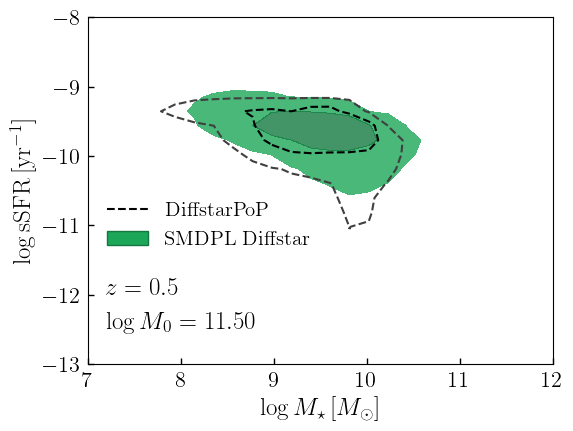

247072
time i 29.524659872055054
11.527272727272727 0.4967190594981553
9.46
9.51


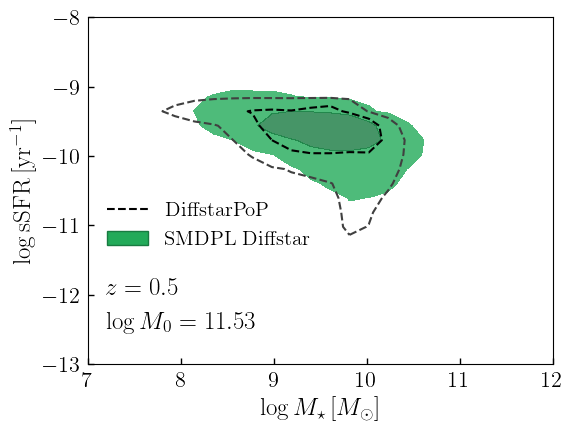

246076
time i 28.509852170944214
11.554545454545455 0.4967190594981553
9.52
9.56


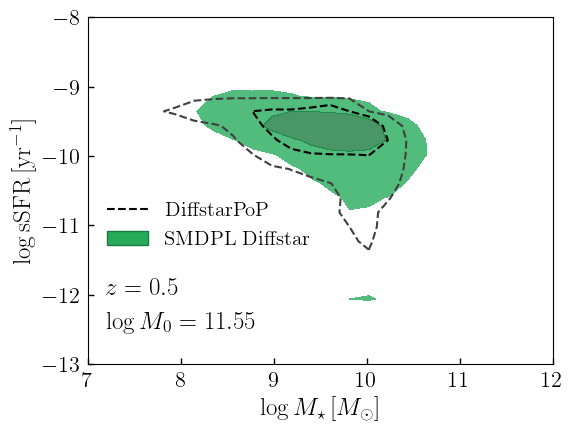

244989
time i 27.94427180290222
11.581818181818182 0.4967190594981553
9.57
9.62


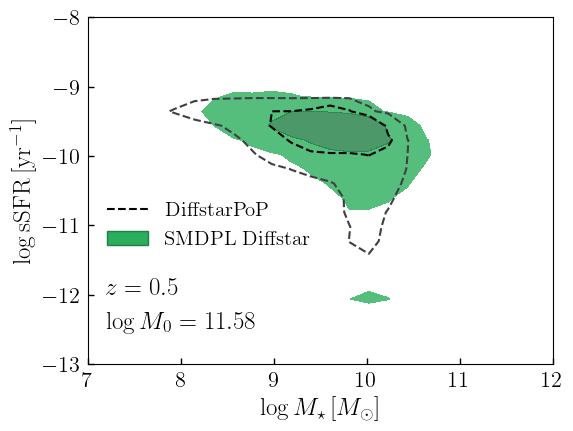

243996
time i 27.43055009841919
11.60909090909091 0.4967190594981553
9.63
9.68


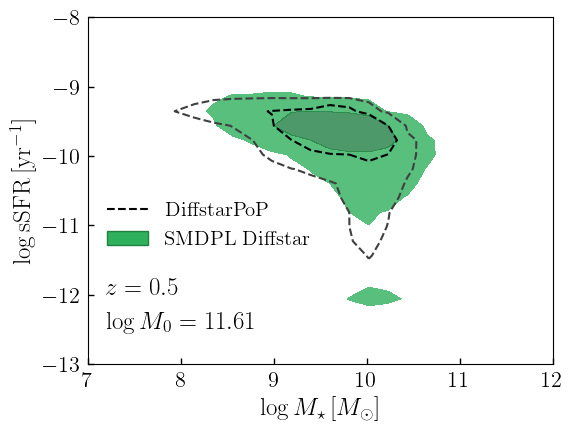

242995
time i 27.904250860214233
11.636363636363637 0.4967190594981553
9.68
9.73


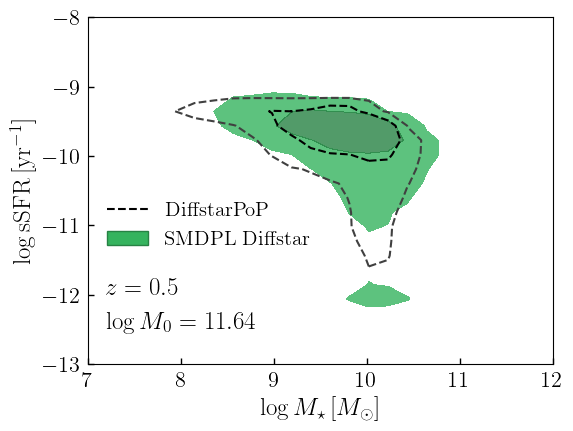

241799
time i 28.516875982284546
11.663636363636364 0.4967190594981553
9.75
9.79


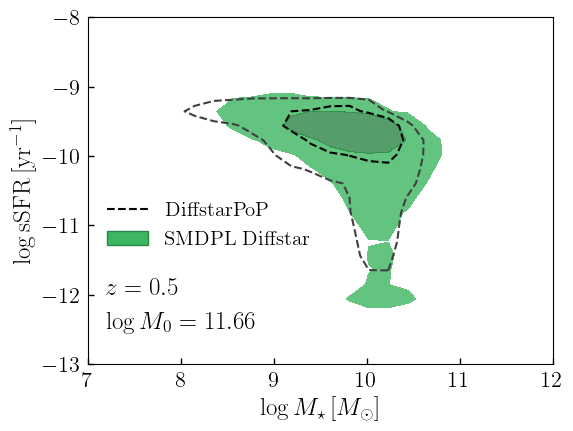

241074
time i 29.125205993652344
11.690909090909091 0.4967190594981553
9.8
9.84


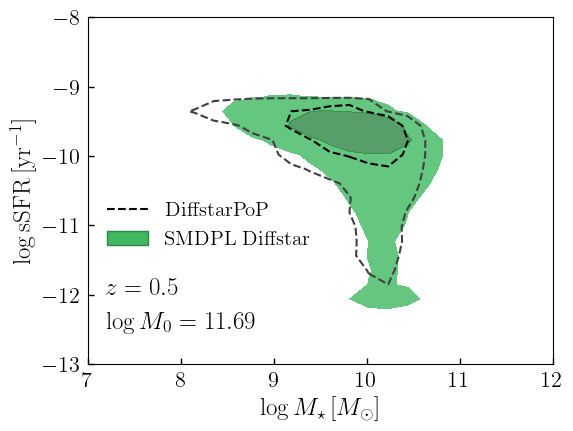

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


239937
time i 29.269515991210938
11.718181818181819 0.4967190594981553
9.85
9.89


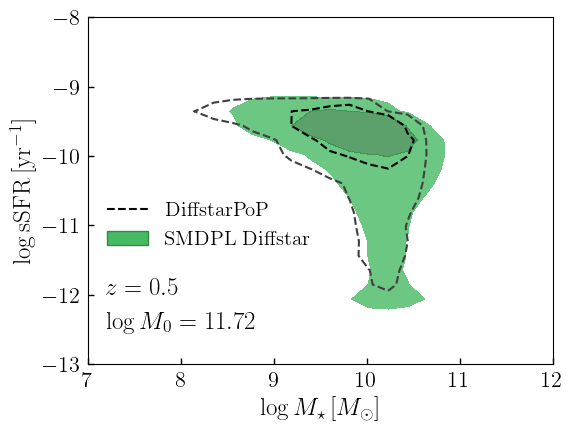

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


238517
time i 30.88779091835022
11.745454545454546 0.4967190594981553
9.91
9.94


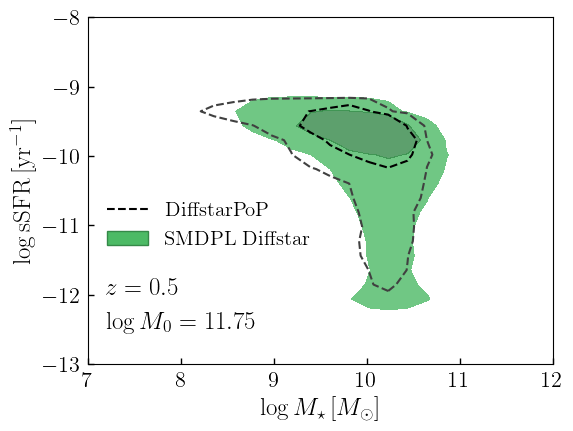

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


237400
time i 29.00129795074463
11.772727272727273 0.4967190594981553
9.94
9.99


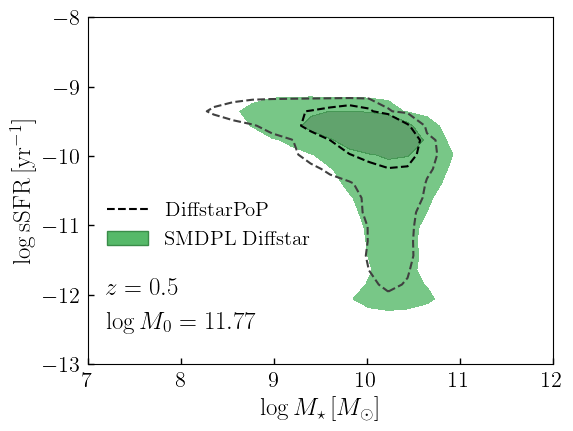

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


236236
time i 28.593024969100952
11.8 0.4967190594981553
10.01
10.04


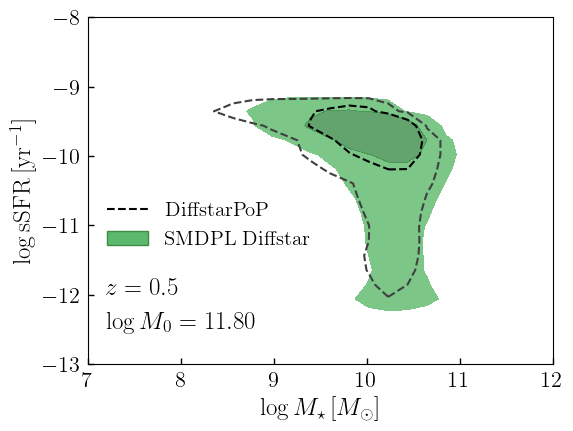

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


235239
time i 28.400485038757324
11.827272727272728 0.4967190594981553
10.04
10.09


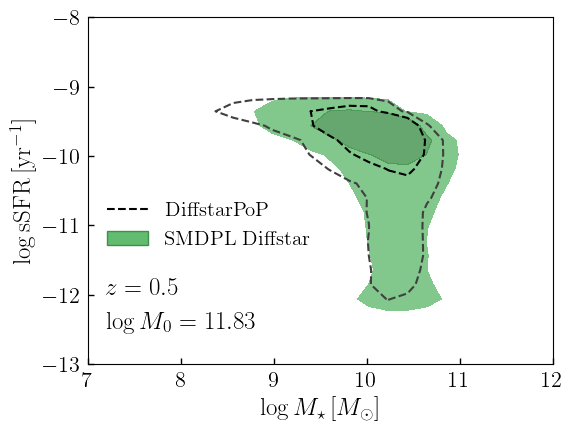

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


234030
time i 28.24155330657959
11.854545454545454 0.4967190594981553
10.09
10.13


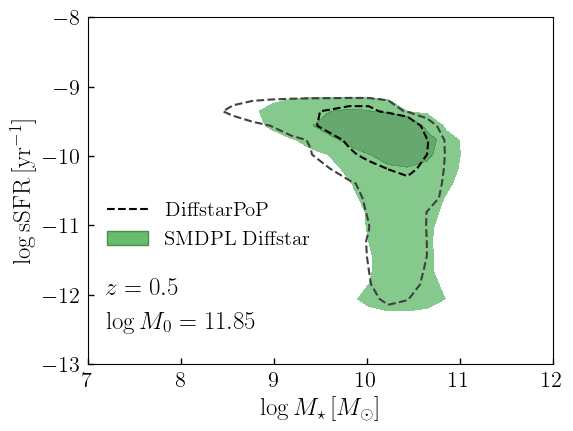

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


232869
time i 29.585471868515015
11.881818181818181 0.4967190594981553
10.14
10.18


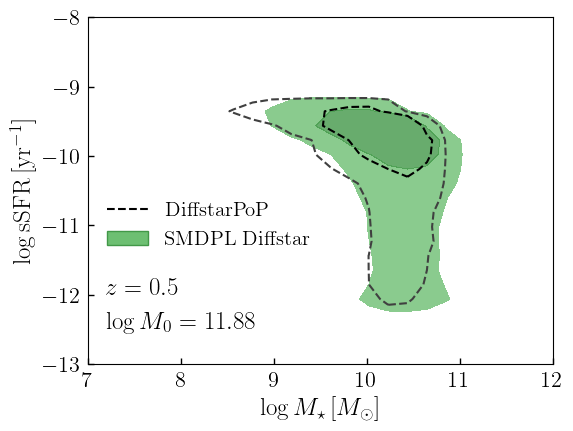

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


232007
time i 27.576611042022705
11.909090909090908 0.4967190594981553
10.18
10.22


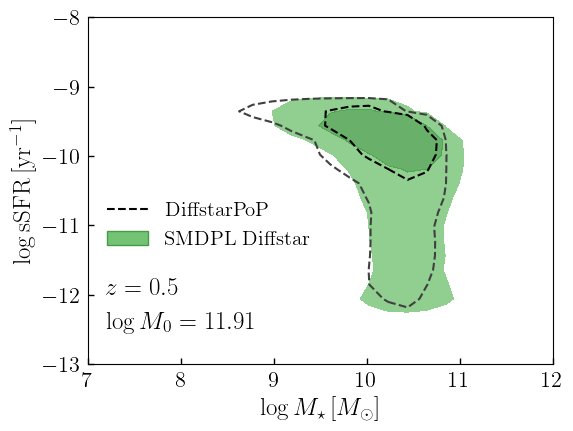

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


229517
time i 27.580232858657837
11.936363636363636 0.4967190594981553
10.22
10.26


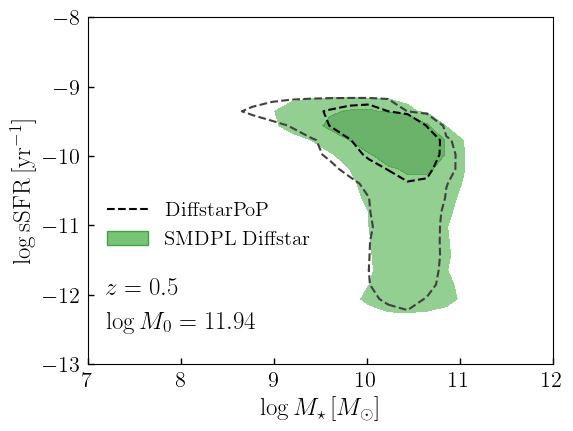

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


225577
time i 27.165753841400146
11.963636363636363 0.4967190594981553
10.26
10.3


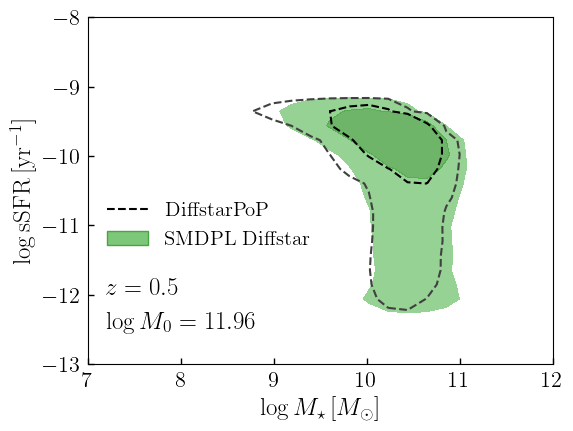

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


220379
time i 26.686929941177368
11.99090909090909 0.4967190594981553
10.29
10.33


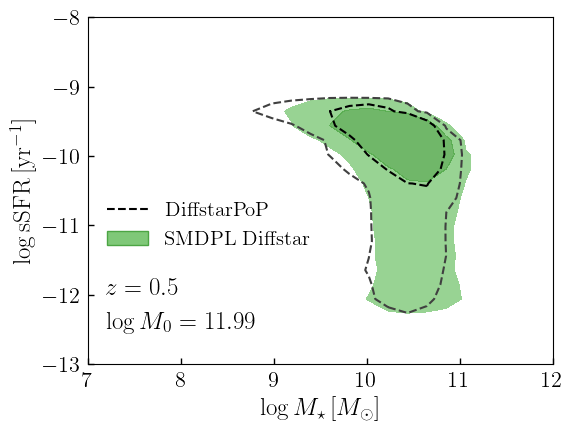

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


213561
time i 25.98251509666443
12.018181818181818 0.4967190594981553
10.33
10.37


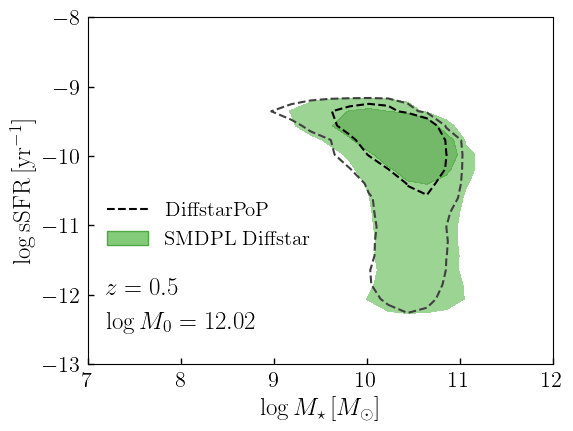

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


206205
time i 25.739506006240845
12.045454545454545 0.4967190594981553
10.36
10.4


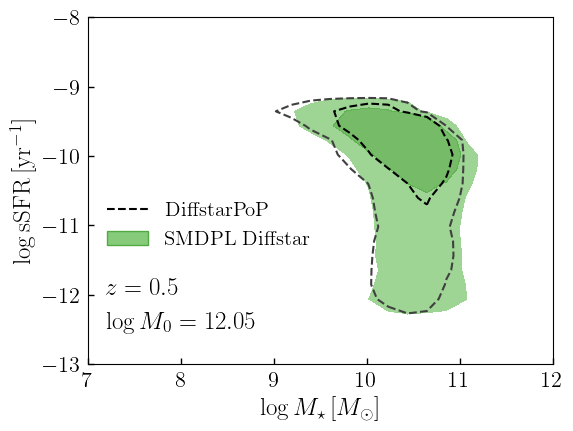

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


197192
time i 24.668416023254395
12.072727272727272 0.4967190594981553
10.4
10.43


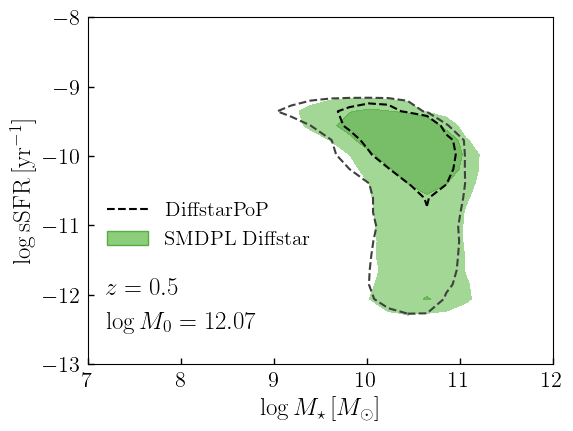

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


187239
time i 24.35305619239807
12.1 0.4967190594981553
10.43
10.46


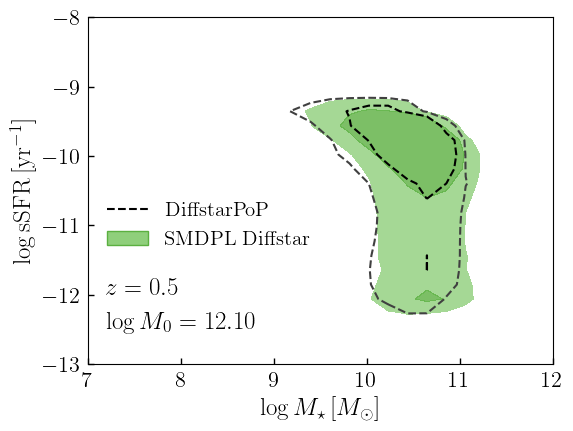

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


176799
time i 23.72836399078369
12.127272727272727 0.4967190594981553
10.46
10.49


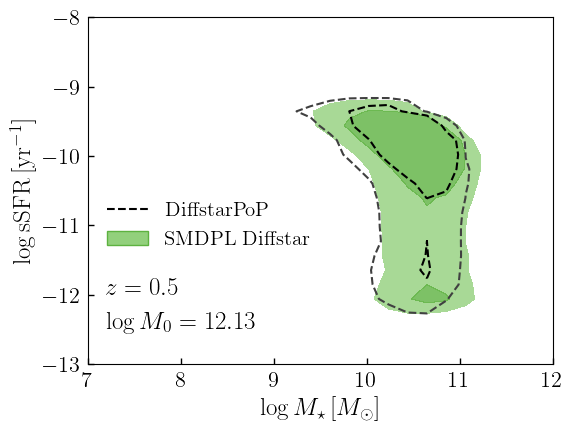

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


167198
time i 21.907057285308838
12.154545454545454 0.4967190594981553
10.49
10.52


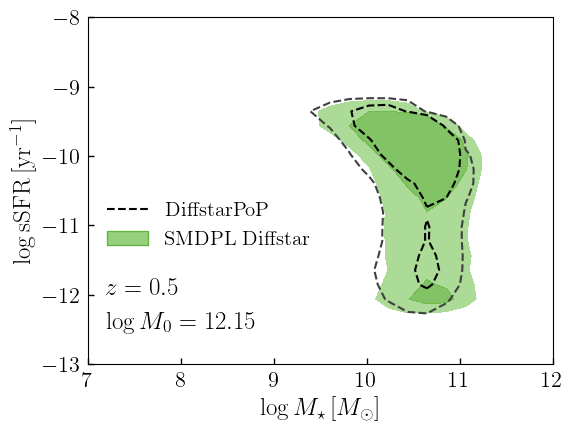

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


157971
time i 21.979671716690063
12.181818181818182 0.4967190594981553
10.51
10.55


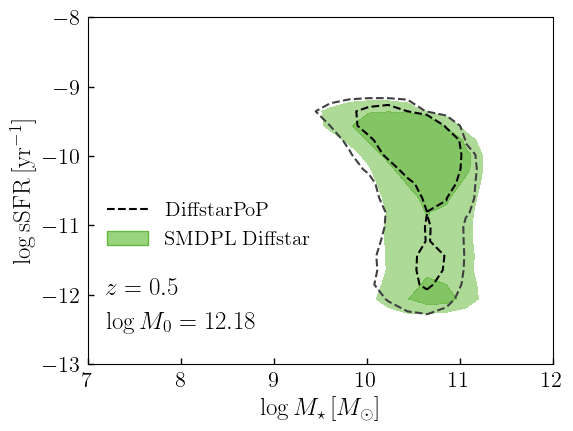

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


149075
time i 20.53495693206787
12.209090909090909 0.4967190594981553
10.54
10.57


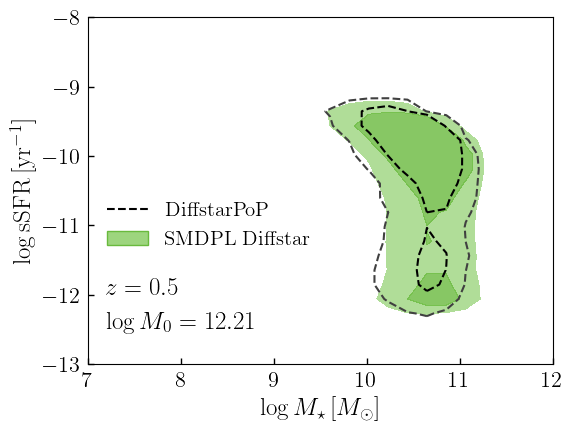

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


140804
time i 20.264793157577515
12.236363636363636 0.4967190594981553
10.56
10.6


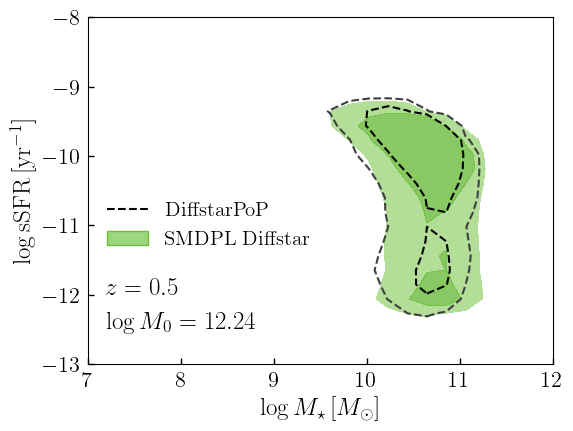

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


132886
time i 19.26204013824463
12.263636363636364 0.4967190594981553
10.59
10.62


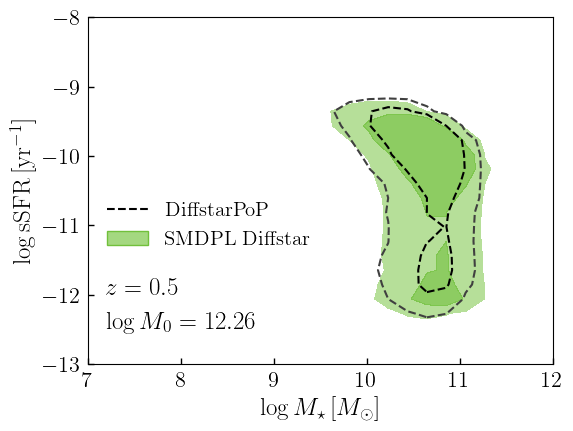

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


125390
time i 18.575238943099976
12.290909090909091 0.4967190594981553
10.61
10.64


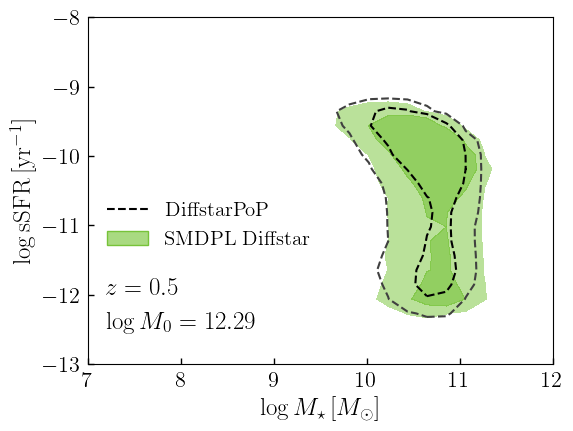

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


118333
time i 17.72157311439514
12.318181818181818 0.4967190594981553
10.63
10.66


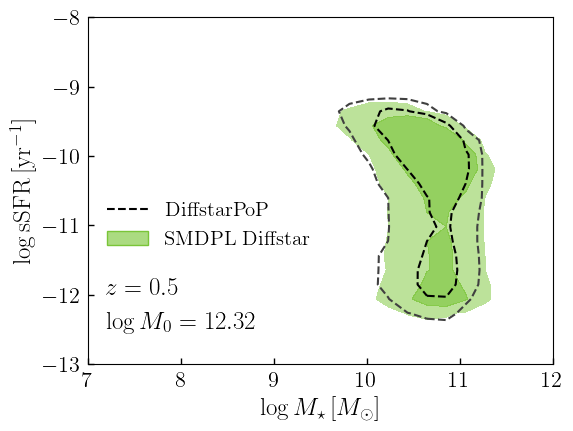

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


111714
time i 17.07081699371338
12.345454545454546 0.4967190594981553
10.65
10.68


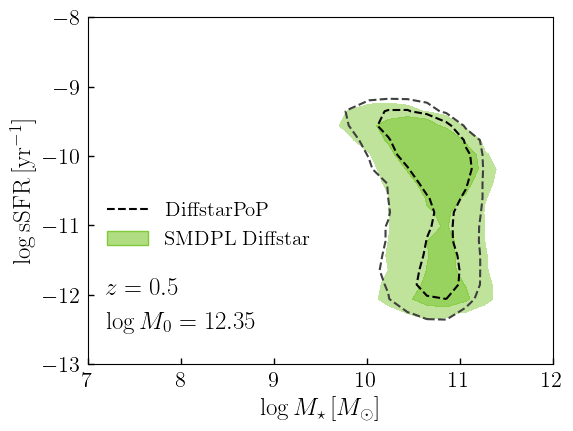

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


105272
time i 21.492688179016113
12.372727272727273 0.4967190594981553
10.68
10.7


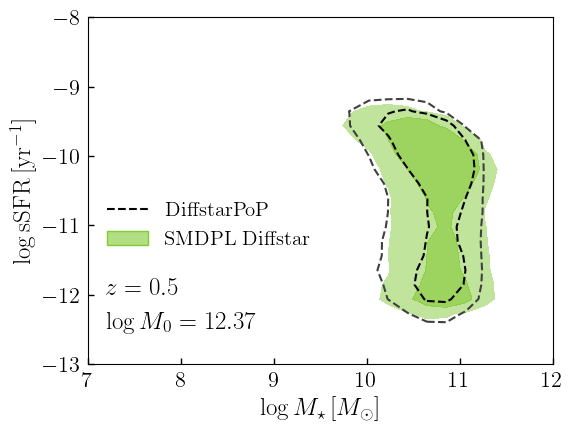

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


99362
time i 19.938755989074707
12.4 0.4967190594981553
10.69
10.72


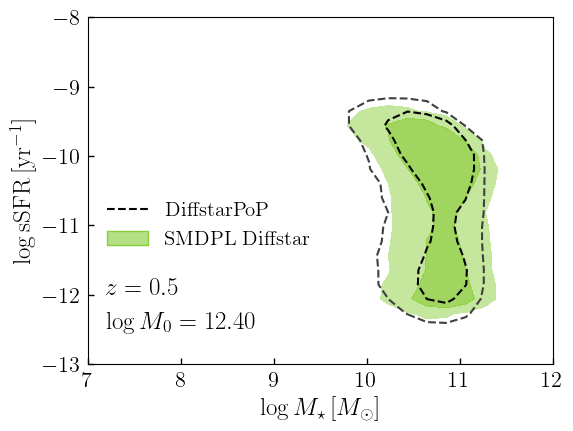

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


93895
time i 377.7133378982544
12.427272727272728 0.4967190594981553
10.71
10.74


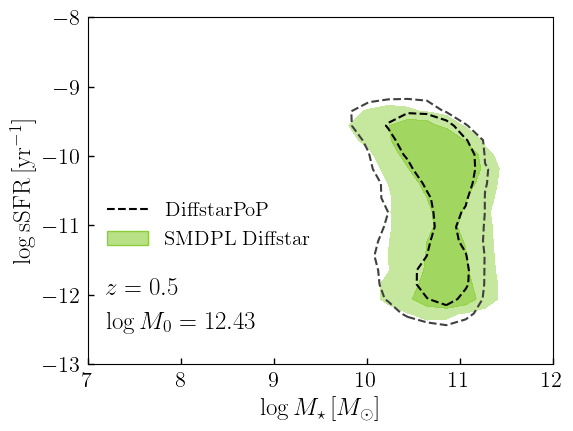

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


88600
time i 1467.209797859192
12.454545454545455 0.4967190594981553
10.73
10.75


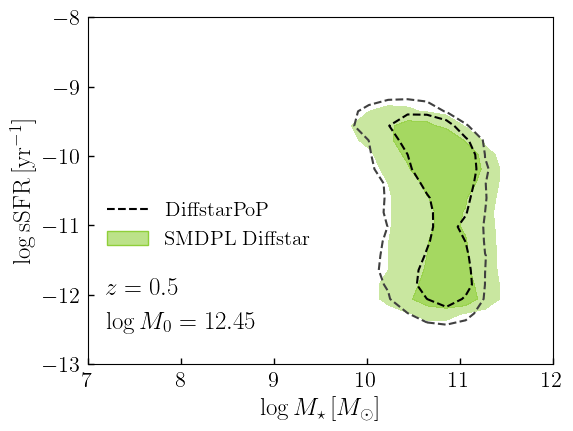

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


83526
time i 28.994295835494995
12.48181818181818 0.4967190594981553
10.74
10.77


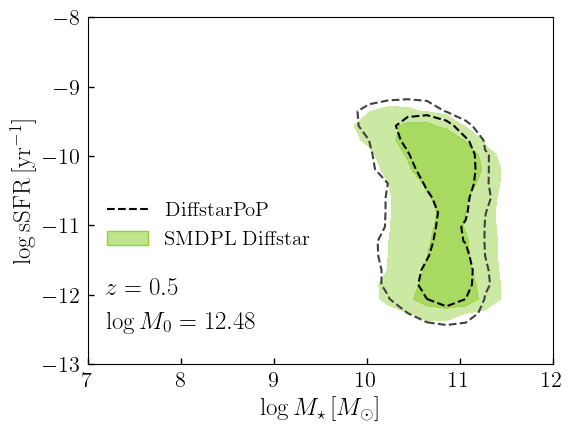

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


78830
time i 15.33992600440979
12.509090909090908 0.4967190594981553
10.76
10.78


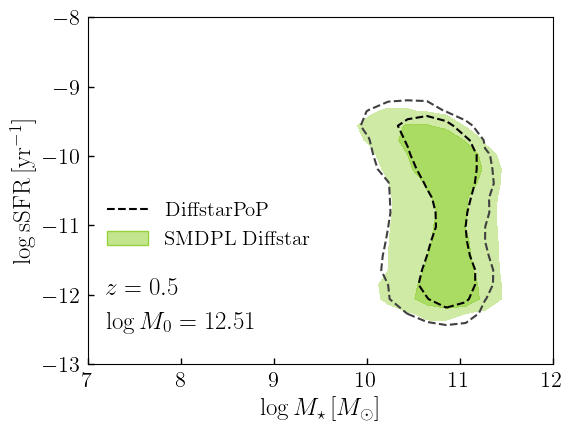

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


74237
time i 14.640116930007935
12.536363636363635 0.4967190594981553
10.77
10.8


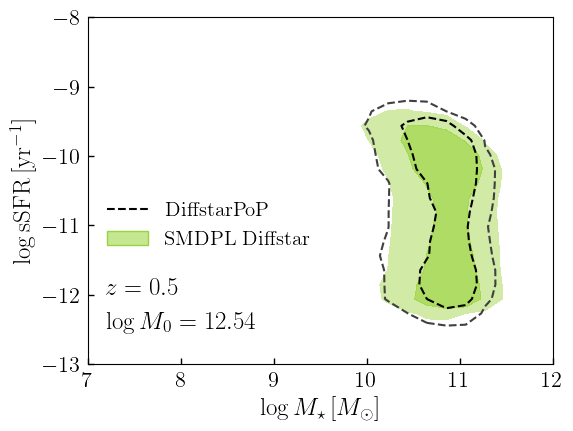

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


70112
time i 13.974188089370728
12.563636363636363 0.4967190594981553
10.79
10.81


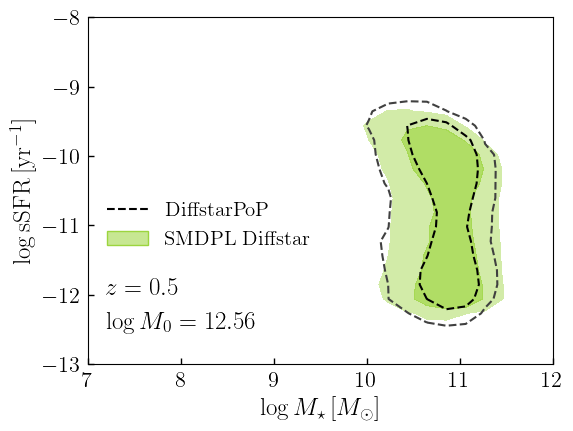

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


66174
time i 13.176105976104736
12.59090909090909 0.4967190594981553
10.8
10.82


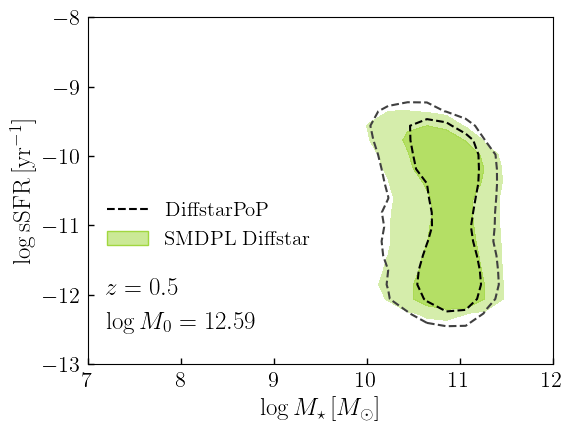

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


62596
time i 14.270331144332886
12.618181818181817 0.4967190594981553
10.81
10.83


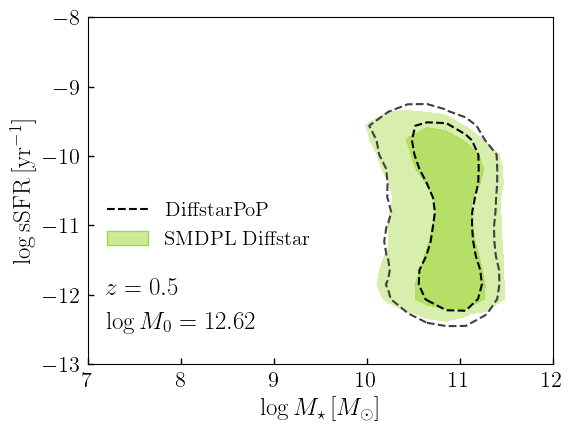

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


59032
time i 13.747523784637451
12.645454545454545 0.4967190594981553
10.83
10.84


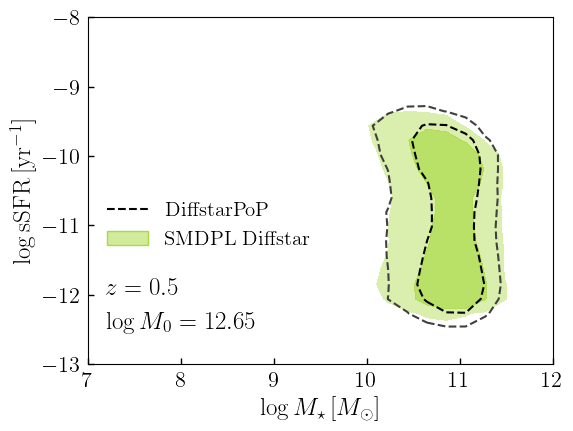

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


55628
time i 14.068727254867554
12.672727272727272 0.4967190594981553
10.83
10.84


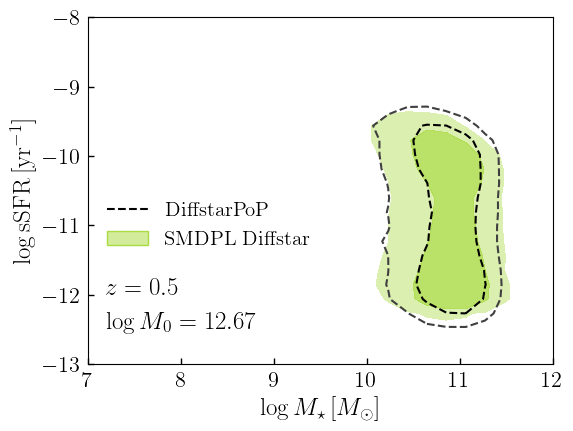

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


52332
time i 13.937047004699707
12.7 0.4967190594981553
10.84
10.85


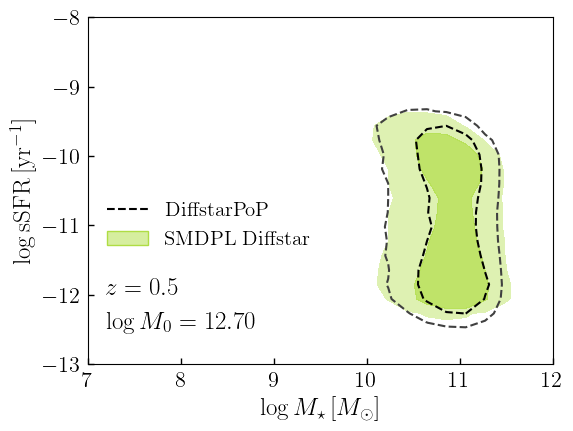

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


49442
time i 12.267798900604248
12.727272727272727 0.4967190594981553
10.85
10.86


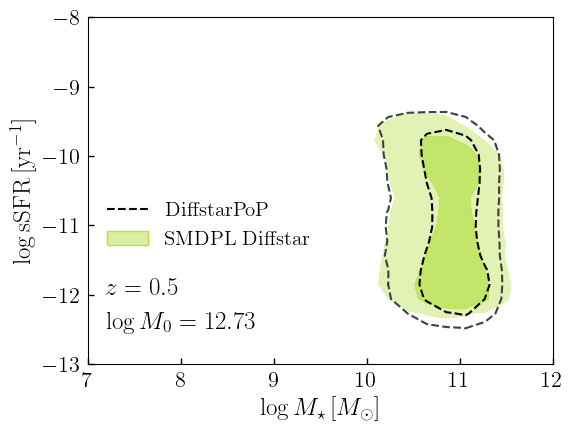

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


46551
time i 11.231593132019043
12.754545454545454 0.4967190594981553
10.86
10.86


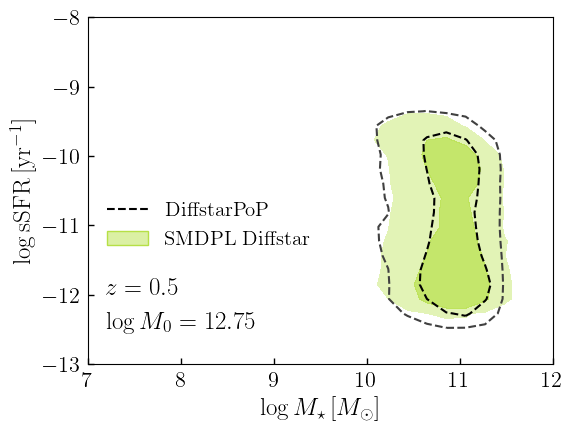

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


43661
time i 10.991616010665894
12.781818181818181 0.4967190594981553
10.87
10.87


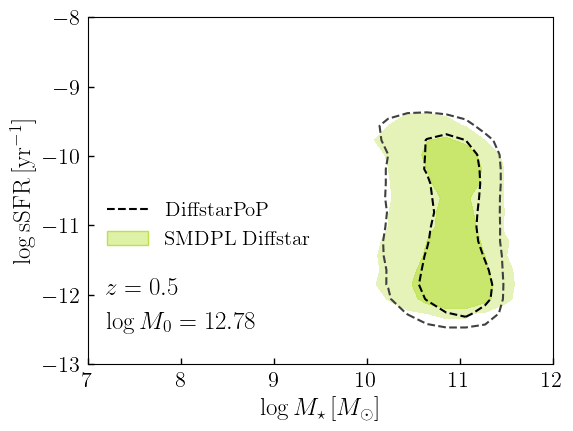

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


41120
time i 10.797346830368042
12.809090909090909 0.4967190594981553
10.87
10.87


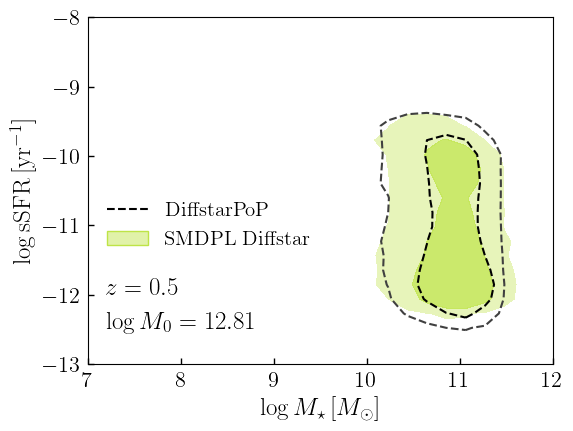

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


38724
time i 10.80141282081604
12.836363636363636 0.4967190594981553
10.88
10.88


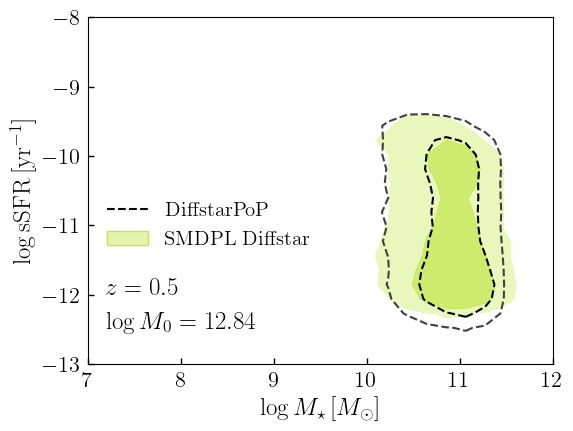

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


36427
time i 10.275903940200806
12.863636363636363 0.4967190594981553
10.88
10.88


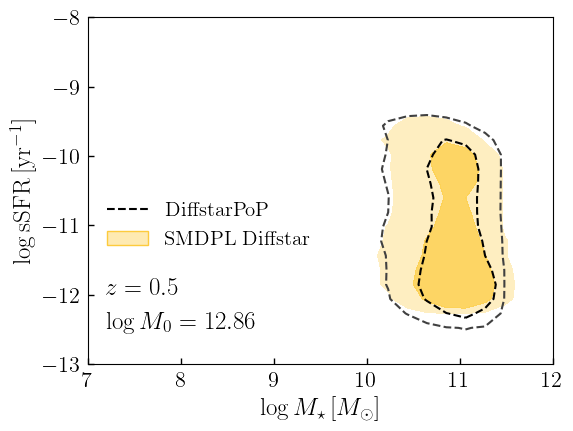

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


34247
time i 9.975003957748413
12.89090909090909 0.4967190594981553
10.89
10.88


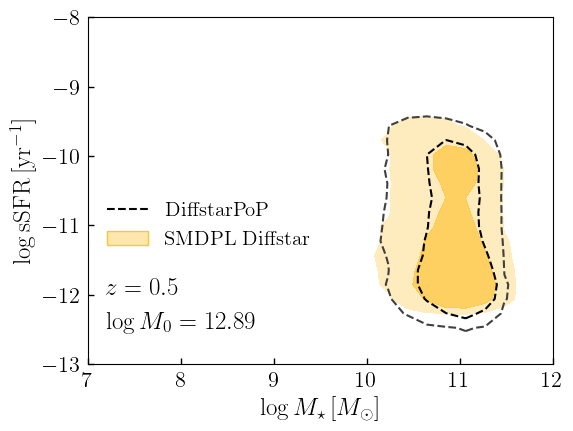

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


32417
time i 9.681330919265747
12.918181818181818 0.4967190594981553
10.89
10.88


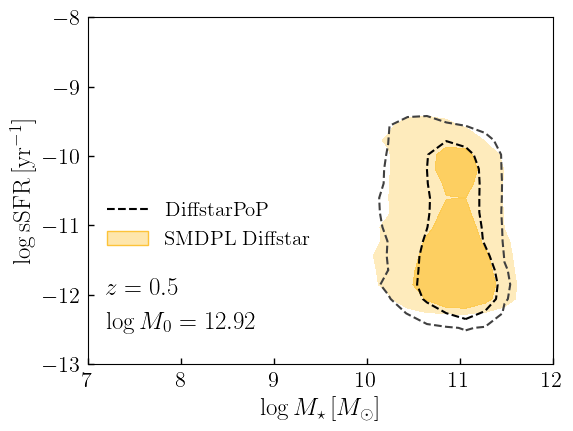

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


30552
time i 9.501320123672485
12.945454545454545 0.4967190594981553
10.89
10.88


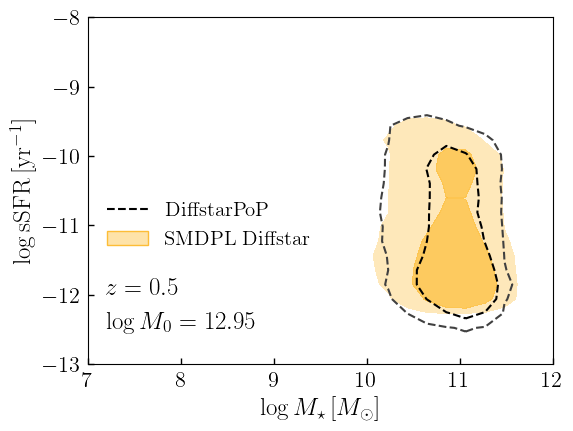

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


28826
time i 9.390403032302856
12.972727272727273 0.4967190594981553
10.9
10.89


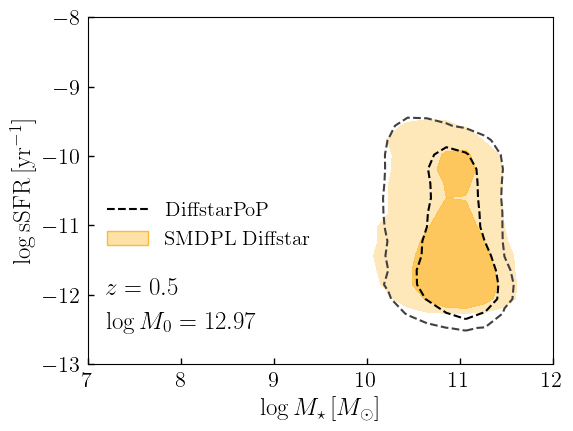

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


27108
time i 8.36350703239441
13.0 0.4967190594981553
10.9
10.89


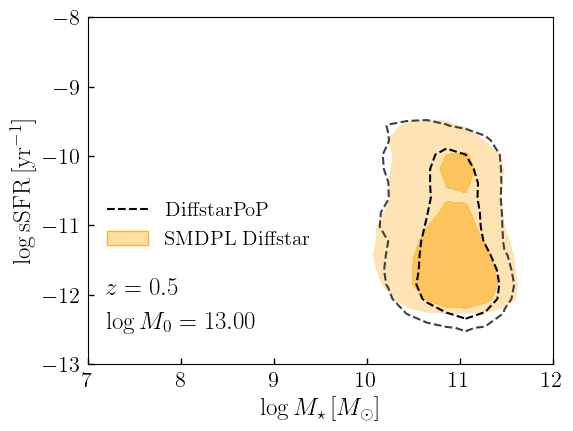

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


25560
time i 9.202373266220093
13.027272727272727 0.4967190594981553
10.9
10.89


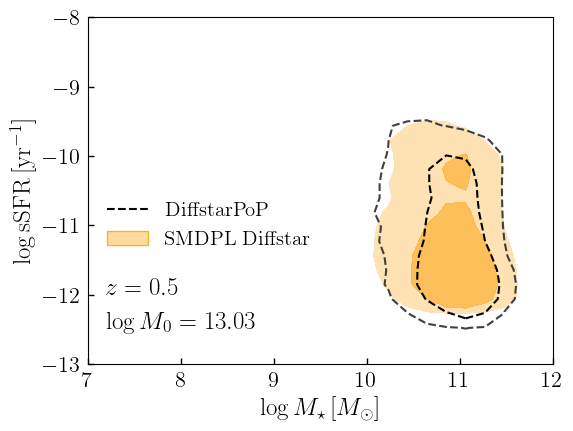

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


24055
time i 9.215288877487183
13.054545454545455 0.4967190594981553
10.9
10.89


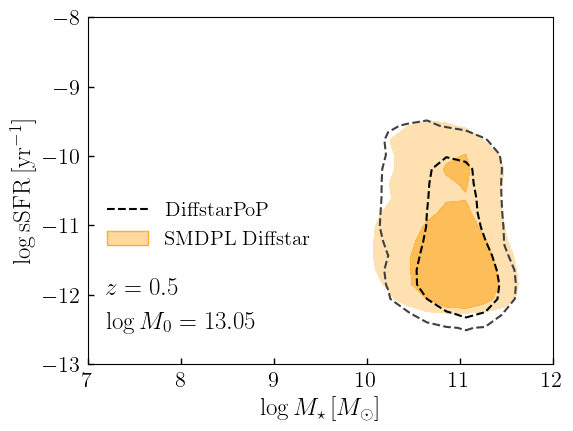

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


22689
time i 9.589709758758545
13.081818181818182 0.4967190594981553
10.9
10.89


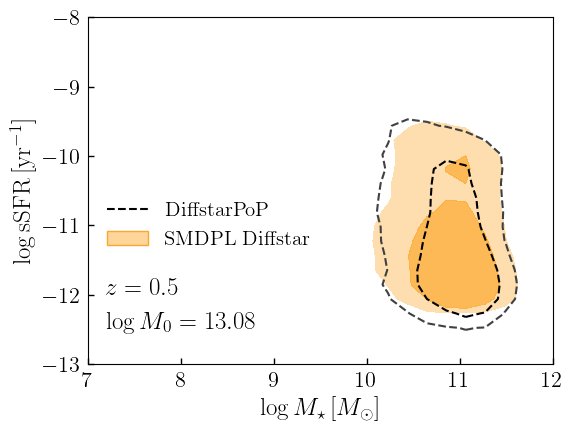

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


21194
time i 9.294506072998047
13.10909090909091 0.4967190594981553
10.9
10.89


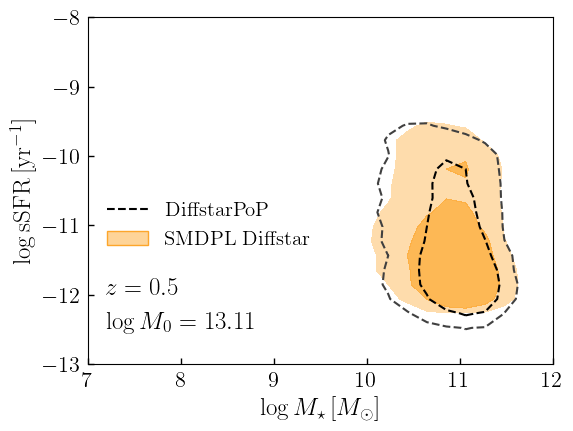

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


19899
time i 9.093945264816284
13.136363636363637 0.4967190594981553
10.9
10.88


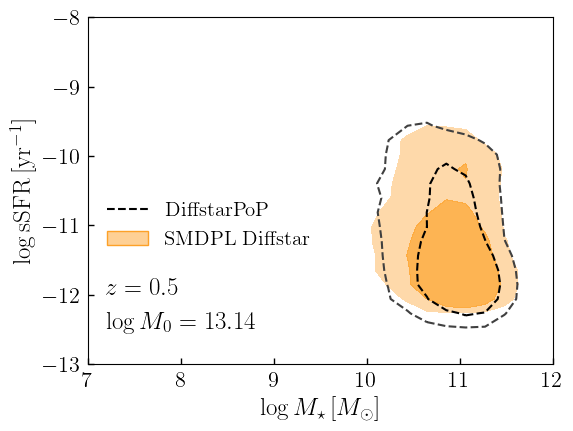

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


18688
time i 11.30082368850708
13.163636363636364 0.4967190594981553
10.9
10.88


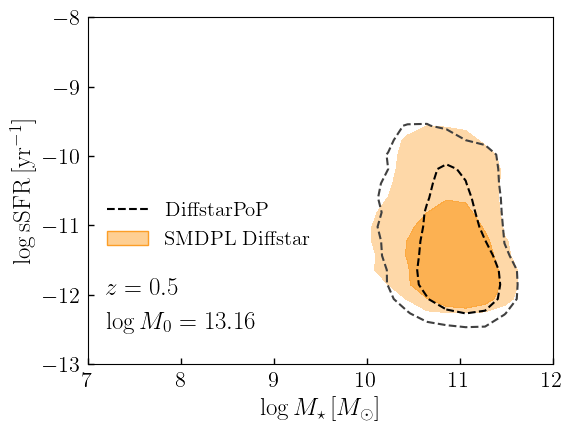

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


17459
time i 8.807817935943604
13.190909090909091 0.4967190594981553
10.9
10.88


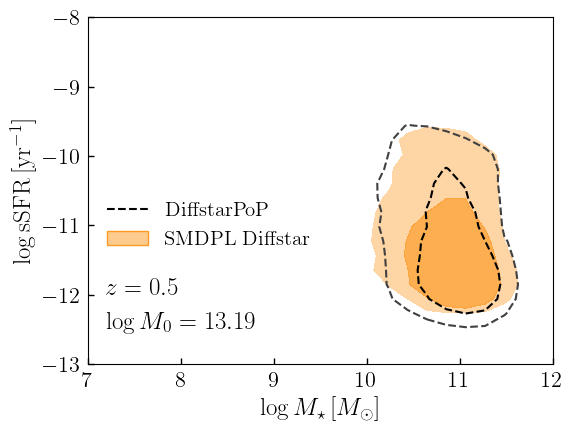

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


16248
time i 8.798249959945679
13.218181818181817 0.4967190594981553
10.9
10.88


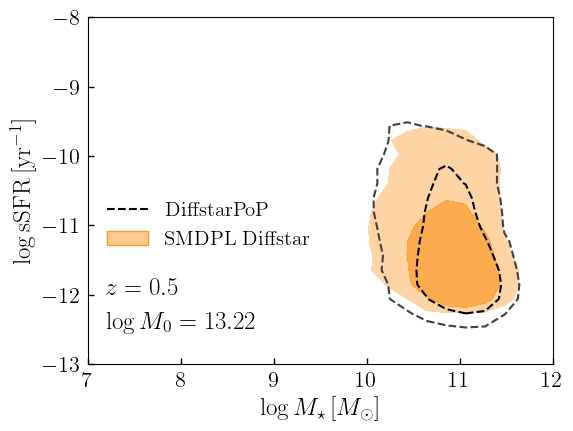

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


15312
time i 8.747971057891846
13.245454545454544 0.4967190594981553
10.89
10.87


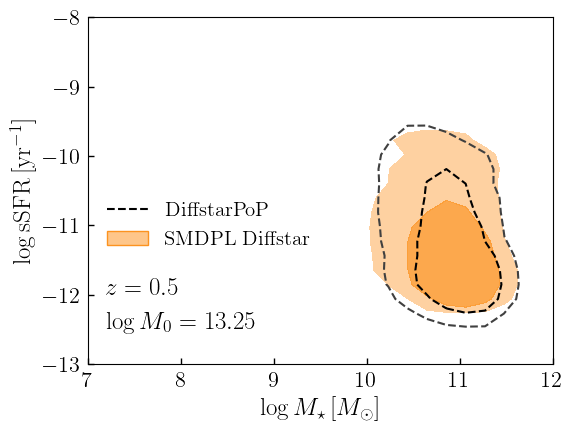

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


14395
time i 8.63929009437561
13.272727272727272 0.4967190594981553
10.89
10.87


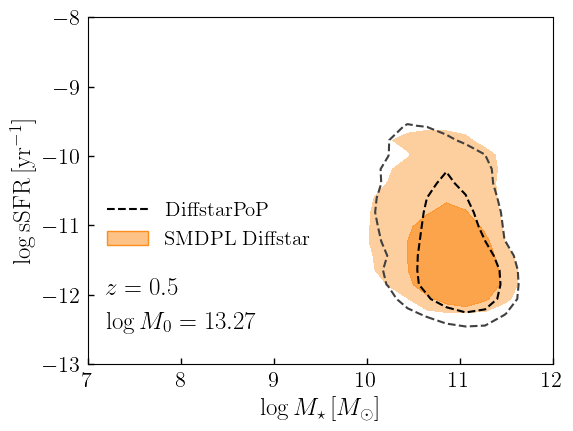

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


13598
time i 8.562772035598755
13.299999999999999 0.4967190594981553
10.89
10.87


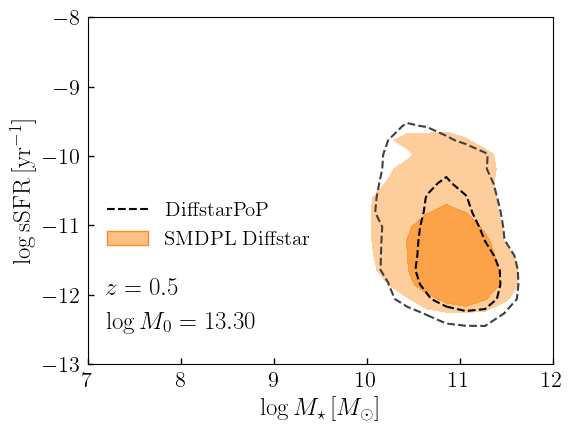

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


12790
time i 9.320974111557007
13.327272727272726 0.4967190594981553
10.89
10.87


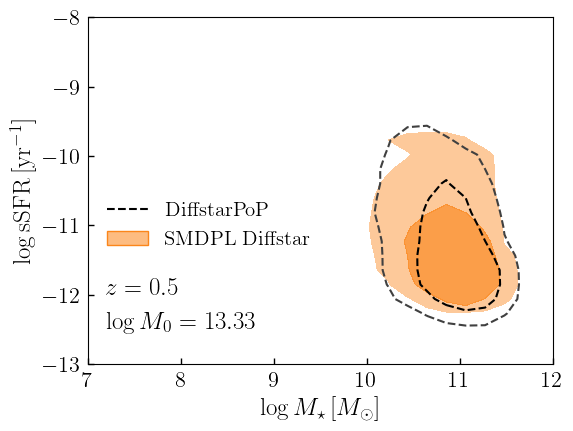

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


11957
time i 9.083526849746704
13.354545454545454 0.4967190594981553
10.89
10.87


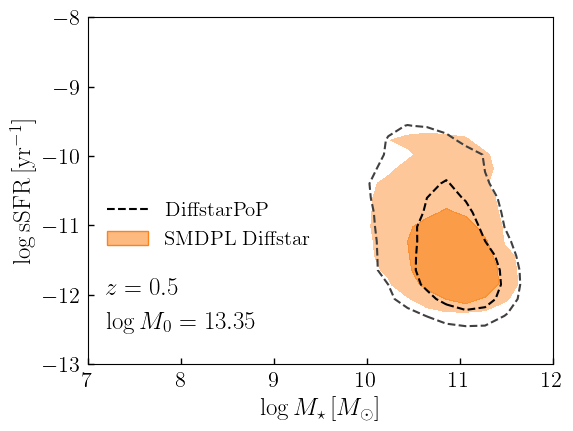

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


11271
time i 8.839307069778442
13.381818181818181 0.4967190594981553
10.88
10.86


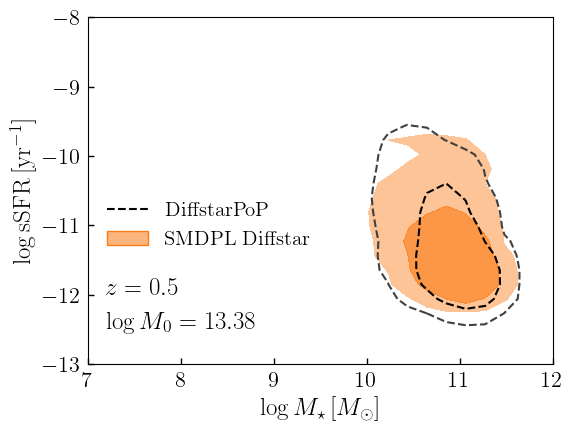

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


10558
time i 8.803560972213745
13.409090909090908 0.4967190594981553
10.88
10.86


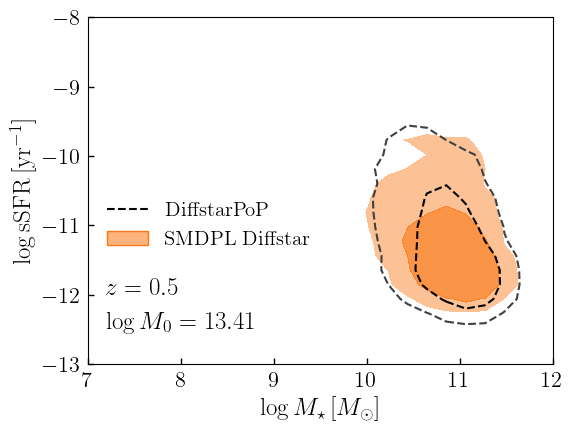

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


9841
time i 8.5693519115448
13.436363636363636 0.4967190594981553
10.87
10.86


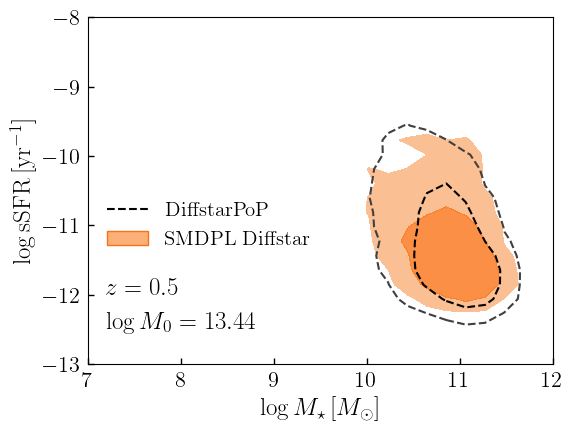

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


9226
time i 8.68150281906128
13.463636363636363 0.4967190594981553
10.87
10.85


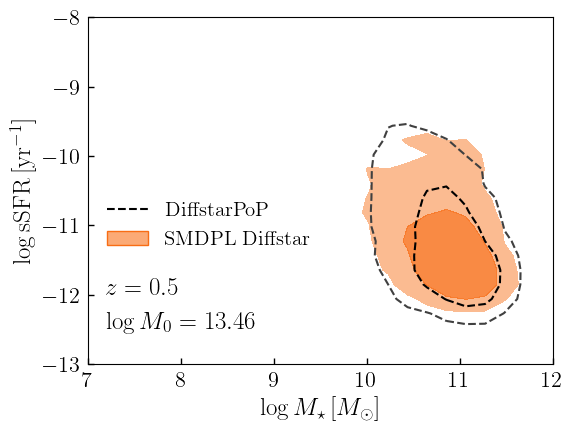

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


8641
time i 8.595919847488403
13.49090909090909 0.4967190594981553
10.87
10.85


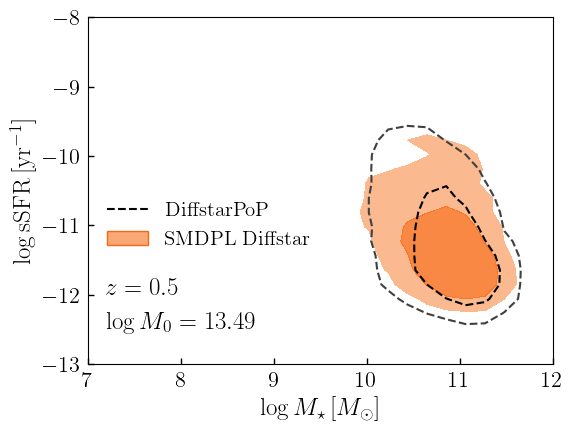

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


8103
time i 8.434187173843384
13.518181818181818 0.4967190594981553
10.86
10.84


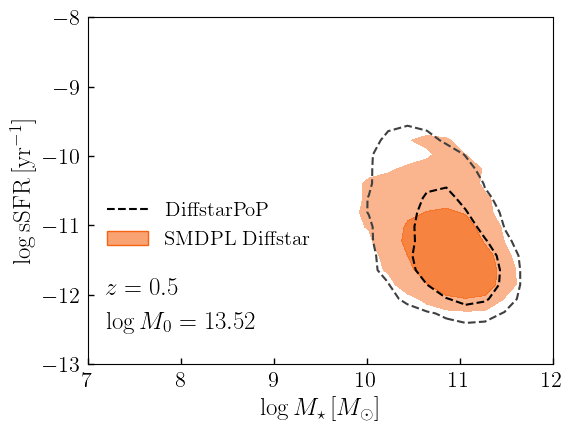

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


7539
time i 8.457820177078247
13.545454545454545 0.4967190594981553
10.86
10.84


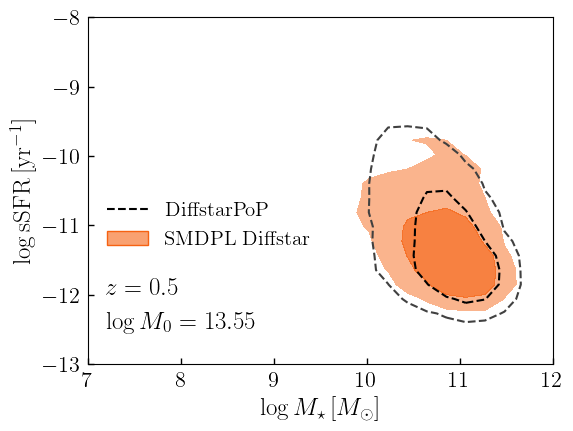

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


7019
time i 8.385716199874878
13.572727272727272 0.4967190594981553
10.85
10.84


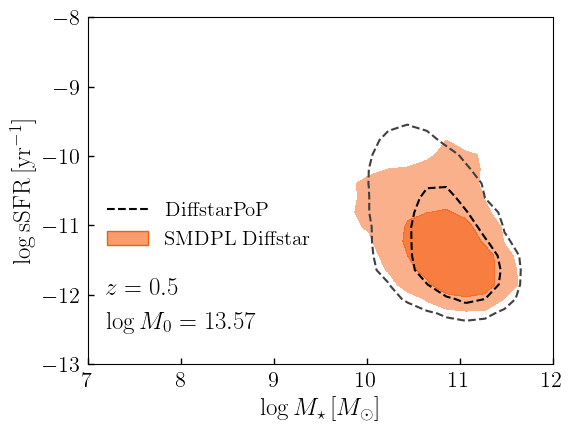

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


6560
time i 8.355783939361572
13.6 0.4967190594981553
10.85
10.84


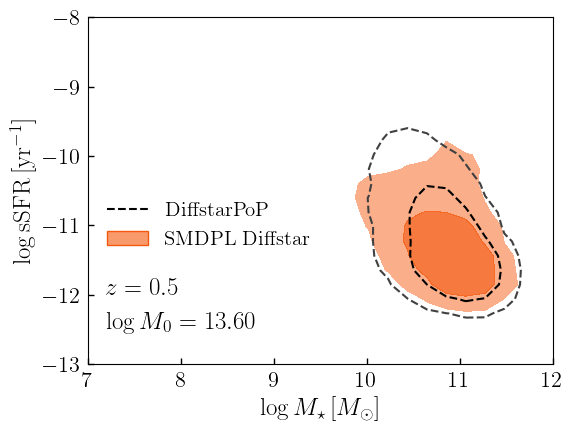

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


6131
time i 8.3385910987854
13.627272727272727 0.4967190594981553
10.85
10.83


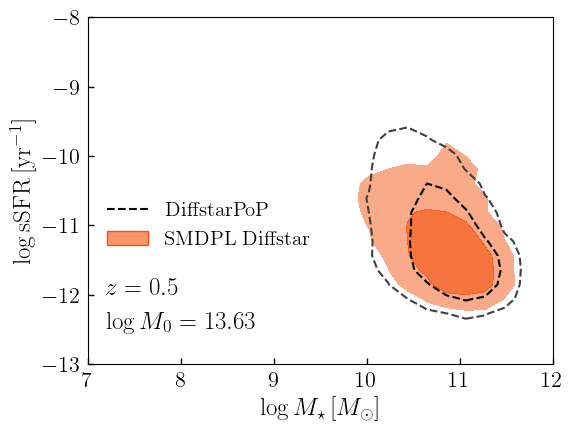

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


5698
time i 8.390275001525879
13.654545454545454 0.4967190594981553
10.84
10.83


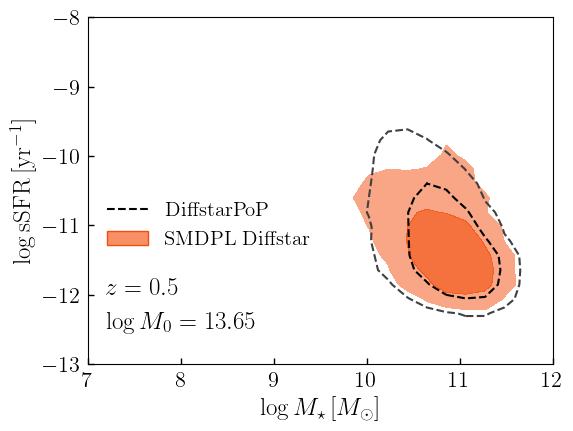

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


5313
time i 8.305892944335938
13.681818181818182 0.4967190594981553
10.84
10.83


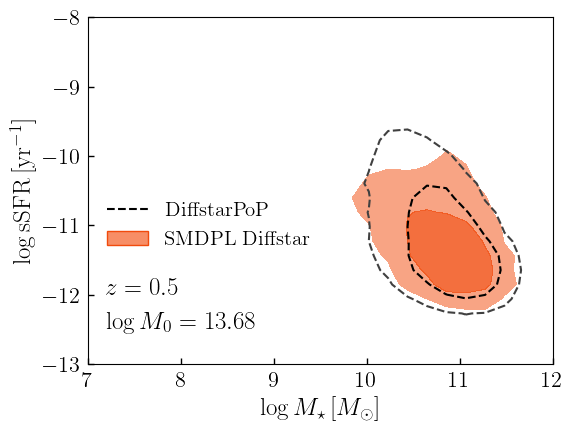

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


4966
time i 8.47088098526001
13.709090909090909 0.4967190594981553
10.83
10.82


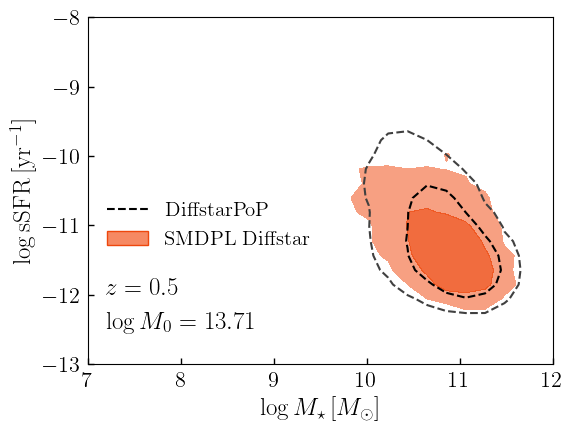

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


4615
time i 8.286878108978271
13.736363636363636 0.4967190594981553
10.82
10.82


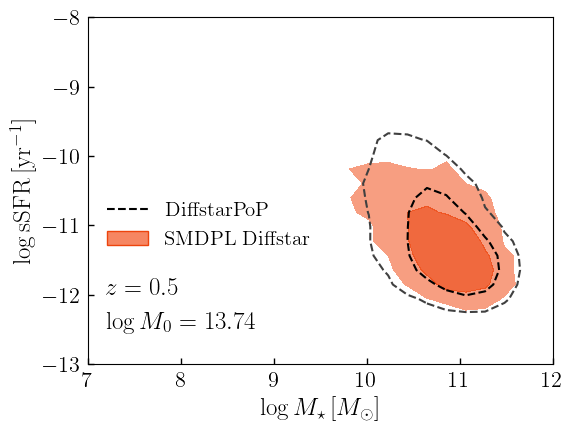

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


4329
time i 8.259411096572876
13.763636363636362 0.4967190594981553
10.82
10.82


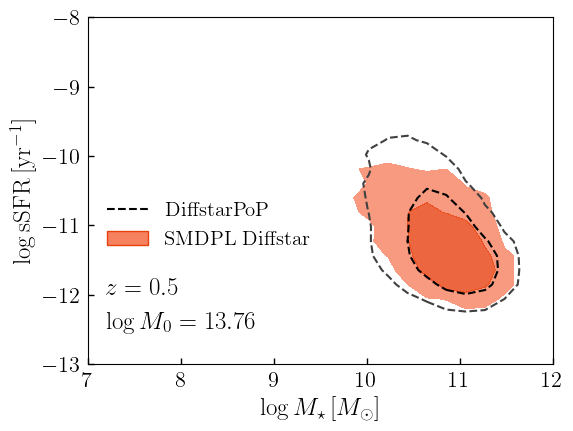

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


4033
time i 8.325945138931274
13.79090909090909 0.4967190594981553
10.81
10.81


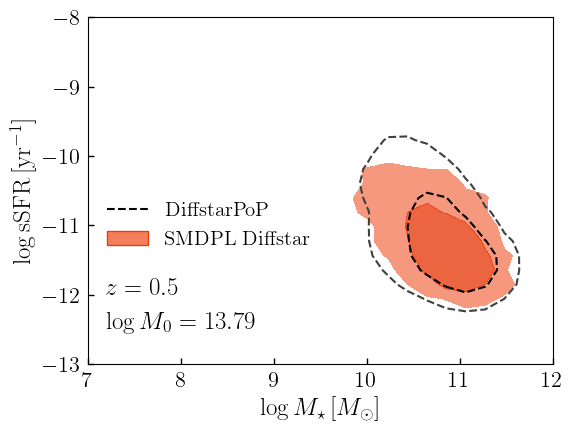

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


3769
time i 8.774845838546753
13.818181818181817 0.4967190594981553
10.81
10.81


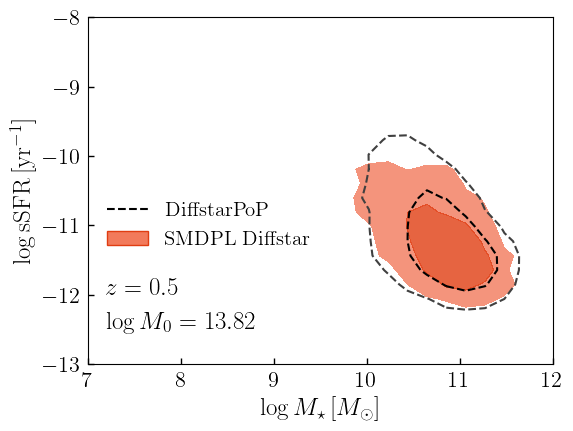

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


3556
time i 8.386841058731079
13.845454545454544 0.4967190594981553
10.81
10.81


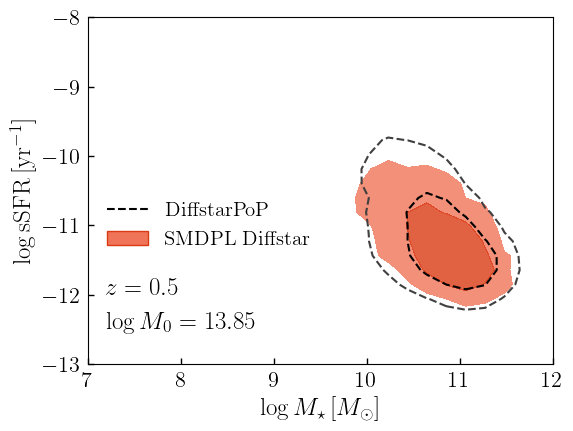

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


3282
time i 8.520577907562256
13.872727272727271 0.4967190594981553
10.8
10.81


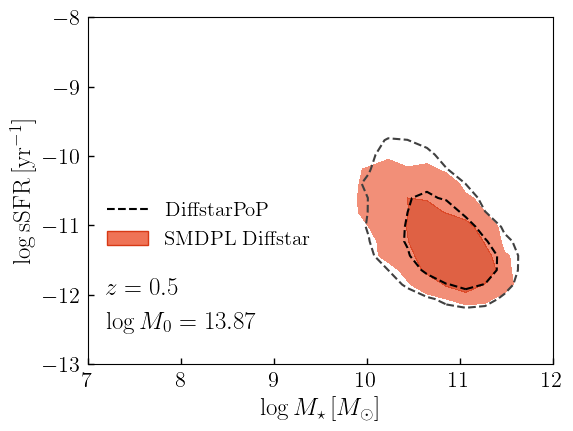

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


3069
time i 8.364505052566528
13.899999999999999 0.4967190594981553
10.8
10.81


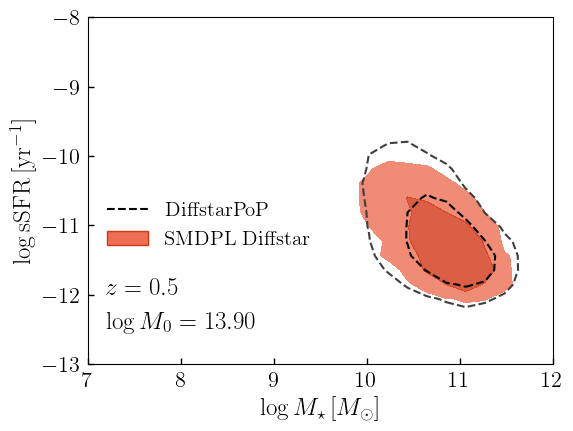

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


2832
time i 8.374573945999146
13.927272727272726 0.4967190594981553
10.79
10.81


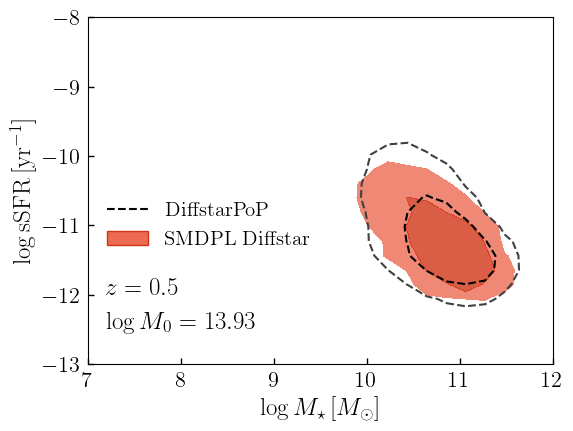

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


2616
time i 8.405900001525879
13.954545454545453 0.4967190594981553
10.79
10.81


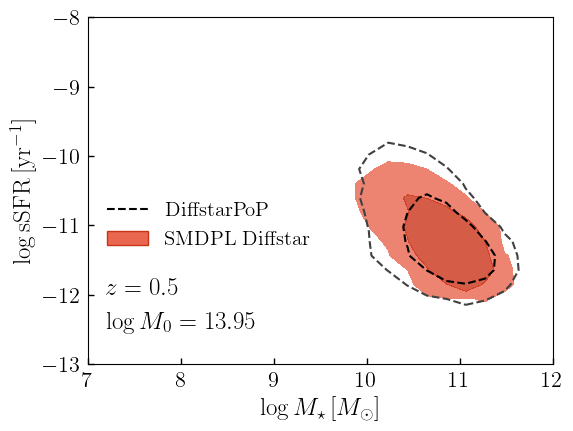

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


2450
time i 8.356514930725098
13.98181818181818 0.4967190594981553
10.78
10.8


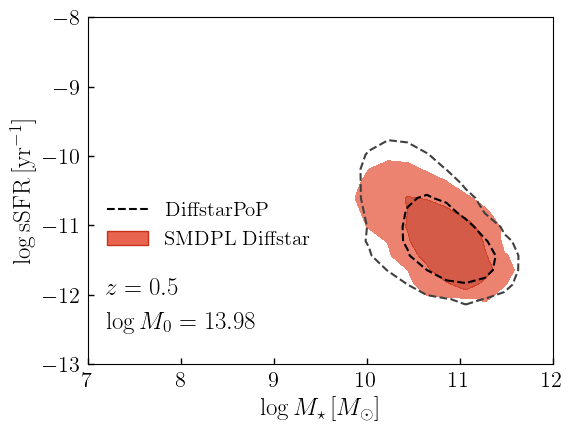

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


2254
time i 9.403683185577393
14.009090909090908 0.4967190594981553
10.78
10.81


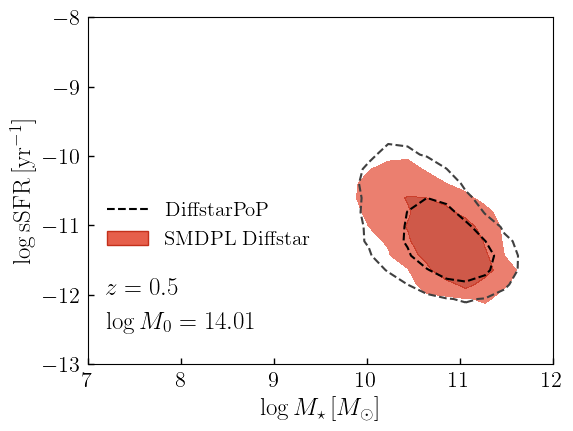

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


2077
time i 8.298131942749023
14.036363636363635 0.4967190594981553
10.77
10.8


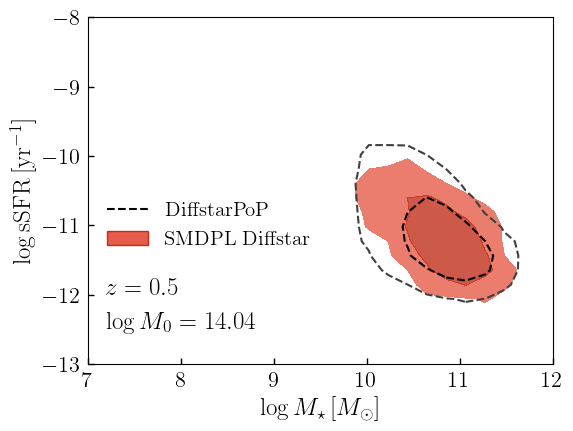

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


1909
time i 8.470455169677734
14.063636363636363 0.4967190594981553
10.76
10.79


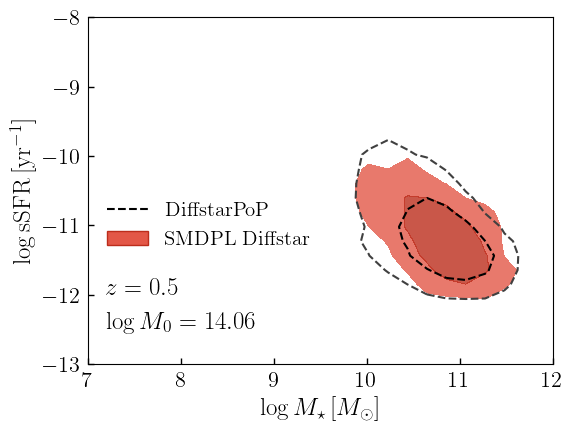

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


1738
time i 8.122871160507202
14.09090909090909 0.4967190594981553
10.76
10.78


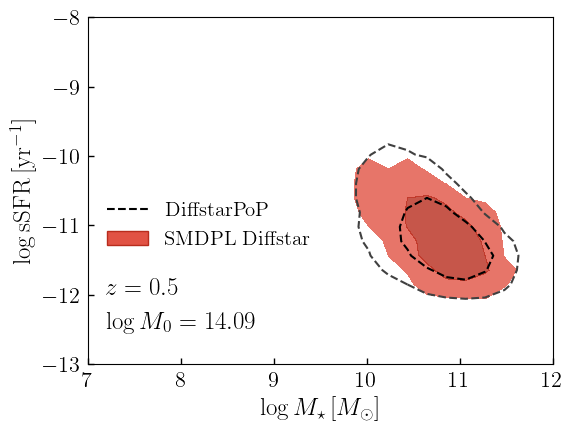

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


1618
time i 7.981555938720703
14.118181818181817 0.4967190594981553
10.75
10.78


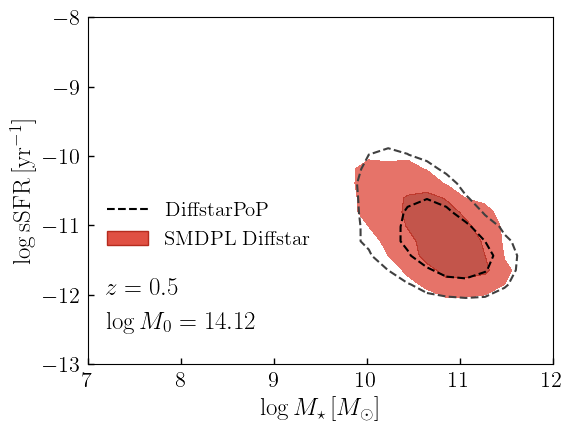

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


1472
time i 8.168057918548584
14.145454545454545 0.4967190594981553
10.75
10.77


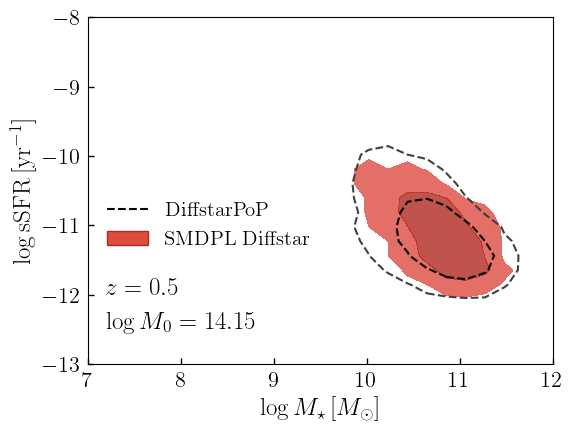

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


1336
time i 8.019454002380371
14.172727272727272 0.4967190594981553
10.74
10.77


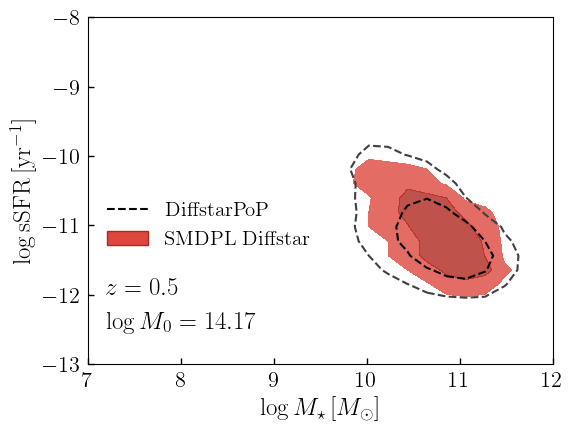

/Users/alarcon/anaconda3/anaconda3/envs/diffpop/lib/python3.9/site-packages/astropy/cosmology/flrw/base.py:1054: IntegrationWarning: Extremely bad integrand behavior occurs at some points of the
  integration interval.
  return quad(self._lookback_time_integrand_scalar, z, inf)[0]


1177
time i 8.049712896347046
14.2 0.4967190594981553
10.74
10.77


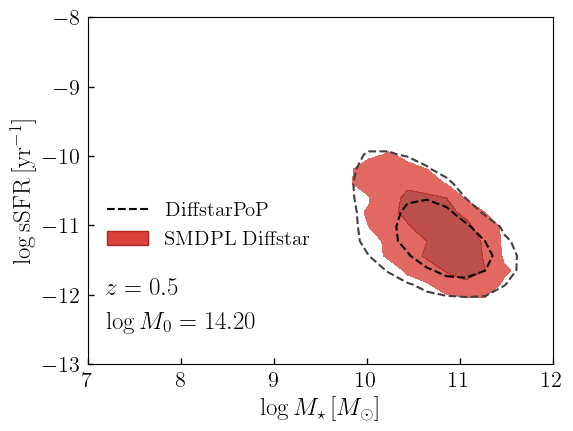

In [159]:
logm0_binmids = np.linspace(11.5, 14.2, 100)
logm0_bin_widths = np.ones_like(logm0_binmids) * 0.1


normal_values = (mah_params_arr[:, 4] < 4.5)
normal_values &= (mah_params_arr[:, 2] < 2.0)


colors = ["#0077BB", "#33BBEE", "#009988", "#EE7733", "#CC3311", "#EE3377", '#882255', '#AA4499']
colors_test = plt.get_cmap("Greys")(np.linspace(0.3,0.7, 3))
colors_greys = plt.get_cmap("Greys")(np.array([0.8, 1.0]))
n_histories = int(5e4)
ran_key = jran.PRNGKey(0)

nbins_x = np.linspace(7, 12, 25)
nbins_y = np.linspace(-13, -8.0, 25)
        
# nbins_x = bins_mstar.copy()
# nbins_y = bins_ssfr.copy()

Nhalos = int(1e4)

smooth = False
# for i, bin_id in enumerate(_bins):
for i, bin_id in enumerate(range(len(logm0_binmids))):

    t_table = np.linspace(1.0, TODAY, 100)
    lgt = jnp.log10(t_table)
    z_table = np.array([z_at_value(Planck13.age, x * u.Gyr, zmin=-1) for x in t_table])
    
    _sel = (logmpeak > logm0_binmids[i] - logm0_bin_widths[i]) & (logmpeak < logm0_binmids[i] + logm0_bin_widths[i])
    _sel &= normal_values
    print(_sel.sum())
    sel = np.random.choice(np.arange(len(p50_arr))[_sel], Nhalos, replace=True)
    _halo_data_MC = mah_params_arr[sel]
    _p50 = p50_arr[sel]

    t0 = time.time()
    histories = draw_sfh_MIX(
        t_table,
        logm0_binmids[bin_id],
        _halo_data_MC[:, np.array([1,2,4,5])],
        _p50,
        n_histories,
        ran_key,
        index_select,
        index_high,
        fstar_tdelay,
        #init_guess[0:N_PDF_Q],
        #init_guess[N_PDF_Q:N_PDF_Q+N_PDF_MS],
        #init_guess[N_PDF_Q+N_PDF_MS:N_PDF_Q+N_PDF_MS+N_R_Q],
        #init_guess[N_PDF_Q+N_PDF_MS+N_R_Q:N_PDF_Q+N_PDF_MS+N_R_Q+N_R_MS],
        outputs[0][0:N_PDF_Q],
        outputs[0][N_PDF_Q:N_PDF_Q+N_PDF_MS],
        outputs[0][N_PDF_Q+N_PDF_MS:N_PDF_Q+N_PDF_MS+N_R_Q],
        outputs[0][N_PDF_Q+N_PDF_MS+N_R_Q:N_PDF_Q+N_PDF_MS+N_R_Q+N_R_MS],
    )

    weights = histories[4].copy()
    _params = np.zeros((Nhalos, 6))
    _params[:, 0] = np.log10(TODAY)
    _params[:, 1:3] = _halo_data_MC[:, 0:2]
    _params[:, 3] = 3.5
    _params[:, 4:6] = _halo_data_MC[:, 2:4]

    mah_histories = _calc_halo_history_vmap(lgt, *_params.T)

    _mask = (logmpeak > logm0_binmids[bin_id] - logm0_bin_widths[bin_id]) 
    _mask &= (logmpeak < logm0_binmids[bin_id] + logm0_bin_widths[bin_id])
    mah_histories_SMDPL = _calc_halo_history_vmap(lgt, *mah_params_arr[_mask].T)

    histories_SMDPL = sm_sfr_history_diffstar_scan_XsfhXmah_vmap(
        t_table,
        jnp.log10(t_table),
        _get_dt_array(t_table),
        mah_params_arr[_mask][:, np.array([1,2,4,5])],
        u_fit_params_arr[_mask][:,np.array([0,1,2,4])],
        u_fit_params_arr[_mask][:,5:9],
        index_select,
        index_high,
        fstar_tdelay,
    )
    t1 = time.time()
    print("time i", t1-t0)

    t_id = np.argmin(abs(z_table - 0.5))

    # for j, t_id in enumerate(t_sel_hists[::-1]):

    # j = 0
    # t_id = _ids[j]
    print(logm0_binmids[bin_id], z_table[t_id])

    _fact = 1.5
    fig, ax = plt.subplots(1, 1, figsize=(4*_fact,3*_fact))

    xdata = np.log10(histories[0][:, t_id])
    print(np.round(np.average(xdata, weights=np.array(weights)),2))
    ydata = np.log10(histories[1][:, t_id] / histories[0][:, t_id])

    density_contour(xdata, ydata, nbins_x, nbins_y, ax=ax, smooth=smooth, weights=weights, level=0.68, linestyles=['--'], colors=[colors_greys[1]])
    density_contour(xdata, ydata, nbins_x, nbins_y, ax=ax, smooth=smooth, weights=weights, level=0.95, linestyles=['--'], colors=[colors_greys[0]])

    xdata = np.log10(histories_SMDPL[0][:, t_id])
    ydata = np.log10(histories_SMDPL[1][:, t_id] / histories_SMDPL[0][:, t_id])
    print(np.round(np.mean(xdata),2))
    # density_contour(xdata, ydata, nbins_x, nbins_y, ax=ax, smooth=smooth, level=0.68, linestyles=['--'], colors=[colors[4]])
    # density_contour(xdata, ydata, nbins_x, nbins_y, ax=ax, smooth=smooth, level=0.95, linestyles=['--'], colors=[colors[4]])
    # density_contourf(xdata, ydata, nbins_x, nbins_y, ax=ax, smooth=smooth, levels=[0.68, 0.95], linestyles=['--'], colors=[colors[4]])
    # colors_ = plt.get_cmap("RdYlGn")(np.linspace(0.0,1.0, 10))
    colors_ = np.concatenate((
        np.array(plt.get_cmap("RdYlGn")(np.linspace(0.1,0.4, int(len(logm0_binmids)/2)))),
        np.array(plt.get_cmap("RdYlGn")(np.linspace(0.6, 0.9, int(len(logm0_binmids)/2)))),
    ))[::-1]
    colors_ = [
        adjust_lightness(colors_[i], amount=1.1),
        adjust_lightness(colors_[i], amount=0.8),
        # colors_[j],
    ]
    density_contourf(xdata, ydata, nbins_x, nbins_y, ax=ax, smooth=smooth, levels=[0.0, .68, 0.95], colors=colors_, alpha=0.8)

    ax.text(7.2, -12.5, r"$\log M_0 = %.2f$"%logm0_binmids[bin_id], fontsize=18)
    ax.text(7.2, -12.5+0.5, r"$z = %.1f$"%abs(z_table[t_id]), fontsize=18)
    ax.set_xlabel(r'$\log M_\star\,[M_\odot]$')
    ax.set_ylabel(r'$\log \rm{sSFR}\,[\rm{yr}^{-1}]$')
    ax.set_xticks(np.arange(7,12.1,1))
    ax.set_yticks(np.arange(-13,-7.9,1))

    fig.subplots_adjust(wspace=0.4, hspace=0.3)

    legend_elements = [
        Line2D([0], [0], color='k', ls='--', label=r'DiffstarPoP'),
        Patch(facecolor=colors_[0], edgecolor=colors_[1], label=r'SMDPL Diffstar')
    ]
    ax.legend(handles=legend_elements, loc="center left", bbox_to_anchor=(0.,0.4))
    fig.savefig("mstar_ssfr_plots/mstar_vs_ssfr_diffstarpop_smdpl_z%.2f_m0evol%d.png"%(z_table[t_id], bin_id), bbox_inches="tight", dpi=300)
    plt.show()
    #break

In [148]:
_halo_data_MC.shape

(10000, 6)

Text(0, 0.5, '$\\log \\rm{sSFR}\\,[\\rm{yr}^{-1}]$')

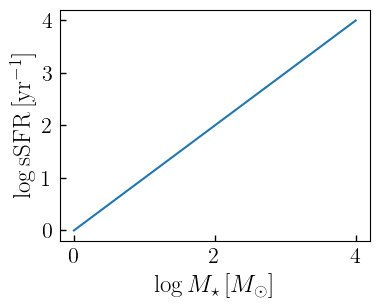

In [142]:
plt.plot(np.arange(5))
plt.xlabel(r'$\log M_\star\,[M_\odot]$')
plt.ylabel(r'$\log \rm{sSFR}\,[\rm{yr}^{-1}]$')           

In [57]:
def adjust_lightness(color, amount=0.5):
    import matplotlib.colors as mc
    import colorsys
    try:
        c = mc.cnames[color]
    except:
        c = color
    c = colorsys.rgb_to_hls(*mc.to_rgb(c))
    return colorsys.hls_to_rgb(c[0], max(0, min(1, amount * c[1])), c[2])


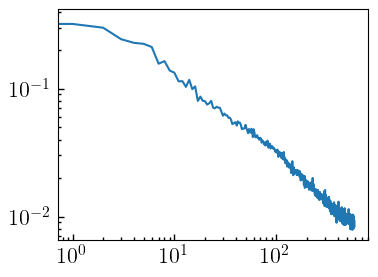

In [63]:
params_arr_S2T = np.load(data_path+"SMDPL_to_TNG_v1_params.npy")
loss_arr_S2T = np.load(data_path+"SMDPL_to_TNG_v1_loss.npy")
plt.plot(loss_arr_S2T)
plt.yscale('log')
plt.xscale('log')

time i 25.173630952835083
time i 20.047738075256348
time i 6.8191139698028564
time i 1.630082130432129


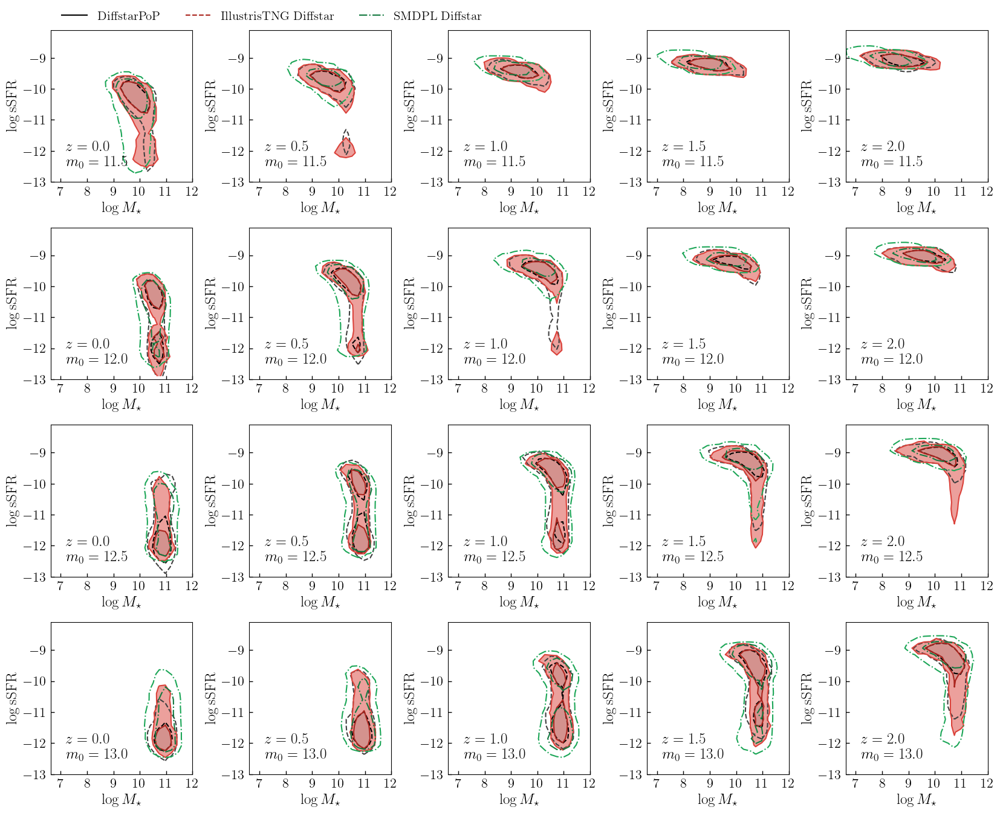

In [87]:

colors = ["#0077BB", "#33BBEE", "#009988", "#EE7733", "#CC3311", "#EE3377", '#882255', '#AA4499']
colors_test = plt.get_cmap("Greys")(np.linspace(0.3,0.7, 3))
colors_greys = plt.get_cmap("Greys")(np.array([0.8, 1.0]))

n_histories = int(5e4)
ran_key = jran.PRNGKey(0)

nbins_x = np.linspace(6.5, 12, 25)
nbins_y = np.linspace(-13, -8.0, 25)

smooth = False
_fact = 4
lgt = jnp.log10(t_table)

histories_TNG_arr = []
histories_SMDPL_arr = []

t_table = np.linspace(1.0, TODAY, 100)
z_table = np.array([z_at_value(Planck13.age, x * u.Gyr, zmin=-1) for x in t_table])
_ids = np.argmin(np.subtract.outer(z_table, np.arange(0,2.1,0.5))**2, axis=0)[::-1]


for i, bin_id in enumerate(range(4)):
    t0 = time.time()

    _mask = (logmpeak > logm0_binmids[bin_id] - logm0_bin_widths[bin_id]) 
    _mask &= (logmpeak < logm0_binmids[bin_id] + logm0_bin_widths[bin_id])

    histories_TNG_arr.append(sm_sfr_history_diffstar_scan_XsfhXmah_vmap(
        t_table,
        jnp.log10(t_table),
        _get_dt_array(t_table),
        mah_params_arr[_mask][:, np.array([1,2,4,5])],
        u_fit_params_arr[_mask][:,np.array([0,1,2,4])],
        u_fit_params_arr[_mask][:,5:9],
        index_select,
        index_high,
        fstar_tdelay,
    ))
    _mask = (logmpeak_SMDPL > logm0_binmids[bin_id] - logm0_bin_widths[bin_id]) 
    _mask &= (logmpeak_SMDPL < logm0_binmids[bin_id] + logm0_bin_widths[bin_id])
    histories_SMDPL_arr.append(sm_sfr_history_diffstar_scan_XsfhXmah_vmap(
        t_table,
        jnp.log10(t_table),
        _get_dt_array(t_table),
        mah_params_arr_SMDPL[_mask][:, np.array([1,2,4,5])],
        u_fit_params_arr_SMDPL[_mask][:,np.array([0,1,2,4])],
        u_fit_params_arr_SMDPL[_mask][:,5:9],
        index_select,
        index_high,
        fstar_tdelay,
    ))
    t1 = time.time()
    print("time i", t1-t0)
    
colors_ = plt.get_cmap("RdYlGn")(np.array([0.1,0.9]))
colors_TNG = [
    adjust_lightness(colors_[0], amount=1.1),
    adjust_lightness(colors_[0], amount=0.8),
]
colors_SMDPL = [
    adjust_lightness(colors_[1], amount=1.1),
    adjust_lightness(colors_[1], amount=0.8),
]

id_S2T = 580

fig, ax = plt.subplots(4, 5, figsize=(5*_fact,4*_fact))
for i, bin_id in enumerate(range(4)):
    t0 = time.time()
    histories = draw_sfh_MIX(
        t_table,
        logm0_binmids[bin_id],
        halo_data_MC.reshape(len(logm0_binmids),Nhalos,4)[bin_id],
        p50.reshape(len(logm0_binmids),Nhalos)[bin_id],
        n_histories,
        ran_key,
        index_select,
        index_high,
        fstar_tdelay,
        params_arr_S2T[id_S2T][0:N_PDF_Q],
        params_arr_S2T[id_S2T][N_PDF_Q:N_PDF_Q+N_PDF_MS],
        params_arr_S2T[id_S2T][N_PDF_Q+N_PDF_MS:N_PDF_Q+N_PDF_MS+N_R_Q],
        params_arr_S2T[id_S2T][N_PDF_Q+N_PDF_MS+N_R_Q:N_PDF_Q+N_PDF_MS+N_R_Q+N_R_MS],
    )

    weights = histories[4].copy()

    # for j, t_id in enumerate(t_sel_hists[::-1]):
    for j, t_id in enumerate(_ids[::-1]):

        t0 = time.time()
        xdata = np.log10(histories[0][:, t_id])
        ydata = np.log10(histories[1][:, t_id] / histories[0][:, t_id])
        
        density_contour(xdata, ydata, nbins_x, nbins_y, ax=ax[i,j], smooth=smooth, weights=weights, level=0.68, linestyles=['--'], colors=[colors_greys[1]])
        density_contour(xdata, ydata, nbins_x, nbins_y, ax=ax[i,j], smooth=smooth, weights=weights, level=0.95, linestyles=['--'], colors=[colors_greys[0]])

        xdata = np.log10(histories_TNG_arr[bin_id][0][:, t_id])
        ydata = np.log10(histories_TNG_arr[bin_id][1][:, t_id] / histories_TNG_arr[bin_id][0][:, t_id])
        density_contour(xdata, ydata, nbins_x, nbins_y, ax=ax[i,j], smooth=smooth, weights=None, level=0.68, linestyles=['-'], colors=[colors_TNG[1]])
        density_contour(xdata, ydata, nbins_x, nbins_y, ax=ax[i,j], smooth=smooth, weights=None, level=0.95, linestyles=['-'], colors=[colors_TNG[0]])
        density_contourf(xdata, ydata, nbins_x, nbins_y, ax=ax[i,j], smooth=smooth, levels=[0.0, .68, 0.95], colors=colors_TNG, alpha=0.5)

        xdata = np.log10(histories_SMDPL_arr[bin_id][0][:, t_id])
        ydata = np.log10(histories_SMDPL_arr[bin_id][1][:, t_id] / histories_SMDPL_arr[bin_id][0][:, t_id])
        density_contour(xdata, ydata, nbins_x, nbins_y, ax=ax[i,j], smooth=smooth, weights=None, level=0.68, linestyles=['-.'], colors=[colors_SMDPL[1]])
        density_contour(xdata, ydata, nbins_x, nbins_y, ax=ax[i,j], smooth=smooth, weights=None, level=0.95, linestyles=['-.'], colors=[colors_SMDPL[0]])
        # density_contourf(xdata, ydata, nbins_x, nbins_y, ax=ax[i,j], smooth=smooth, levels=[0.0, .68, 0.95], colors=colors_SMDPL, alpha=0.8)
        t1 = time.time()
        # print("time j", t1-t0)
        
        ax[i,j].text(7.2, -12.5, r"$m_0 = %.1f$"%logm0_binmids[bin_id], fontsize=18)
        ax[i,j].text(7.2, -12.5+0.5, r"$z = %.1f$"%abs(z_table[t_id]), fontsize=18)
        ax[i,j].set_xlabel(r'$\log M_\star$')
        ax[i,j].set_ylabel(r'$\log \rm{sSFR}$')
        ax[i,j].set_xticks(np.arange(7,12.1,1))
        ax[i,j].set_yticks(np.arange(-13,-8.9,1))
        
fig.subplots_adjust(wspace=0.4, hspace=0.3)

legend_elements = [
    Line2D([0], [0], color='k', ls='-', label=r'DiffstarPoP'),
    Line2D([0], [0], color=colors_TNG[1], ls='--', label=r'IllustrisTNG Diffstar'),
    Line2D([0], [0], color=colors_SMDPL[1], ls='-.', label=r'SMDPL Diffstar'),
    # Patch(facecolor=colors_TNG[0], edgecolor=colors_TNG[1], label=r'IllustrisTNG Diffstar'),
    # Patch(facecolor=colors_SMDPL[0], edgecolor=colors_SMDPL[1], label=r'SMDPL Diffstar'),
]
ax[0,0].legend(handles=legend_elements, loc=2, ncol=3, bbox_to_anchor=(0.0, 1.2), fontsize=18)
# fig.savefig("mstar_vs_ssfr_diffstarpop_smdpl_v2.png", bbox_inches="tight", dpi=300)
plt.show()
        